# Carga de los datos

In [1]:
import pandas as pd
df_unido = pd.read_csv('EDAdatos.csv', low_memory= False)

In [2]:
df_unido.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 239935 entries, 0 to 239934
Data columns (total 53 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   Unnamed: 0            239935 non-null  int64  
 1   index                 239935 non-null  int64  
 2   num_expediente        239935 non-null  object 
 3   fecha                 239935 non-null  object 
 4   hora                  239935 non-null  object 
 5   localizacion          239935 non-null  object 
 6   numero                239927 non-null  object 
 7   cod_distrito          239927 non-null  float64
 8   distrito              239927 non-null  object 
 9   tipo_accidente        239932 non-null  object 
 10  estado_meteorológico  214052 non-null  object 
 11  tipo_vehiculo         238827 non-null  object 
 12  tipo_persona          239932 non-null  object 
 13  rango_edad            239935 non-null  object 
 14  sexo                  239935 non-null  object 
 15  

In [10]:
df_unido.tipo_accidente.value_counts()

tipo_accidente
Colisión fronto-lateral         60715
Alcance                         56970
Colisión lateral                35489
Choque contra obstáculo fijo    28596
Colisión múltiple               16388
Atropello a persona             15624
Caída                           14063
Colisión frontal                 5795
Otro                             3950
Solo salida de la vía             954
Vuelco                            928
Atropello a animal                444
Despeñamiento                      16
Name: count, dtype: int64

## Previsualización de los datos

In [ ]:
df_unido['rango_edad'].value_counts()

rango_edad
Desconocido        27090
De 40 a 44 años    25478
De 25 a 29 años    25454
De 30 a 34 años    25234
De 35 a 39 años    24260
De 45 a 49 años    24066
De 50 a 54 años    20831
De 55 a 59 años    16676
De 21 a 24 años    16578
De 60 a 64 años    10879
De 18 a 20 años     7703
Más de 74 años      5386
De 65 a 69 años     5251
De 70 a 74 años     3514
Menor de 5 años     2431
De 10 a 14 años     2330
De 15 a 17 años     1944
De 6 a 9 años       1601
Name: count, dtype: int64

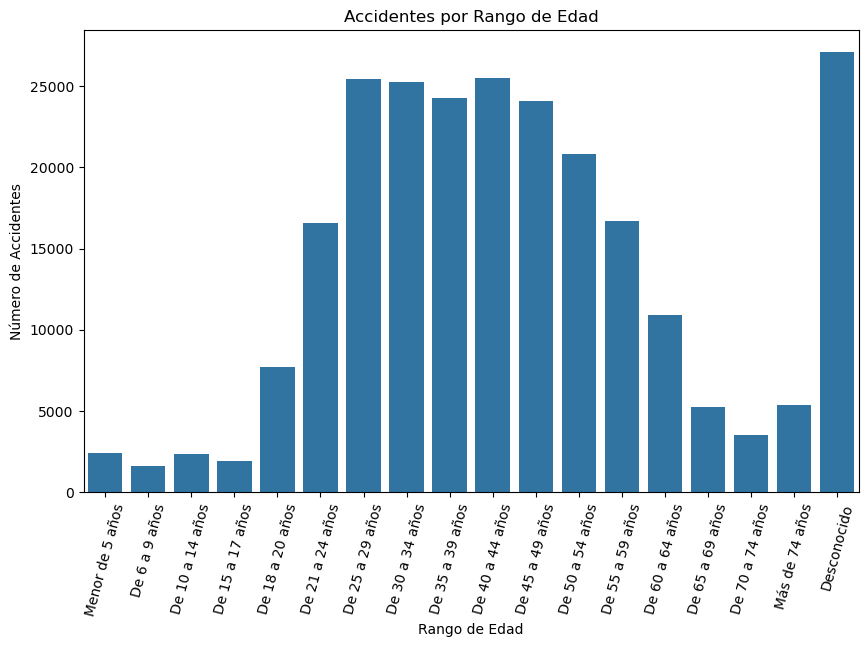

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Extraer el primer número de cada rango de edad
df_unido['edad_numerica'] = df_unido['rango_edad'].str.extract(r'De (\d+)').astype(float)

# Reemplazar valores específicos para edades extremas
df_unido.loc[df_unido['rango_edad'] == 'Menor de 5 años', 'edad_numerica'] = 2
df_unido.loc[df_unido['rango_edad'] == 'Más de 74 años', 'edad_numerica'] = 100

# Ordenar el DataFrame por 'edad_numerica'
df_unido = df_unido.sort_values('edad_numerica')

# Agrupar los datos por rango de edad y contar la frecuencia
age_counts = df_unido.groupby('rango_edad').size().reset_index(name='counts')

# Ordenar 'rango_edad' según 'edad_numerica'
age_counts = age_counts.merge(df_unido[['rango_edad', 'edad_numerica']].drop_duplicates(), on='rango_edad')
age_counts = age_counts.sort_values('edad_numerica')

# Crear una figura y un eje
fig, ax = plt.subplots(figsize=(10, 6))

# Crear el gráfico de barras con Seaborn
sns.barplot(x='rango_edad', y='counts', data=age_counts, ax=ax)

# Configurar las etiquetas y el título del gráfico
ax.set_xlabel('Rango de Edad')
ax.set_ylabel('Número de Accidentes')
ax.set_title('Accidentes por Rango de Edad')

# Rotar las etiquetas del eje x para una mejor legibilidad
plt.xticks(rotation=75)
df_unido.drop(columns=['edad_numerica'])
# Mostrar el gráfico
plt.show()


In [ ]:
df_unido = df_unido.sort_index()

In [13]:
# Convertir la columna 'fecha' y 'hora' a formato datetime
df_unido['fecha_hora'] = ''
for index, row in df_unido.iterrows():
    df_unido['fecha_hora'].at[index] = str(df_unido['fecha'].at[index]).split(' ')[0] + ' ' + str(df_unido['hora'].at[index])
df_unido['fecha_hora']

0          2019-02-04 9:10:00
1          2019-02-04 9:10:00
2          2019-01-01 3:45:00
3          2019-01-01 3:45:00
4          2019-01-01 3:45:00
                 ...         
239930     2024-06-01 3:28:00
239931    2024-05-17 15:15:00
239932    2024-05-17 15:15:00
239933    2024-06-03 13:10:00
239934    2024-06-03 13:10:00
Name: fecha_hora, Length: 239935, dtype: object

In [17]:
df_unido['fecha_hora'] = pd.to_datetime(df_unido['fecha_hora'], format='%Y-%m-%d %H:%M:%S')
df_unido['fecha_hora']

0        2019-02-04 09:10:00
1        2019-02-04 09:10:00
2        2019-01-01 03:45:00
3        2019-01-01 03:45:00
4        2019-01-01 03:45:00
                 ...        
239930   2024-06-01 03:28:00
239931   2024-05-17 15:15:00
239932   2024-05-17 15:15:00
239933   2024-06-03 13:10:00
239934   2024-06-03 13:10:00
Name: fecha_hora, Length: 239935, dtype: datetime64[ns]

### Análisis temporal: 

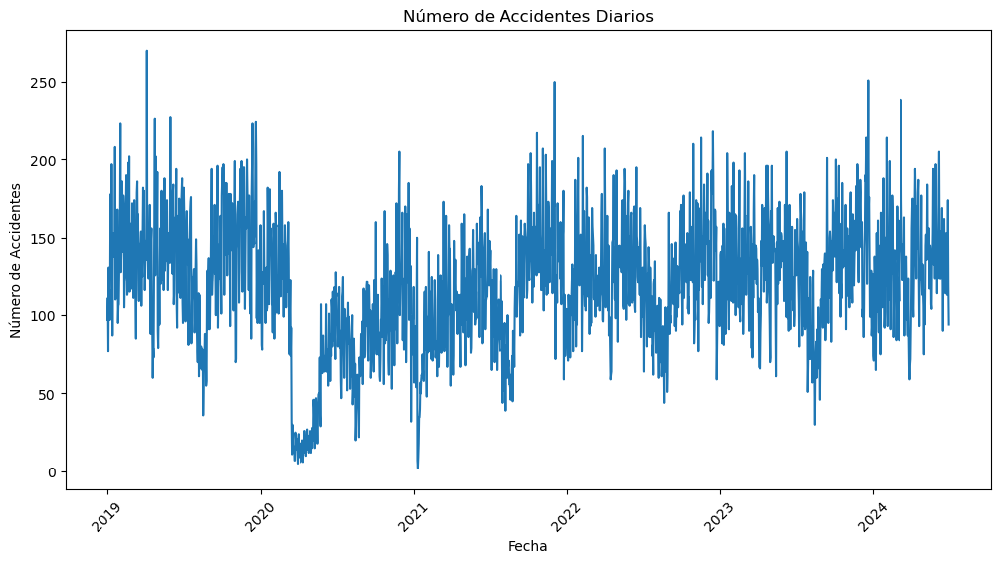

In [24]:
# Agrupar por fecha y contar el número de accidentes
accidentes_diarios = df_unido.groupby('fecha').size()

# Convertir el resultado a un DataFrame
df_accidentes_diarios = accidentes_diarios.reset_index(name='num_accidentes')

import matplotlib.pyplot as plt
import seaborn as sns

# Crear una figura y un eje
fig, ax = plt.subplots(figsize=(12, 6))

# Graficar usando seaborn
sns.lineplot(data=df_accidentes_diarios, x='fecha', y='num_accidentes', ax=ax)


# Configurar etiquetas y título
ax.set_xlabel('Fecha')
ax.set_ylabel('Número de Accidentes')
ax.set_title('Número de Accidentes Diarios')

# Rotar etiquetas del eje x para mejor legibilidad
plt.xticks(rotation=45)

# Mostrar el gráfico
plt.show()


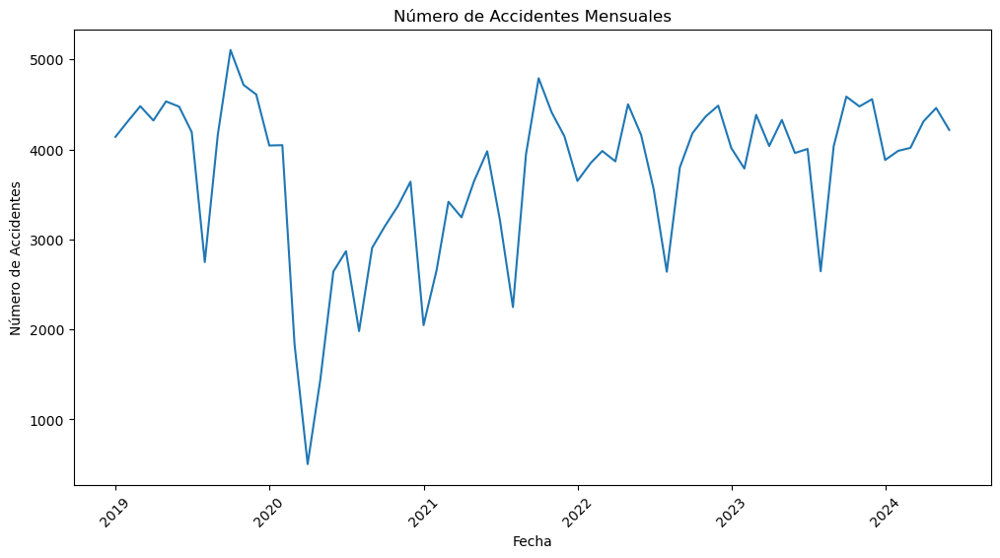

In [ ]:
# Extraer el año y el mes de la columna 'fecha_hora'
df_unido['año_mes'] = df_unido['fecha_hora'].dt.to_period('M')

# Agrupar por año y mes y contar el número de accidentes
accidentes_mensuales = df_unido.groupby('año_mes').size()

# Convertir el resultado a un DataFrame
df_accidentes_mensuales = accidentes_mensuales.reset_index(name='num_accidentes')

# Convertir 'año_mes' a datetime para la visualización
df_accidentes_mensuales['año_mes'] = df_accidentes_mensuales['año_mes'].dt.to_timestamp()

import matplotlib.pyplot as plt
import seaborn as sns

# Crear una figura y un eje
fig, ax = plt.subplots(figsize=(12, 6))

# Graficar usando seaborn
sns.lineplot(data=df_accidentes_mensuales, x='año_mes', y='num_accidentes', ax=ax)

# Configurar etiquetas y título
ax.set_xlabel('Fecha')
ax.set_ylabel('Número de Accidentes')
ax.set_title('Número de Accidentes Mensuales')

# Rotar etiquetas del eje x para mejor legibilidad
plt.xticks(rotation=45)

# Mostrar el gráfico
plt.show()


In [ ]:
df_unido.groupby(['mes']).size()

mes
1.0     21775
2.0     22646
3.0     22110
4.0     20285
5.0     22911
6.0     23435
7.0     17838
8.0     12264
9.0     18857
10.0    21806
11.0    21337
12.0    21442
dtype: int64

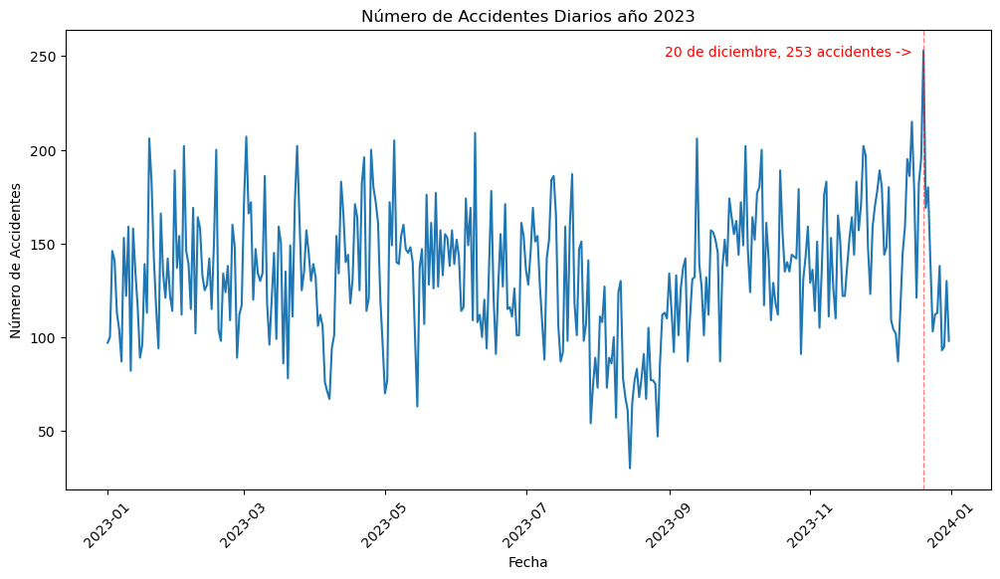

In [ ]:
# Agrupar por fecha y contar el número de accidentes
accidentes_diarios = df_unido[df_unido['año'] == 2023].groupby('fecha').size()

# Convertir el resultado a un DataFrame
df_accidentes_diarios = accidentes_diarios.reset_index(name='num_accidentes')

import matplotlib.pyplot as plt
import seaborn as sns

# Crear una figura y un eje
fig, ax = plt.subplots(figsize=(12, 6))

# Graficar usando seaborn
sns.lineplot(data=df_accidentes_diarios, x='fecha', y='num_accidentes', ax=ax)
ax.axvline(x=pd.to_datetime('2023-12-20', format= '%Y-%m-%d'), color='r', linestyle='--', linewidth=1, label='20 de diciembre, 253', alpha=0.5)
ax.text(x=pd.to_datetime('2023-08-30', format= '%Y-%m-%d'), y=250, s='20 de diciembre, 253 accidentes ->', color='r', fontsize=10)
# Configurar etiquetas y título
ax.set_xlabel('Fecha')
ax.set_ylabel('Número de Accidentes')
ax.set_title('Número de Accidentes Diarios año 2023')

# Rotar etiquetas del eje x para mejor legibilidad
plt.xticks(rotation=45)

# Mostrar el gráfico
plt.show()


In [26]:
df_unido.fecha.info()

<class 'pandas.core.series.Series'>
RangeIndex: 239935 entries, 0 to 239934
Series name: fecha
Non-Null Count   Dtype         
--------------   -----         
239935 non-null  datetime64[ns]
dtypes: datetime64[ns](1)
memory usage: 1.8 MB


2024-11-07 03:11:38,681 - INFO - Procesando el año 2019 con 50478 registros.
2024-11-07 03:11:38,753 - INFO - Procesando el año 2020 con 31470 registros.
2024-11-07 03:11:38,831 - INFO - Procesando el año 2021 con 40689 registros.
2024-11-07 03:11:38,919 - INFO - Procesando el año 2022 con 45760 registros.
2024-11-07 03:11:38,997 - INFO - Procesando el año 2023 con 47371 registros.
2024-11-07 03:11:39,077 - INFO - Procesando el año 2024 con 24167 registros.


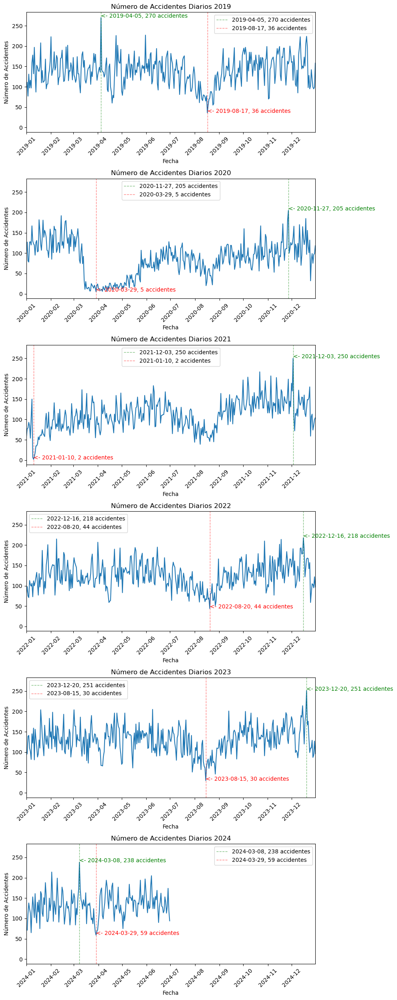

In [7]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import logging

# Configurar el logging
logging.basicConfig(level=logging.INFO, format='%(asctime)s - %(levelname)s - %(message)s')

# Asegúrate de que la columna 'fecha' esté en formato datetime
if not pd.api.types.is_datetime64_any_dtype(df_unido['fecha']):
    df_unido['fecha'] = pd.to_datetime(df_unido['fecha'], errors='coerce')

# Verificar si hay valores NaT después de la conversión
if df_unido['fecha'].isnull().any():
    logging.warning("Hay valores nulos en la columna 'fecha' después de la conversión a datetime.")

# Crear una figura con 6 subplots (3 filas x 2 columnas)
fig, axes = plt.subplots(nrows=6, ncols=1, figsize=(10,25), sharex=False, sharey=True)

# Aplanar la matriz de ejes para iterar fácilmente
axes = axes.flatten()

# Iterar sobre cada año y su subplot correspondiente
for i, año in enumerate(range(2019, 2025)):
    # Filtrar datos para el año actual
    df_anio = df_unido[df_unido['año'] == año]
    
    if df_anio.empty:
        logging.warning(f"No hay datos para el año {año}.")
        # Puedes optar por omitir este subplot o dejarlo vacío
        axes[i].set_title(f'No hay datos para el año {año}')
        axes[i].axis('off')  # Ocultar el eje si no hay datos
        continue

    logging.info(f"Procesando el año {año} con {len(df_anio)} registros.")

    # Agrupar por fecha y contar el número de accidentes
    accidentes_diarios = df_anio.groupby('fecha').size()
    
    # Encontrar el valor máximo y la fecha correspondiente
    max_accidentes = accidentes_diarios.max()
    max_fecha = accidentes_diarios.idxmax()
    
    # Encontrar el valor mínimo y la fecha correspondiente
    min_accidentes = accidentes_diarios.min()
    min_fecha = accidentes_diarios.idxmin()
    
    # Convertir el resultado a un DataFrame
    df_accidentes_diarios = accidentes_diarios.reset_index(name='num_accidentes')
    
    # Graficar en el subplot correspondiente
    sns.lineplot(data=df_accidentes_diarios, x='fecha', y='num_accidentes', ax=axes[i])
    
    # Definir los límites del eje x
    inicio_año = pd.to_datetime(f'{año}-01-01')
    fin_año = pd.to_datetime(f'{año}-12-31')
    axes[i].set_xlim([inicio_año, fin_año])
    
    # Añadir una línea vertical y un texto para el máximo
    axes[i].axvline(x=max_fecha, color='g', linestyle='--', linewidth=1, label=f"{max_fecha.strftime('%Y-%m-%d')}, {max_accidentes} accidentes", alpha=0.5)
    axes[i].text(max_fecha, max_accidentes, f"<- {max_fecha.strftime('%Y-%m-%d')}, {max_accidentes} accidentes", color='g', fontsize=10)
    
    # Añadir una línea vertical y un texto para el mínimo
    axes[i].axvline(x=min_fecha, color='r', linestyle='--', linewidth=1, label=f"{min_fecha.strftime('%Y-%m-%d')}, {min_accidentes} accidentes", alpha=0.5)
    axes[i].text(min_fecha, min_accidentes, f"<- {min_fecha.strftime('%Y-%m-%d')}, {min_accidentes} accidentes", color='r', fontsize=10)
    
    # Configurar el título del subplot
    axes[i].set_title(f'Número de Accidentes Diarios {año}')
    axes[i].set_xlabel('Fecha')
    axes[i].set_ylabel('Número de Accidentes')
    axes[i].tick_params(axis='x', rotation=45)
    
    # Opcional: Añadir leyenda si es necesario
    axes[i].legend()

# Ajustar el espacio entre subplots
plt.tight_layout()

# Mostrar el gráfico
plt.show()


Accidentes por hora del día:

In [ ]:
df_unido['hora']

0          9:10:00
1          9:10:00
2          3:45:00
3          3:45:00
4          3:45:00
            ...   
246701     3:28:00
246702    15:15:00
246703    15:15:00
246704    13:10:00
246705    13:10:00
Name: hora, Length: 246706, dtype: object

In [ ]:
hora_temporal = pd.to_datetime(df_unido['hora'], format='%H:%M:%S')
accidents_per_time = hora_temporal.value_counts().sort_index()
accidents_per_time.index

DatetimeIndex(['1900-01-01 00:00:00', '1900-01-01 00:01:00',
               '1900-01-01 00:02:00', '1900-01-01 00:03:00',
               '1900-01-01 00:04:00', '1900-01-01 00:05:00',
               '1900-01-01 00:06:00', '1900-01-01 00:07:00',
               '1900-01-01 00:08:00', '1900-01-01 00:09:00',
               ...
               '1900-01-01 23:50:00', '1900-01-01 23:51:00',
               '1900-01-01 23:52:00', '1900-01-01 23:53:00',
               '1900-01-01 23:54:00', '1900-01-01 23:55:00',
               '1900-01-01 23:56:00', '1900-01-01 23:57:00',
               '1900-01-01 23:58:00', '1900-01-01 23:59:00'],
              dtype='datetime64[ns]', name='hora', length=1429, freq=None)

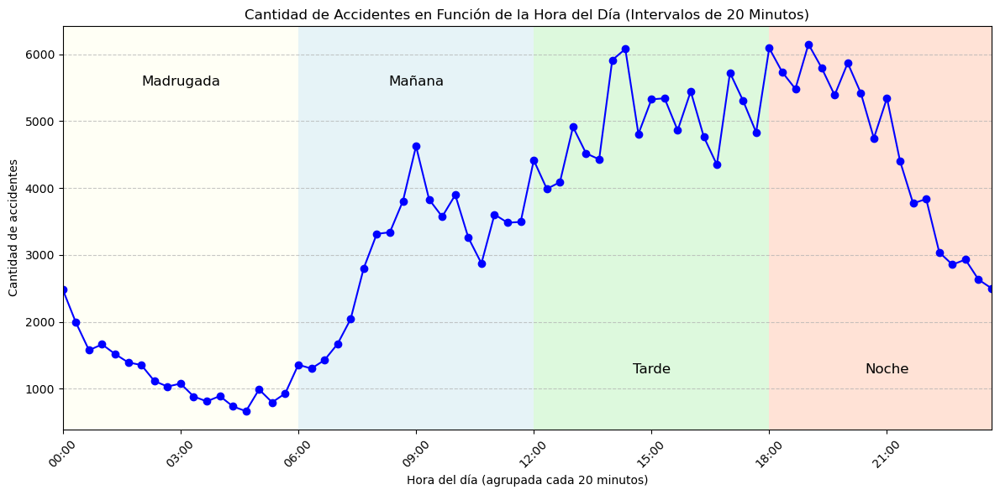

In [ ]:
# Convertir la columna 'hora' a datetime sin modificar el DataFrame original
hora_temporal = pd.to_datetime(df_unido['hora'], format='%H:%M:%S')

# Agrupar los minutos en intervalos de 20 minutos
hora_temporal_agrupada = hora_temporal.dt.floor('20min')

# Contar la cantidad de accidentes por cada intervalo de 20 minutos
accidents_per_time = hora_temporal_agrupada.value_counts().sort_index()

# Convertir el índice a una cadena en formato de hora para evitar la parte de la fecha
accidents_per_time.index = accidents_per_time.index.strftime('%H:%M')

# Crear la figura
plt.figure(figsize=(12, 6))

# Graficar la cantidad de accidentes por cada intervalo de 20 minutos
plt.plot(accidents_per_time.index, accidents_per_time.values, marker='o', linestyle='-', color='b')
plt.xlabel('Hora del día (agrupada cada 20 minutos)')
plt.ylabel('Cantidad de accidentes')
plt.title('Cantidad de Accidentes en Función de la Hora del Día (Intervalos de 20 Minutos)')

# Añadir divisiones del día y cambiar el color del fondo
plt.axvspan(0, 18, facecolor='lightyellow', alpha=0.3)  # Madrugada (00:00-06:00, en intervalos de 20 minutos)
plt.axvspan(18, 36, facecolor='lightblue', alpha=0.3)  # Mañana (06:00-12:00, en intervalos de 20 minutos)
plt.axvspan(36, 54, facecolor='lightgreen', alpha=0.3)  # Tarde (12:00-18:00, en intervalos de 20 minutos)
plt.axvspan(54, 72, facecolor='lightsalmon', alpha=0.3)  # Noche (18:00-24:00, en intervalos de 20 minutos)

# Añadir texto para cada parte del día
plt.text(9, max(accidents_per_time.values) * 0.9, 'Madrugada', fontsize=12, color='black', ha='center')
plt.text(27, max(accidents_per_time.values) * 0.9, 'Mañana', fontsize=12, color='black', ha='center')
plt.text(45, max(accidents_per_time.values) * 0.2, 'Tarde', fontsize=12, color='black', ha='center')
plt.text(63, max(accidents_per_time.values) * 0.2, 'Noche', fontsize=12, color='black', ha='center')

# Ajustar límites y etiquetas del eje x
plt.xticks(ticks=range(0, len(accidents_per_time), 9), labels=accidents_per_time.index[::9], rotation=45)
plt.xlim(0, len(accidents_per_time) - 1)

# Mostrar la gráfica
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()




Por hora y por día:

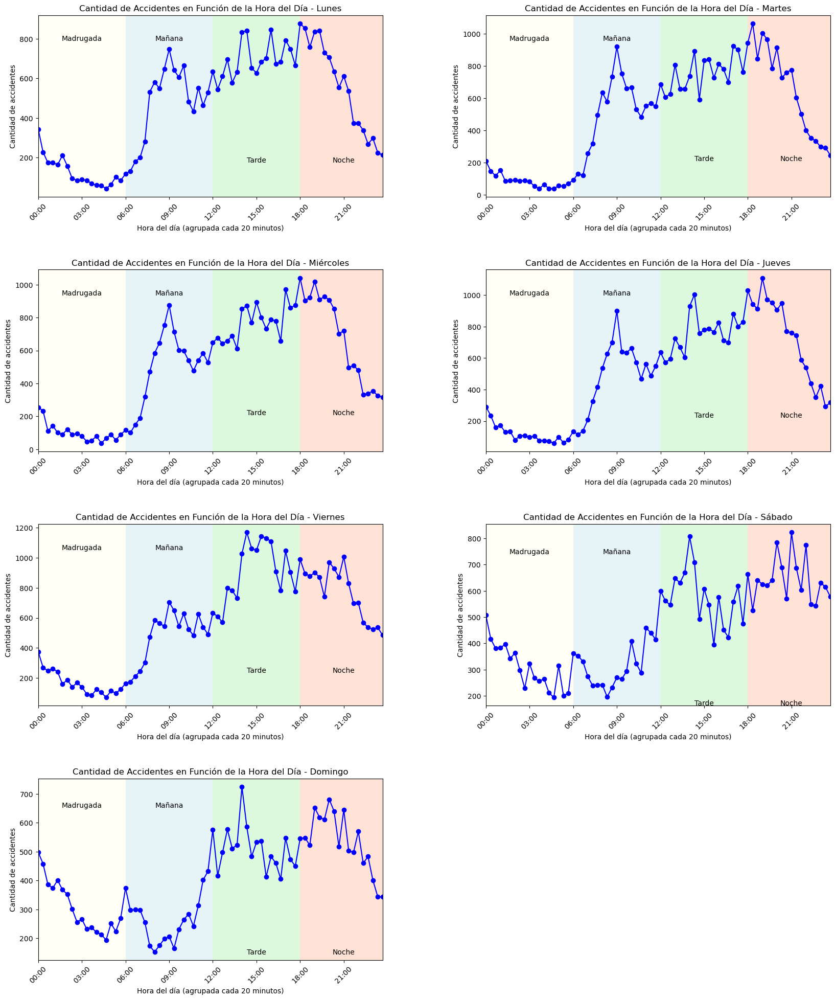

In [ ]:
# Convertir la columna 'hora' a datetime sin modificar el DataFrame original
hora_temporal = pd.to_datetime(df_unido['hora'], format='%H:%M:%S')

# Convertir la columna 'fecha' a datetime y extraer el día de la semana
df_unido['fecha'] = pd.to_datetime(df_unido['fecha'], format='%Y-%m-%d')
df_unido['dia_semana'] = df_unido['fecha'].dt.day_name()

# Cambiar los nombres de los días de la semana a español
dias_semana = ['Lunes', 'Martes', 'Miércoles', 'Jueves', 'Viernes', 'Sábado', 'Domingo']
df_unido['dia_semana'] = df_unido['dia_semana'].replace({
    'Monday': 'Lunes', 'Tuesday': 'Martes', 'Wednesday': 'Miércoles',
    'Thursday': 'Jueves', 'Friday': 'Viernes', 'Saturday': 'Sábado', 'Sunday': 'Domingo'
})

# Crear una copia temporal con la hora agrupada por intervalos de 20 minutos y agregar el día de la semana
df_unido['hora_agrupada'] = hora_temporal.dt.floor('20min')

# Crear una figura con 7 subplots (uno para cada día de la semana)
fig, axes = plt.subplots(4, 2, figsize=(20, 24))  # 3 filas, 3 columnas (dejar uno vacío para mejor legibilidad)
axes = axes.flatten()  # Aplanar la matriz de ejes para acceder a ellos más fácilmente

# Graficar cada día de la semana en un subplot diferente
for i, dia in enumerate(dias_semana):
    # Filtrar los datos por el día de la semana
    df_filtrado = df_unido[df_unido['dia_semana'] == dia]
    
    # Contar la cantidad de accidentes por cada intervalo de 20 minutos
    accidents_per_time = df_filtrado['hora_agrupada'].value_counts().sort_index()

    # Convertir el índice a una cadena en formato de hora para evitar la parte de la fecha
    accidents_per_time.index = accidents_per_time.index.strftime('%H:%M')

    # Graficar la cantidad de accidentes por cada intervalo de 20 minutos
    ax = axes[i]
    ax.plot(accidents_per_time.index, accidents_per_time.values, marker='o', linestyle='-', color='b')
    ax.set_xlabel('Hora del día (agrupada cada 20 minutos)')
    ax.set_ylabel('Cantidad de accidentes')
    ax.set_title(f'Cantidad de Accidentes en Función de la Hora del Día - {dia}')

    # Añadir divisiones del día y cambiar el color del fondo
    ax.axvspan(0, 18, facecolor='lightyellow', alpha=0.3)  # Madrugada (00:00-06:00, en intervalos de 20 minutos)
    ax.axvspan(18, 36, facecolor='lightblue', alpha=0.3)  # Mañana (06:00-12:00, en intervalos de 20 minutos)
    ax.axvspan(36, 54, facecolor='lightgreen', alpha=0.3)  # Tarde (12:00-18:00, en intervalos de 20 minutos)
    ax.axvspan(54, 72, facecolor='lightsalmon', alpha=0.3)  # Noche (18:00-24:00, en intervalos de 20 minutos)

    # Añadir texto para cada parte del día
    ax.text(9, max(accidents_per_time.values) * 0.9 if not accidents_per_time.empty else 1, 'Madrugada', fontsize=10, color='black', ha='center')
    ax.text(27, max(accidents_per_time.values) * 0.9 if not accidents_per_time.empty else 1, 'Mañana', fontsize=10, color='black', ha='center')
    ax.text(45, max(accidents_per_time.values) * 0.2 if not accidents_per_time.empty else 1, 'Tarde', fontsize=10, color='black', ha='center')
    ax.text(63, max(accidents_per_time.values) * 0.2 if not accidents_per_time.empty else 1, 'Noche', fontsize=10, color='black', ha='center')

    # Ajustar límites y etiquetas del eje x
    ax.set_xticks(range(0, len(accidents_per_time), 9))
    ax.set_xticklabels(accidents_per_time.index[::9], rotation=45)
    ax.set_xlim(0, len(accidents_per_time) - 1)

# Eliminar el subplot vacío (el último de la cuadrícula)
fig.delaxes(axes[-1])

# Ajustar el layout para que las gráficas no se solapen
plt.subplots_adjust(hspace=0.4, wspace=0.3)

# Mostrar las gráficas
plt.show()


Días festivos:

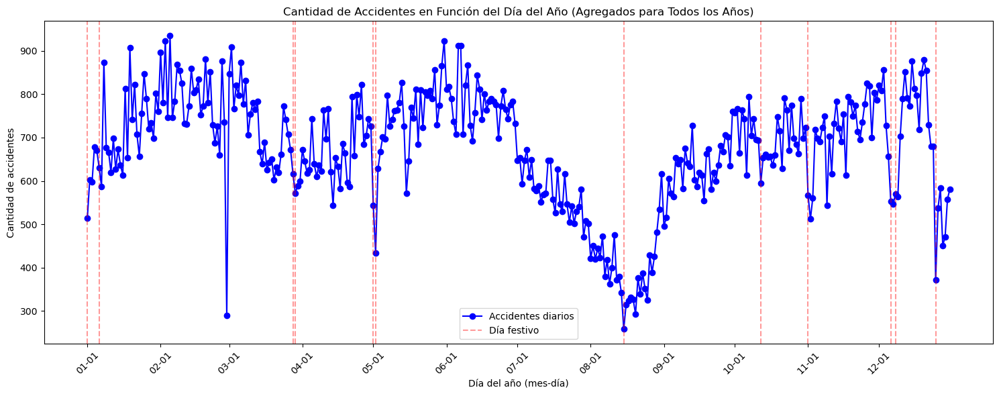

In [ ]:
# Convertir la columna 'fecha' a datetime
df_unido['fecha'] = pd.to_datetime(df_unido['fecha'], format='%Y-%m-%d')

# Agregar columna 'mes_dia' para representar cada día del año sin diferenciar entre años
df_unido['mes_dia'] = df_unido['fecha'].dt.strftime('%m-%d')

# Contar la cantidad de accidentes por cada día del año (sin diferenciar entre años)
accidents_per_day = df_unido['mes_dia'].value_counts().sort_index()

# Lista de días festivos (sin diferenciar entre años)
festivos_madrid = [
    '01-01',  # Año Nuevo
    '01-06',  # Reyes Magos
    '03-28',  # Jueves Santo (ejemplo para 2024)
    '03-29',  # Viernes Santo (ejemplo para 2024)
    '05-01',  # Día del Trabajador
    '05-02',  # Día de la Comunidad de Madrid
    '08-15',  # Asunción de la Virgen
    '10-12',  # Día de la Hispanidad
    '11-01',  # Día de Todos los Santos
    '12-06',  # Día de la Constitución
    '12-08',  # Inmaculada Concepción
    '12-25',  # Navidad
]

# Crear la figura
plt.figure(figsize=(15, 6))

# Graficar la cantidad de accidentes por cada día del año
plt.plot(accidents_per_day.index, accidents_per_day.values, marker='o', linestyle='-', color='b', label='Accidentes diarios')

# Añadir líneas discontinuas para los días festivos
for festivo in festivos_madrid:
    if festivo in accidents_per_day.index:
        plt.axvline(x=festivo, color='r', linestyle='--', alpha=0.4, label='Día festivo' if festivo == festivos_madrid[0] else "")

# Etiquetas y título
plt.xlabel('Día del año (mes-día)')
plt.ylabel('Cantidad de accidentes')
plt.title('Cantidad de Accidentes en Función del Día del Año (Agregados para Todos los Años)')

# Configurar los ticks del eje x para mostrar únicamente los primeros días de cada mes
meses = ['01-01', '02-01', '03-01', '04-01', '05-01', '06-01', '07-01', '08-01', '09-01', '10-01', '11-01', '12-01']
plt.xticks(ticks=[accidents_per_day.index.get_loc(mes) for mes in meses if mes in accidents_per_day.index], labels=meses, rotation=45)

plt.legend()

# Ajustar el layout para mejor visualización
plt.tight_layout()

# Mostrar la gráfica
plt.show()

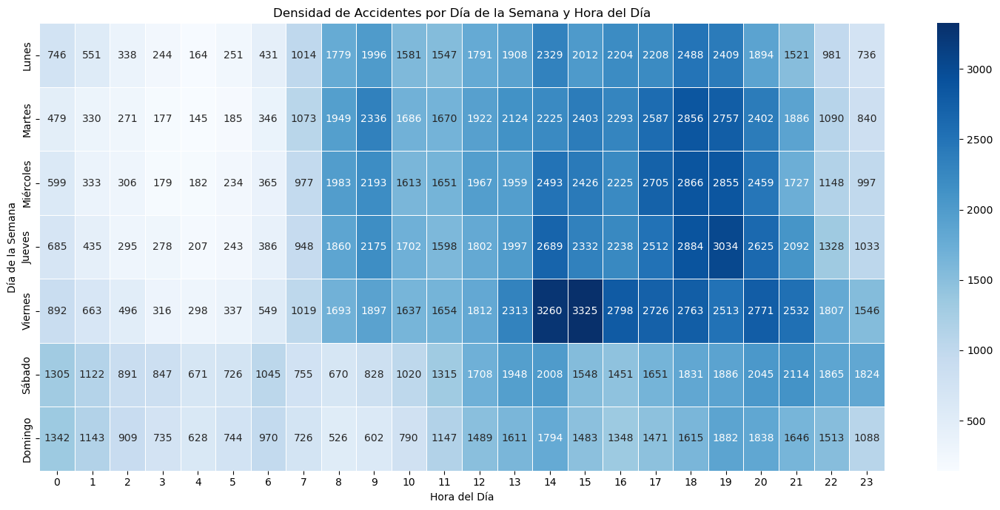

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Cargar el DataFrame 'df_unido' desde el archivo CSV proporcionado
df_unido = pd.read_csv('df_precat_test.csv', low_memory=False)

# Convertir la columna 'fecha' a datetime
df_unido['fecha'] = pd.to_datetime(df_unido['fecha'], format='%Y-%m-%d')

# Extraer el día de la semana y la hora del día
df_unido['dia_semana'] = df_unido['fecha'].dt.day_name()

# Traducir los nombres de los días de la semana al español
df_unido['dia_semana'] = df_unido['dia_semana'].replace({
    'Monday': 'Lunes', 'Tuesday': 'Martes', 'Wednesday': 'Miércoles',
    'Thursday': 'Jueves', 'Friday': 'Viernes', 'Saturday': 'Sábado', 'Sunday': 'Domingo'
})

# Convertir la columna 'hora' a datetime y extraer la hora
df_unido['hora'] = pd.to_datetime(df_unido['hora'], format='%H:%M:%S').dt.hour

# Crear una tabla de frecuencias para accidentes por día de la semana y hora del día
heatmap_data = df_unido.pivot_table(index='dia_semana', columns='hora', values='fecha', aggfunc='count')

# Reordenar los días de la semana para comenzar en lunes
dias_ordenados = ['Lunes', 'Martes', 'Miércoles', 'Jueves', 'Viernes', 'Sábado', 'Domingo']
heatmap_data = heatmap_data.reindex(dias_ordenados)

# Crear el heatmap
plt.figure(figsize=(15, 7))
sns.heatmap(heatmap_data, cmap='Blues', annot=True, fmt=".0f", linewidths=.5)
plt.title('Densidad de Accidentes por Día de la Semana y Hora del Día')
plt.xlabel('Hora del Día')
plt.ylabel('Día de la Semana')

# Mostrar la gráfica
plt.tight_layout()
plt.show()



Se ve que existen distribuciones claramente distintas según dia de diario o fin de semana

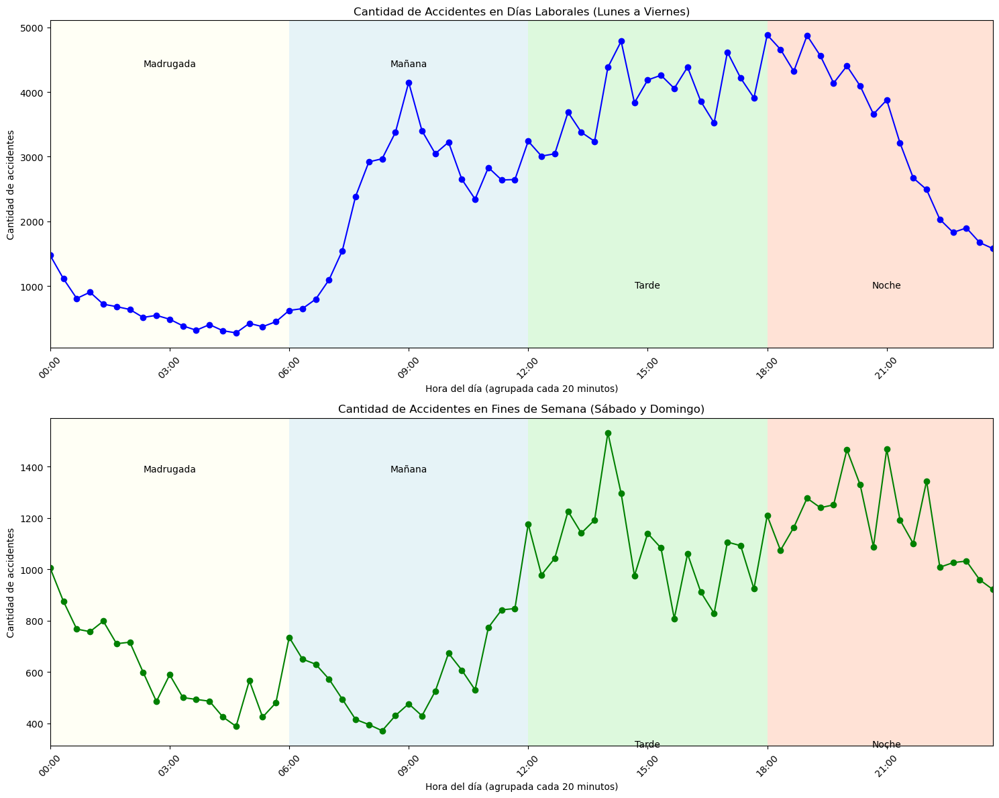

In [ ]:
df_unido = pd.read_csv('df_precat_test.csv', low_memory=False)
# Convertir la columna 'hora' a datetime sin modificar el DataFrame original
hora_temporal = pd.to_datetime(df_unido['hora'], format='%H:%M:%S')

# Convertir la columna 'fecha' a datetime y extraer el día de la semana
fecha_temporal = pd.to_datetime(df_unido['fecha'], format='%Y-%m-%d')
dia_semana_temporal = fecha_temporal.dt.day_name()

# Cambiar los nombres de los días de la semana a español
dia_semana_temporal = dia_semana_temporal.replace({
    'Monday': 'Lunes', 'Tuesday': 'Martes', 'Wednesday': 'Miércoles',
    'Thursday': 'Jueves', 'Friday': 'Viernes', 'Saturday': 'Sábado', 'Sunday': 'Domingo'
})

# Crear una columna temporal con la hora agrupada por intervalos de 20 minutos
hora_agrupada_temporal = hora_temporal.dt.floor('20min')

# Crear una figura con 2 subplots: Días laborales y fines de semana
fig, axes = plt.subplots(2, 1, figsize=(15, 12))

# Días laborales (Lunes a Viernes)
dias_laborales = ['Lunes', 'Martes', 'Miércoles', 'Jueves', 'Viernes']
df_laborales = pd.DataFrame({'hora_agrupada': hora_agrupada_temporal, 'dia_semana': dia_semana_temporal})
df_laborales = df_laborales[df_laborales['dia_semana'].isin(dias_laborales)]
accidents_laborales = df_laborales['hora_agrupada'].value_counts().sort_index()

# Convertir el índice a una cadena en formato de hora para evitar la parte de la fecha
accidents_laborales.index = accidents_laborales.index.strftime('%H:%M')

# Graficar la cantidad de accidentes por cada intervalo de 20 minutos para días laborales
ax = axes[0]
ax.plot(accidents_laborales.index, accidents_laborales.values, marker='o', linestyle='-', color='b')
ax.set_xlabel('Hora del día (agrupada cada 20 minutos)')
ax.set_ylabel('Cantidad de accidentes')
ax.set_title('Cantidad de Accidentes en Días Laborales (Lunes a Viernes)')

# Añadir divisiones del día y cambiar el color del fondo
ax.axvspan(0, 18, facecolor='lightyellow', alpha=0.3)  # Madrugada (00:00-06:00)
ax.axvspan(18, 36, facecolor='lightblue', alpha=0.3)  # Mañana (06:00-12:00)
ax.axvspan(36, 54, facecolor='lightgreen', alpha=0.3)  # Tarde (12:00-18:00)
ax.axvspan(54, 72, facecolor='lightsalmon', alpha=0.3)  # Noche (18:00-24:00)

# Añadir texto para cada parte del día
ax.text(9, max(accidents_laborales.values) * 0.9 if not accidents_laborales.empty else 1, 'Madrugada', fontsize=10, color='black', ha='center')
ax.text(27, max(accidents_laborales.values) * 0.9 if not accidents_laborales.empty else 1, 'Mañana', fontsize=10, color='black', ha='center')
ax.text(45, max(accidents_laborales.values) * 0.2 if not accidents_laborales.empty else 1, 'Tarde', fontsize=10, color='black', ha='center')
ax.text(63, max(accidents_laborales.values) * 0.2 if not accidents_laborales.empty else 1, 'Noche', fontsize=10, color='black', ha='center')

# Ajustar límites y etiquetas del eje x
ax.set_xticks(range(0, len(accidents_laborales), 9))
ax.set_xticklabels(accidents_laborales.index[::9], rotation=45)
ax.set_xlim(0, len(accidents_laborales) - 1)

# Fines de semana (Sábado y Domingo)
dias_finde = ['Sábado', 'Domingo']
df_finde = pd.DataFrame({'hora_agrupada': hora_agrupada_temporal, 'dia_semana': dia_semana_temporal})
df_finde = df_finde[df_finde['dia_semana'].isin(dias_finde)]
accidents_finde = df_finde['hora_agrupada'].value_counts().sort_index()

# Convertir el índice a una cadena en formato de hora para evitar la parte de la fecha
accidents_finde.index = accidents_finde.index.strftime('%H:%M')

# Graficar la cantidad de accidentes por cada intervalo de 20 minutos para fines de semana
ax = axes[1]
ax.plot(accidents_finde.index, accidents_finde.values, marker='o', linestyle='-', color='g')
ax.set_xlabel('Hora del día (agrupada cada 20 minutos)')
ax.set_ylabel('Cantidad de accidentes')
ax.set_title('Cantidad de Accidentes en Fines de Semana (Sábado y Domingo)')

# Añadir divisiones del día y cambiar el color del fondo
ax.axvspan(0, 18, facecolor='lightyellow', alpha=0.3)  # Madrugada (00:00-06:00)
ax.axvspan(18, 36, facecolor='lightblue', alpha=0.3)  # Mañana (06:00-12:00)
ax.axvspan(36, 54, facecolor='lightgreen', alpha=0.3)  # Tarde (12:00-18:00)
ax.axvspan(54, 72, facecolor='lightsalmon', alpha=0.3)  # Noche (18:00-24:00)

# Añadir texto para cada parte del día
ax.text(9, max(accidents_finde.values) * 0.9 if not accidents_finde.empty else 1, 'Madrugada', fontsize=10, color='black', ha='center')
ax.text(27, max(accidents_finde.values) * 0.9 if not accidents_finde.empty else 1, 'Mañana', fontsize=10, color='black', ha='center')
ax.text(45, max(accidents_finde.values) * 0.2 if not accidents_finde.empty else 1, 'Tarde', fontsize=10, color='black', ha='center')
ax.text(63, max(accidents_finde.values) * 0.2 if not accidents_finde.empty else 1, 'Noche', fontsize=10, color='black', ha='center')

# Ajustar límites y etiquetas del eje x
ax.set_xticks(range(0, len(accidents_finde), 9))
ax.set_xticklabels(accidents_finde.index[::9], rotation=45)
ax.set_xlim(0, len(accidents_finde) - 1)

# Ajustar el layout para que las gráficas no se solapen
plt.subplots_adjust(hspace=0.4)

# Mostrar las gráficas
plt.tight_layout()
plt.show()

Por lo tanto queda pendiente, el poder usar como variable categórica las vairables que caractericen los dias de dairio y los fin de semana

#### Análisis espacial

In [ ]:
df_unido = pd.read_csv('df_precat_test.csv')
df_unido.info()

C:\Users\JUAMARIO\AppData\Local\Temp\ipykernel_17584\2348655701.py:1: DtypeWarning: Columns (37,38) have mixed types. Specify dtype option on import or set low_memory=False.
  df_unido = pd.read_csv('df_precat_test.csv')


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 240801 entries, 0 to 240800
Data columns (total 53 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   Unnamed: 0            240801 non-null  int64  
 1   index                 240801 non-null  int64  
 2   num_expediente        240801 non-null  object 
 3   fecha                 240801 non-null  object 
 4   hora                  240801 non-null  object 
 5   localizacion          240801 non-null  object 
 6   numero                240793 non-null  object 
 7   cod_distrito          240793 non-null  float64
 8   distrito              240793 non-null  object 
 9   tipo_accidente        240798 non-null  object 
 10  estado_meteorológico  214836 non-null  object 
 11  tipo_vehiculo         239691 non-null  object 
 12  tipo_persona          240798 non-null  object 
 13  rango_edad            240801 non-null  object 
 14  sexo                  240801 non-null  object 
 15  

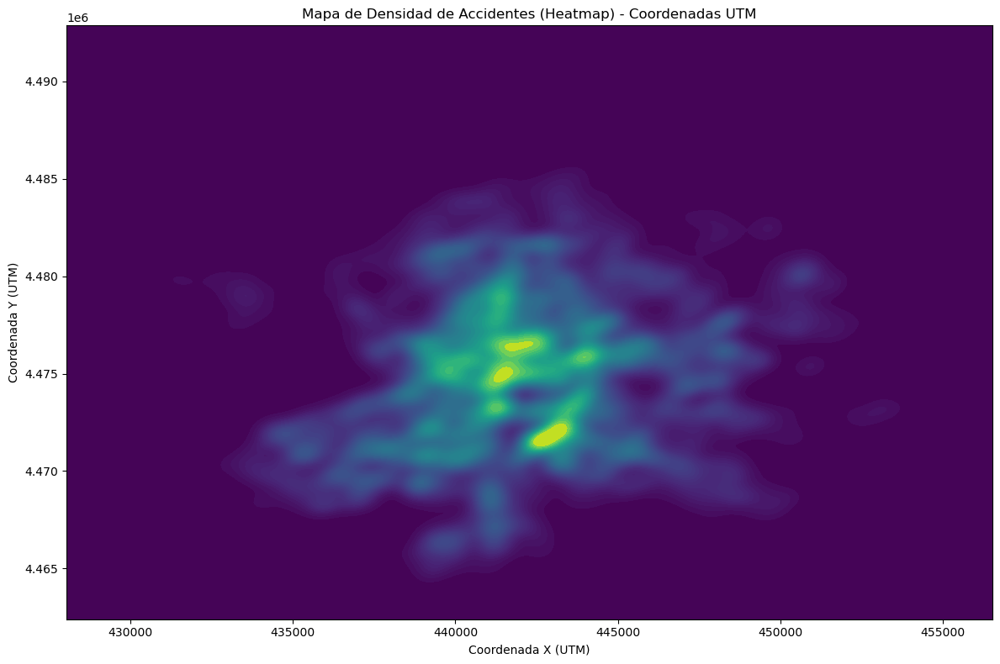

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

df_unido = pd.read_csv('df_precat_test.csv', low_memory=False)

# Filtrar las columnas necesarias para el análisis espacial
# Utilizar 'coordenada_x_utm' y 'coordenada_y_utm'
df_unido_filtered = df_unido[['coordenada_x_utm', 'coordenada_y_utm']].dropna()

# Crear un heatmap de densidad de accidentes utilizando seaborn
plt.figure(figsize=(12, 8))

# Crear un histograma bidimensional para estimar la densidad con mejor eficiencia y algo más de resolución
sns.kdeplot(
    x=df_unido_filtered['coordenada_x_utm'],
    y=df_unido_filtered['coordenada_y_utm'],
    cmap='viridis',
    fill=True,
    bw_adjust=0.8,  # Ajustar el ancho de banda para un balance entre suavizado y detalle
    thresh=0,
    levels=50,  # Moderado aumento de niveles para más detalle sin exceder
    gridsize=300  # Gridsize ajustado para un buen balance entre calidad y eficiencia
)

# Etiquetas y título
plt.xlabel('Coordenada X (UTM)')
plt.ylabel('Coordenada Y (UTM)')
plt.title('Mapa de Densidad de Accidentes (Heatmap) - Coordenadas UTM')

# Mostrar el gráfico
plt.tight_layout()
plt.show()


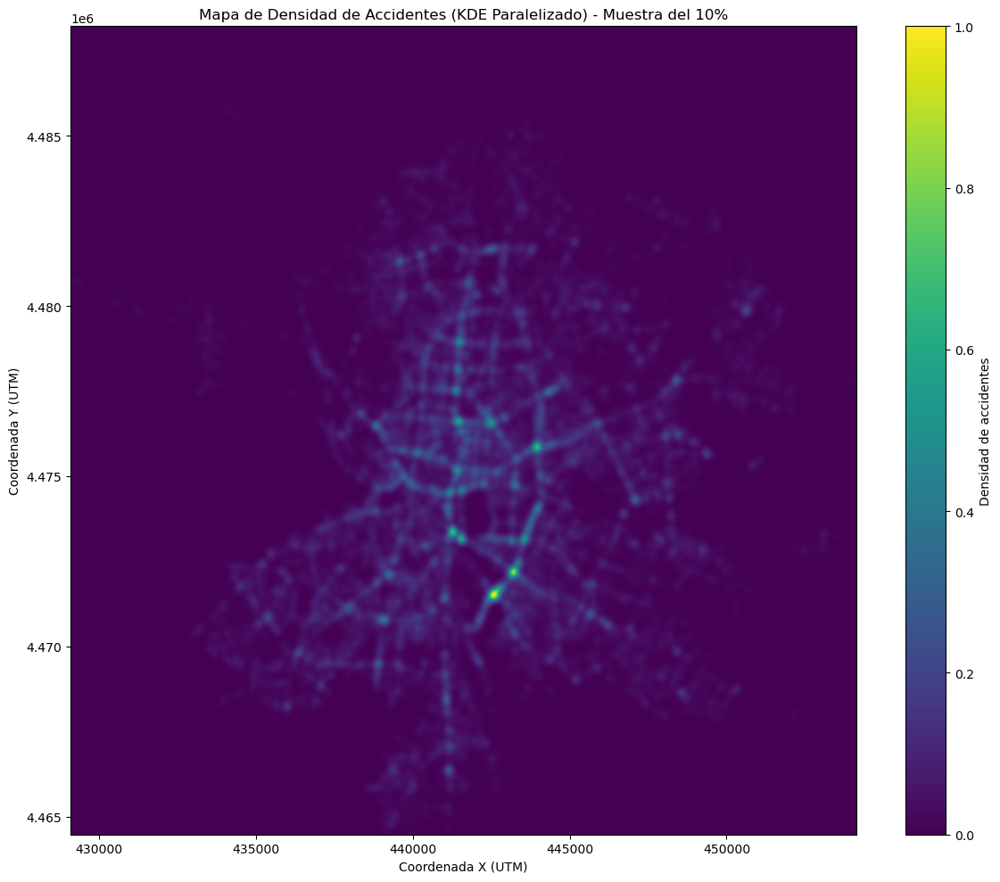

In [15]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.neighbors import KernelDensity
from joblib import Parallel, delayed

# 1. Cargar los datos
df_unido = pd.read_csv('EDAdatos.csv', low_memory=False)

# 2. Filtrar las columnas necesarias y eliminar filas con valores NaN
df_unido_filtered = df_unido[['coordenada_x_utm', 'coordenada_y_utm']].dropna()

# 3. Reducir el conjunto de datos al 10% de forma aleatoria
df_sampled = df_unido_filtered.sample(frac=0.1, random_state=42)

# 4. Extraer las coordenadas
X = df_sampled[['coordenada_x_utm', 'coordenada_y_utm']].values

# 5. Definir el grid para evaluar la densidad con mayor resolución
grid_size = 1000  # Aumenta este número para mayor resolución
xmin, xmax = X[:,0].min(), X[:,0].max()
ymin, ymax = X[:,1].min(), X[:,1].max()
xx, yy = np.mgrid[xmin:xmax:complex(grid_size), ymin:ymax:complex(grid_size)]
grid_coords = np.vstack([xx.ravel(), yy.ravel()]).T

# 6. Dividir los datos en chunks para paralelización
num_cores = -1  # Usa todos los núcleos disponibles
data_chunks = np.array_split(X, num_cores if num_cores > 0 else 1)

# 7. Definir una función para calcular KDE en un chunk
def compute_kde(chunk, grid_coords):
    kde = KernelDensity(bandwidth=100, kernel='gaussian')  # Ajusta 'bandwidth' según sea necesario
    kde.fit(chunk)
    log_density = kde.score_samples(grid_coords)
    return np.exp(log_density)

# 8. Ejecutar el cálculo en paralelo
results = Parallel(n_jobs=num_cores)(
    delayed(compute_kde)(chunk, grid_coords) for chunk in data_chunks
)

# 9. Sumar las densidades calculadas en cada chunk
density = np.sum(results, axis=0)

# 10. Normalizar la densidad si es necesario
density /= np.max(density)

# 11. Convertir la densidad en una matriz para el plot
density_matrix = density.reshape((grid_size, grid_size))

# 12. Crear el gráfico con mayor resolución
plt.figure(figsize=(12, 10))
plt.imshow(
    np.rot90(density_matrix),
    cmap='viridis',
    extent=[xmin, xmax, ymin, ymax],
    aspect='auto'
)
plt.colorbar(label='Densidad de accidentes')
plt.xlabel('Coordenada X (UTM)')
plt.ylabel('Coordenada Y (UTM)')
plt.title('Mapa de Densidad de Accidentes (KDE Paralelizado) - Muestra del 10%')
plt.tight_layout()
plt.show()




#### Análisis espacio-temporal:

In [6]:
accidentes_gdf['accidente_density'].describe()

count    246706.000000
mean          0.256131
std           0.400729
min           0.000283
25%           0.065124
50%           0.136544
75%           0.284874
max           9.410431
Name: accidente_density, dtype: float64

C:\Users\JUAMARIO\AppData\Local\Temp\ipykernel_20996\581652835.py:10: DtypeWarning: Columns (37,38) have mixed types. Specify dtype option on import or set low_memory=False.
  df_accidentes = pd.read_csv('EDAdatos.csv')
C:\Users\JUAMARIO\AppData\Local\Temp\ipykernel_20996\581652835.py:36: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = plt.cm.get_cmap('RdYlGn_r')  # Invertido para que verde sea baja densidad y rojo alta
c:\Users\JUAMARIO\anaconda3\Lib\site-packages\contextily\tile.py:645: UserWarning: The inferred zoom level of 27 is not valid for the current tile provider (valid zooms: 0 - 19).
  warnings.warn(msg)


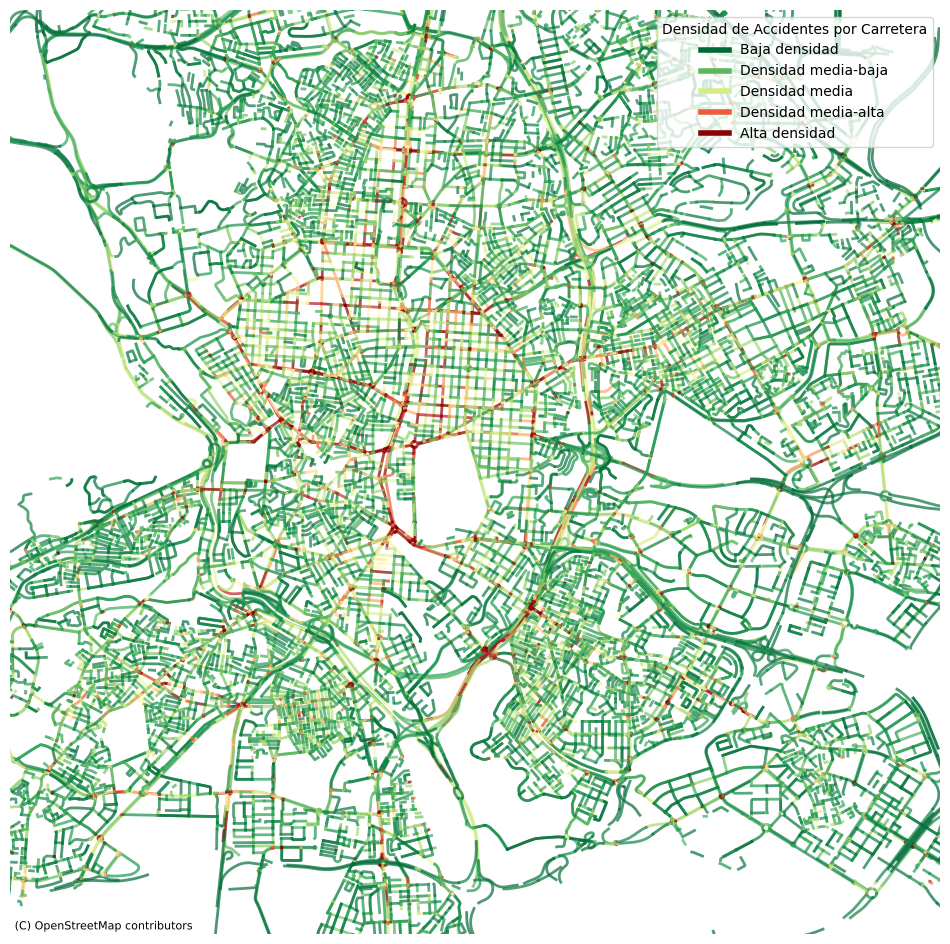

In [5]:
import geopandas as gpd
import pandas as pd
from shapely import wkt
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import contextily as ctx
from matplotlib.lines import Line2D

# Cargar el DataFrame de accidentes
df_accidentes = pd.read_csv('EDAdatos.csv')

# Convertir la columna 'geometry' de WKT a geometría de GeoPandas
df_accidentes['geometry'] = df_accidentes['geometry'].apply(wkt.loads)

# Convertir el DataFrame a GeoDataFrame
accidentes_gdf = gpd.GeoDataFrame(df_accidentes, geometry='geometry', crs="EPSG:4326")

# Agrupar por la columna 'u_v_k' para contar los accidentes por carretera
accidentes_por_carretera = df_accidentes.groupby('u_v_k').size().reset_index(name='accidente_count')

# Unir los datos de accidentes al GeoDataFrame original
accidentes_gdf = accidentes_gdf.merge(accidentes_por_carretera, on='u_v_k', how='left')

# Asegurarse de que la columna 'length' esté en kilómetros
# Si está en metros, convertirla a kilómetros
if accidentes_gdf['length'].max() > 1000:  # Asumiendo que si la longitud máxima es mayor a 1000, está en metros
    accidentes_gdf['length'] = accidentes_gdf['length'] / 1000  # Convertir a kilómetros

# Calcular la densidad de accidentes por longitud
accidentes_gdf['accidente_density'] = accidentes_gdf['accidente_count'] / accidentes_gdf['length']

# Determinar el umbral para valores atípicos (cuartil del 80%)
threshold = accidentes_gdf['accidente_density'].quantile(0.80)

# Crear un colormap desde verde hasta rojo
cmap = plt.cm.get_cmap('RdYlGn_r')  # Invertido para que verde sea baja densidad y rojo alta
norm = mcolors.Normalize(vmin=accidentes_gdf['accidente_density'].min(), 
                         vmax=threshold)

# Función para mapear densidad a color
def map_color(density):
    if density >= threshold:
        return 'darkred'
    else:
        return cmap(norm(density))

# Reproyectar a Web Mercator para usar con contextily
accidentes_gdf = accidentes_gdf.to_crs(epsg=3857)

# Crear la figura y el eje
fig, ax = plt.subplots(figsize=(12, 12))

# Añadir el mapa base con opacidad ajustada
ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik, alpha=0.5)

# Plotear las carreteras, coloreándolas según la densidad de accidentes
for _, row in accidentes_gdf.drop_duplicates(subset='u_v_k').iterrows():
    if row['accidente_count'] > 0 and pd.notnull(row['geometry']):
        color = map_color(row['accidente_density'])
        ax.plot(*row['geometry'].xy, color=color, linewidth=2, alpha=0.7)

# Ajustar los límites del mapa a la extensión de los datos
ax.set_xlim(accidentes_gdf.total_bounds[[0, 2]]+[9000,-9000])
ax.set_ylim(accidentes_gdf.total_bounds[[1, 3]]+[5000,-15000])

# Eliminar ejes para una mejor visualización
ax.set_axis_off()

# Añadir una leyenda personalizada
legend_elements = [
    Line2D([0], [0], color=cmap(norm(accidentes_gdf['accidente_density'].min())), lw=4, label='Baja densidad'),
    Line2D([0], [0], color=cmap(norm(accidentes_gdf['accidente_density'].quantile(0.25))), lw=4, label='Densidad media-baja'),
    Line2D([0], [0], color=cmap(norm(accidentes_gdf['accidente_density'].quantile(0.50))), lw=4, label='Densidad media'),
    Line2D([0], [0], color=cmap(norm(accidentes_gdf['accidente_density'].quantile(0.75))), lw=4, label='Densidad media-alta'),
    Line2D([0], [0], color='darkred', lw=4, label='Alta densidad')
]

ax.legend(handles=legend_elements, loc='upper right', title='Densidad de Accidentes por Carretera')

# Guardar el mapa como PNG
plt.savefig('mapa_accidentes_madrid.png', dpi=300, bbox_inches='tight')
plt.show()


In [18]:
accidentes_gdf.to_crs(epsg=3857).columns

Index(['Unnamed: 0', 'index', 'num_expediente', 'fecha', 'hora',
       'localizacion', 'numero', 'cod_distrito', 'distrito', 'tipo_accidente',
       'estado_meteorológico', 'tipo_vehiculo', 'tipo_persona', 'rango_edad',
       'sexo', 'cod_lesividad', 'lesividad', 'coordenada_x_utm',
       'coordenada_y_utm', 'positiva_alcohol', 'positiva_droga', 'longitud',
       'latitud', 'osmid', 'oneway', 'lanes', 'name', 'highway', 'maxspeed',
       'reversed', 'length', 'geometry', 'junction', 'ref', 'tunnel', 'access',
       'bridge', 'width', 'est_width', 'u_v_k', 'edgedistance', 'nodedistance',
       'dia', 'mes', 'año', 'temperatura_media', 'precipitaciones(mm)',
       'velocidad_media_aire', 'ubi', 'mapped_highway', 'speed_limit',
       'speed_bin', 'lanes_filled', 'accidente_count', 'accidente_density'],
      dtype='object')

C:\Users\JUAMARIO\AppData\Local\Temp\ipykernel_20996\124003362.py:10: DtypeWarning: Columns (37,38) have mixed types. Specify dtype option on import or set low_memory=False.
  df_accidentes = pd.read_csv('EDAdatos.csv')
C:\Users\JUAMARIO\AppData\Local\Temp\ipykernel_20996\124003362.py:36: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = plt.cm.get_cmap('RdYlGn_r')  # Invertido para que verde sea baja densidad y rojo alta
c:\Users\JUAMARIO\anaconda3\Lib\site-packages\contextily\tile.py:645: UserWarning: The inferred zoom level of 27 is not valid for the current tile provider (valid zooms: 0 - 19).
  warnings.warn(msg)


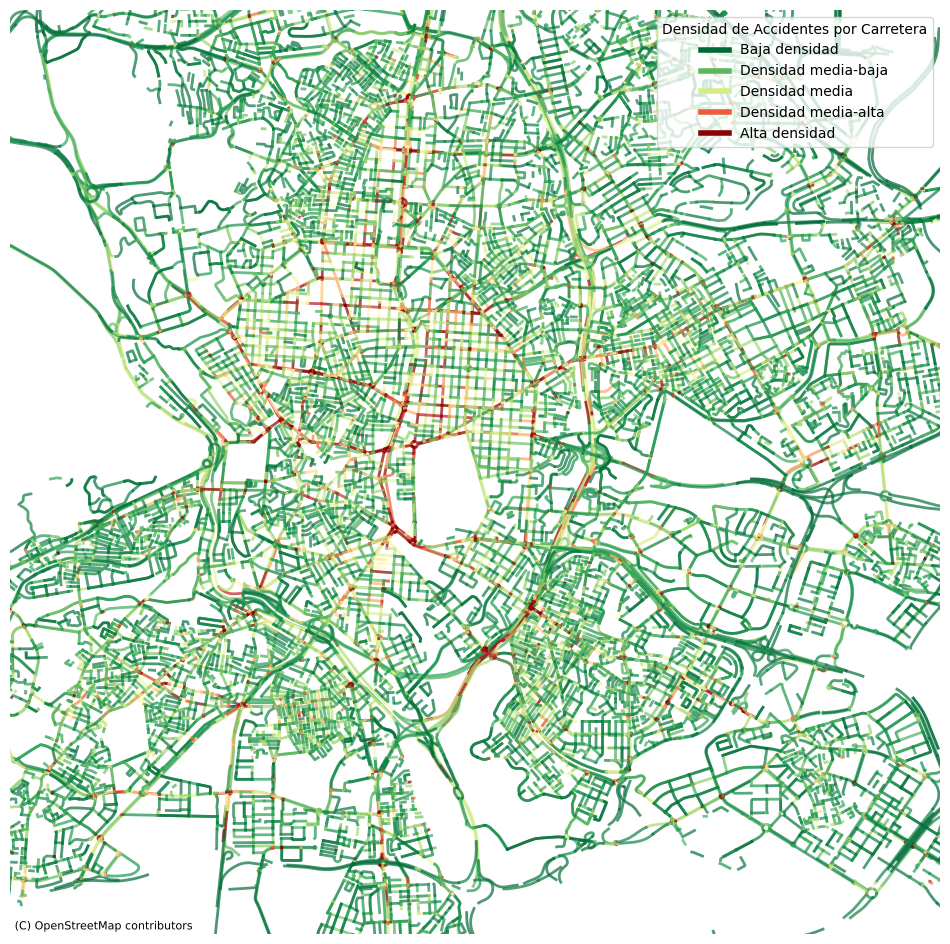

In [16]:
import geopandas as gpd
import pandas as pd
from shapely import wkt
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import contextily as ctx
from matplotlib.lines import Line2D

# Cargar el DataFrame de accidentes
df_accidentes = pd.read_csv('EDAdatos.csv')

# Convertir la columna 'geometry' de WKT a geometría de GeoPandas
df_accidentes['geometry'] = df_accidentes['geometry'].apply(wkt.loads)

# Convertir el DataFrame a GeoDataFrame
accidentes_gdf = gpd.GeoDataFrame(df_accidentes, geometry='geometry', crs="EPSG:4326")

# Agrupar por la columna 'u_v_k' para contar los accidentes por carretera
accidentes_por_carretera = df_accidentes.groupby('u_v_k').size().reset_index(name='accidente_count')

# Unir los datos de accidentes al GeoDataFrame original
accidentes_gdf = accidentes_gdf.merge(accidentes_por_carretera, on='u_v_k', how='left')

# Asegurarse de que la columna 'length' esté en kilómetros
# Si está en metros, convertirla a kilómetros
if accidentes_gdf['length'].max() > 1000:  # Asumiendo que si la longitud máxima es mayor a 1000, está en metros
    accidentes_gdf['length'] = accidentes_gdf['length'] / 1000  # Convertir a kilómetros

# Calcular la densidad de accidentes por longitud
accidentes_gdf['accidente_density'] = accidentes_gdf['accidente_count'] / accidentes_gdf['length']

# Determinar el umbral para valores atípicos (cuartil del 80%)
threshold = accidentes_gdf['accidente_density'].quantile(0.80)

# Crear un colormap desde verde hasta rojo
cmap = plt.cm.get_cmap('RdYlGn_r')  # Invertido para que verde sea baja densidad y rojo alta
norm = mcolors.Normalize(vmin=accidentes_gdf['accidente_density'].min(), 
                         vmax=threshold)

# Función para mapear densidad a color
def map_color(density):
    if density >= threshold:
        return 'darkred'
    else:
        return cmap(norm(density))

# Reproyectar a Web Mercator para usar con contextily
accidentes_gdf = accidentes_gdf.to_crs(epsg=3857)

# Crear la figura y el eje
fig, ax = plt.subplots(figsize=(12, 12))

# Añadir el mapa base con opacidad ajustada
ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik, alpha=0.5)

# Plotear las carreteras, coloreándolas según la densidad de accidentes
for _, row in accidentes_gdf.drop_duplicates(subset='u_v_k').iterrows():
    if row['accidente_count'] > 0 and pd.notnull(row['geometry']):
        color = map_color(row['accidente_density'])
        ax.plot(*row['geometry'].xy, color=color, linewidth=2, alpha=0.7)

# Ajustar los límites del mapa a la extensión de los datos
ax.set_xlim(accidentes_gdf.total_bounds[[0, 2]] + [9000, -9000])
ax.set_ylim(accidentes_gdf.total_bounds[[1, 3]] + [5000, -15000])

# Eliminar ejes para una mejor visualización
ax.set_axis_off()

# Añadir una leyenda personalizada
legend_elements = [
    Line2D([0], [0], color=cmap(norm(accidentes_gdf['accidente_density'].min())), lw=4, label='Baja densidad'),
    Line2D([0], [0], color=cmap(norm(accidentes_gdf['accidente_density'].quantile(0.25))), lw=4, label='Densidad media-baja'),
    Line2D([0], [0], color=cmap(norm(accidentes_gdf['accidente_density'].quantile(0.50))), lw=4, label='Densidad media'),
    Line2D([0], [0], color=cmap(norm(accidentes_gdf['accidente_density'].quantile(0.75))), lw=4, label='Densidad media-alta'),
    Line2D([0], [0], color='darkred', lw=4, label='Alta densidad')
]

ax.legend(handles=legend_elements, loc='upper right', title='Densidad de Accidentes por Carretera')

# Guardar el mapa como PNG
plt.savefig('mapa_accidentes_madrid.png', dpi=300, bbox_inches='tight')
plt.show()


C:\Users\JUAMARIO\AppData\Local\Temp\ipykernel_19420\1579823537.py:9: DtypeWarning: Columns (35,36) have mixed types. Specify dtype option on import or set low_memory=False.
  df_accidentes = pd.read_csv('resultado_merge_test.csv')
C:\Users\JUAMARIO\AppData\Local\Temp\ipykernel_19420\1579823537.py:35: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = plt.cm.get_cmap('RdYlGn_r')  # Invertido para que verde sea bajo y rojo alto
c:\Users\JUAMARIO\anaconda3\Lib\site-packages\contextily\tile.py:645: UserWarning: The inferred zoom level of 27 is not valid for the current tile provider (valid zooms: 0 - 19).
  warnings.warn(msg)


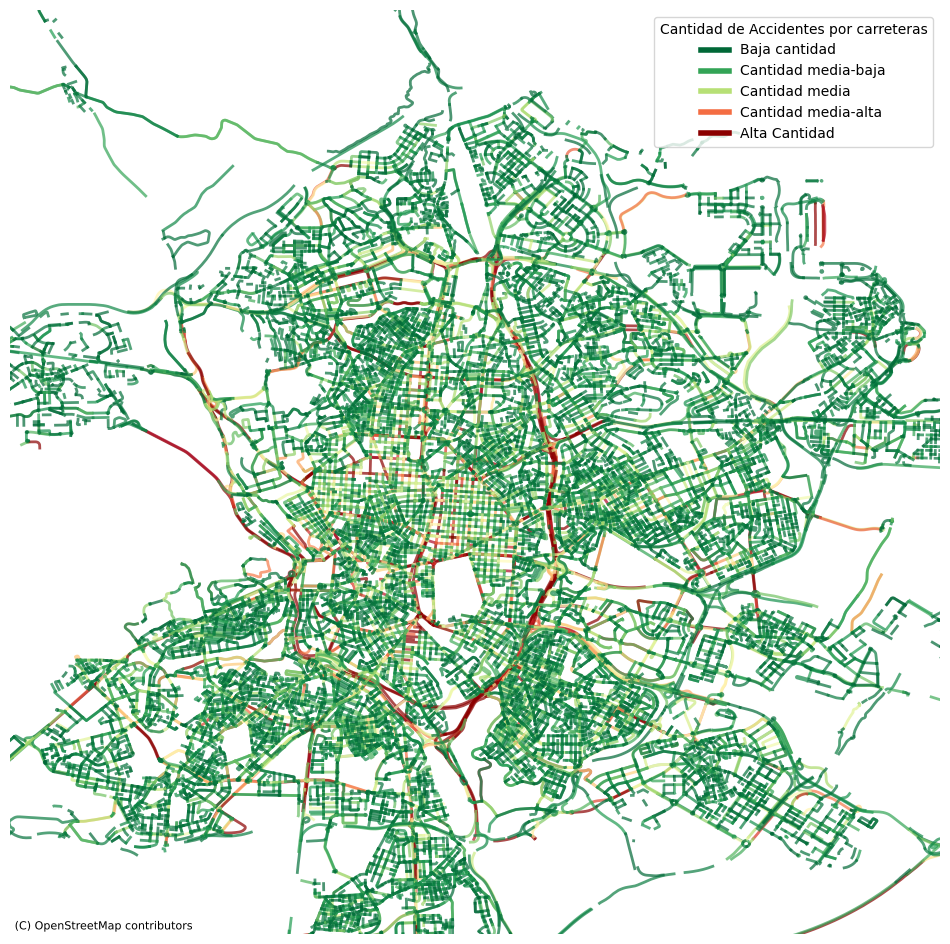

In [44]:
import geopandas as gpd
import pandas as pd
from shapely import wkt
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import contextily as ctx

# Cargar el DataFrame de accidentes
df_accidentes = pd.read_csv('resultado_merge_test.csv')

# Convertir la columna 'geometry' de WKT a geometría de GeoPandas
df_accidentes['geometry'] = df_accidentes['geometry'].apply(wkt.loads)

# Convertir el DataFrame a GeoDataFrame
accidentes_gdf = gpd.GeoDataFrame(df_accidentes, geometry='geometry', crs="EPSG:4326")

# Agrupar por la columna 'u_v_k' para contar los accidentes por carretera
accidentes_por_carretera = df_accidentes.groupby('u_v_k').size().reset_index(name='accidente_count')

# Unir los datos de accidentes al GeoDataFrame original
accidentes_gdf = accidentes_gdf.merge(accidentes_por_carretera, on='u_v_k', how='left')

# Supongamos que tienes una columna 'length' en kilómetros en tu GeoDataFrame de carreteras
# Si no la tienes, necesitarás obtenerla utilizando OSMNX o calculándola
# Aquí asumimos que 'length' está en metros, conviértelo a kilómetros
accidentes_gdf['length'] = accidentes_gdf['length'] / 1000  # Convertir a kilómetros

# Calcular la densidad de accidentes por longitud
accidentes_gdf['accidente_density'] = accidentes_gdf['accidente_count'] / accidentes_gdf['length']

# Determinar el umbral para valores atípicos (cuartil del 80%)
threshold = accidentes_gdf['accidente_count'].quantile(0.80)

# Crear un colormap desde verde hasta rojo
cmap = plt.cm.get_cmap('RdYlGn_r')  # Invertido para que verde sea bajo y rojo alto
norm = mcolors.Normalize(vmin=accidentes_gdf['accidente_count'].min(), 
                         vmax=threshold)

# Función para mapear densidad a color
def map_color(density):
    if density >= threshold:
        return 'darkred'
    else:
        return cmap(norm(density))

# Reproyectar a Web Mercator para usar con contextily
accidentes_gdf = accidentes_gdf.to_crs(epsg=3857)

# Crear la figura y el eje
fig, ax = plt.subplots(figsize=(12, 12))

# Añadir el mapa base con opacidad ajustada
ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik, alpha=0.5)

# Plotear las carreteras, coloreándolas según la densidad de accidentes
for _, row in accidentes_gdf.drop_duplicates(subset='u_v_k').iterrows():
    if row['accidente_count'] > 0 and pd.notnull(row['geometry']):
        color = map_color(row['accidente_count'])
        ax.plot(*row['geometry'].xy, color=color, linewidth=2, alpha=0.7)

# Ajustar los límites del mapa a la extensión de los datos
ax.set_xlim(accidentes_gdf.total_bounds[[0, 2]]+[5000,-5000])
ax.set_ylim(accidentes_gdf.total_bounds[[1, 3]]+[3000, -7000])

# Eliminar ejes para una mejor visualización
ax.set_axis_off()

# Añadir una leyenda personalizada
import matplotlib.patches as mpatches
from matplotlib.lines import Line2D

# Crear leyenda
legend_elements = [
    Line2D([0], [0], color=cmap(norm(accidentes_gdf['accidente_count'].min())), lw=4, label='Baja cantidad'),
    Line2D([0], [0], color=cmap(norm(accidentes_gdf['accidente_count'].quantile(0.25))), lw=4, label='Cantidad media-baja'),
    Line2D([0], [0], color=cmap(norm(accidentes_gdf['accidente_count'].quantile(0.50))), lw=4, label='Cantidad media'),
    Line2D([0], [0], color=cmap(norm(accidentes_gdf['accidente_count'].quantile(0.75))), lw=4, label='Cantidad media-alta'),
    Line2D([0], [0], color='darkred', lw=4, label='Alta Cantidad')
]

ax.legend(handles=legend_elements, loc='upper right', title='Cantidad de Accidentes por carreteras')

# Guardar el mapa como PNG
plt.savefig('mapa_accidentes_madrid_carreteras.png', dpi=300, bbox_inches='tight')
plt.show()


C:\Users\JUAMARIO\AppData\Local\Temp\ipykernel_20996\3418765519.py:11: DtypeWarning: Columns (35,36) have mixed types. Specify dtype option on import or set low_memory=False.
  df_accidentes = pd.read_csv('resultado_merge_test.csv')
C:\Users\JUAMARIO\AppData\Local\Temp\ipykernel_20996\3418765519.py:59: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = plt.cm.get_cmap('RdYlGn_r')  # Invertido para que verde sea bajo y rojo alto
c:\Users\JUAMARIO\anaconda3\Lib\site-packages\contextily\tile.py:645: UserWarning: The inferred zoom level of 27 is not valid for the current tile provider (valid zooms: 0 - 19).
  warnings.warn(msg)


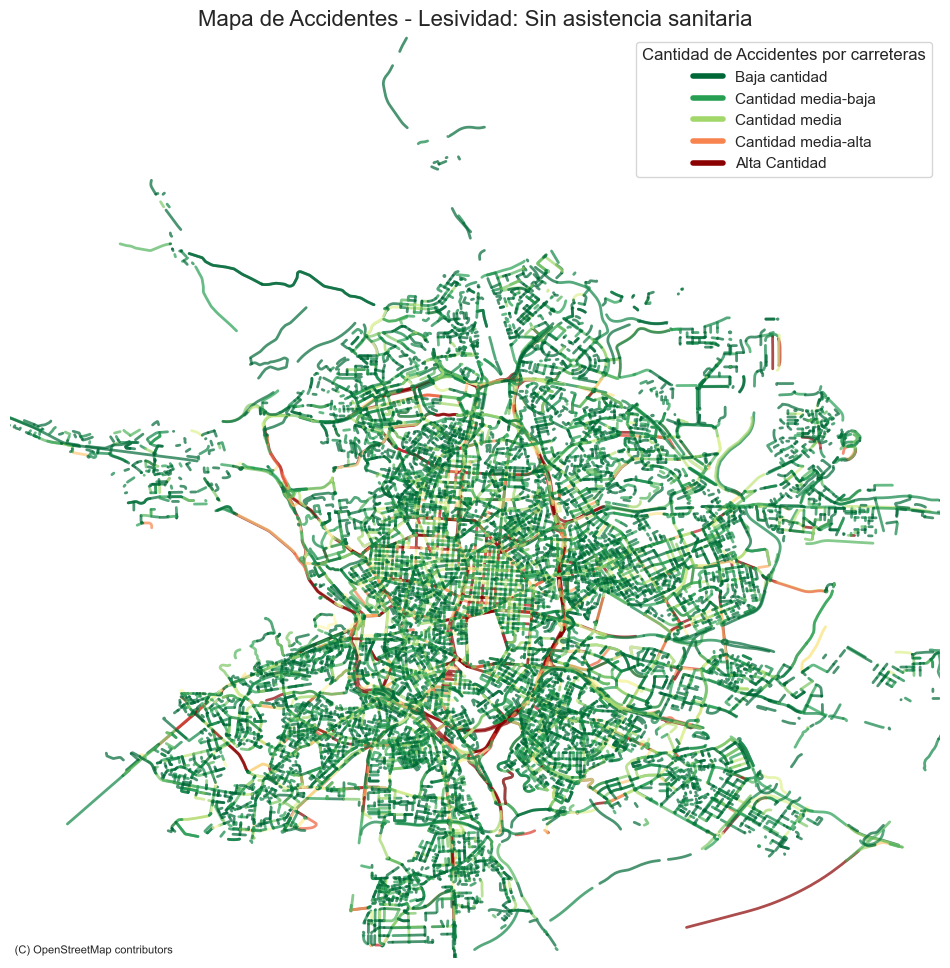

C:\Users\JUAMARIO\AppData\Local\Temp\ipykernel_20996\3418765519.py:59: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = plt.cm.get_cmap('RdYlGn_r')  # Invertido para que verde sea bajo y rojo alto
c:\Users\JUAMARIO\anaconda3\Lib\site-packages\contextily\tile.py:645: UserWarning: The inferred zoom level of 27 is not valid for the current tile provider (valid zooms: 0 - 19).
  warnings.warn(msg)


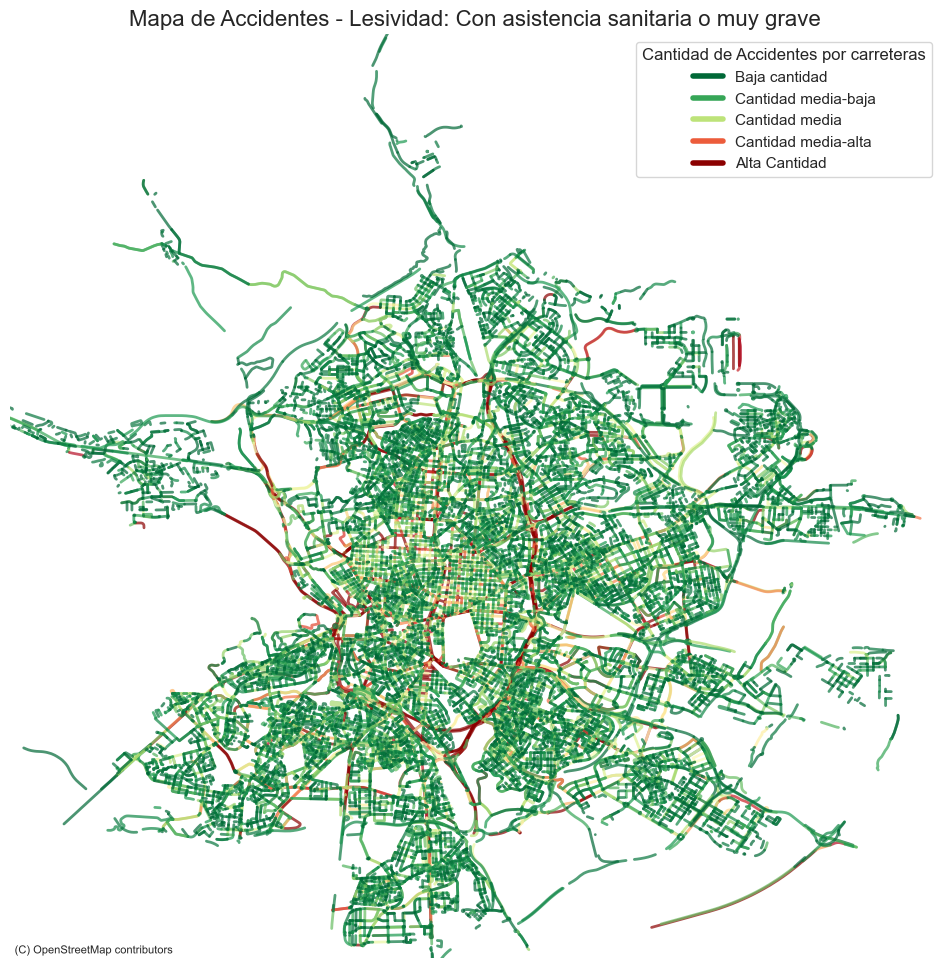

In [74]:
import geopandas as gpd
import pandas as pd
from shapely import wkt
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import contextily as ctx
import matplotlib.patches as mpatches
from matplotlib.lines import Line2D

# Cargar el DataFrame de accidentes
df_accidentes = pd.read_csv('resultado_merge_test.csv')

# Convertir la columna 'geometry' de WKT a geometría de GeoPandas
df_accidentes['geometry'] = df_accidentes['geometry'].apply(wkt.loads)

# Convertir el DataFrame a GeoDataFrame
accidentes_gdf = gpd.GeoDataFrame(df_accidentes, geometry='geometry', crs="EPSG:4326")

# Mapear 'lesividad' a 0 y 1
def map_lesividad(x):
    if pd.notnull(x) and x.strip().lower() == 'sin asistencia sanitaria':
        return 0
    else:
        return 1

accidentes_gdf['lesividad_class'] = accidentes_gdf['lesividad'].apply(map_lesividad)

# Crear dos GeoDataFrames, uno para cada clase de lesividad
accidentes_gdf_0 = accidentes_gdf[accidentes_gdf['lesividad_class'] == 0]
accidentes_gdf_1 = accidentes_gdf[accidentes_gdf['lesividad_class'] == 1]

# Definir una función para generar el mapa para una clase de lesividad
def generar_mapa(accidentes_gdf_class, lesividad_label):

    # Agrupar por la columna 'u_v_k' para contar los accidentes por carretera
    accidentes_por_carretera = accidentes_gdf_class.groupby('u_v_k').size().reset_index(name='accidente_count')

    # Unir los datos de accidentes al GeoDataFrame original
    accidentes_gdf_class = accidentes_gdf_class.merge(accidentes_por_carretera, on='u_v_k', how='left')

    # Verificar si la columna 'length' existe, si no, calcularla
    if 'length' not in accidentes_gdf_class.columns:
        # Reproyectar a un CRS métrico antes de calcular la longitud
        accidentes_gdf_class = accidentes_gdf_class.to_crs(epsg=3857)
        accidentes_gdf_class['length'] = accidentes_gdf_class.geometry.length
        # Convertir de metros a kilómetros
        accidentes_gdf_class['length'] = accidentes_gdf_class['length'] / 1000
    else:
        # Si 'length' existe, asegurarse de que está en kilómetros
        accidentes_gdf_class['length'] = accidentes_gdf_class['length'] / 1000  # Convertir a kilómetros si está en metros

    # Calcular la densidad de accidentes por longitud
    accidentes_gdf_class['accidente_density'] = accidentes_gdf_class['accidente_count'] / accidentes_gdf_class['length']

    # Determinar el umbral para valores atípicos (cuartil del 80%)
    threshold = accidentes_gdf_class['accidente_count'].quantile(0.80)

    # Crear un colormap desde verde hasta rojo
    cmap = plt.cm.get_cmap('RdYlGn_r')  # Invertido para que verde sea bajo y rojo alto
    norm = mcolors.Normalize(vmin=accidentes_gdf_class['accidente_count'].min(),
                             vmax=threshold)

    # Función para mapear densidad a color
    def map_color(density):
        if density >= threshold:
            return 'darkred'
        else:
            return cmap(norm(density))

    # Reproyectar a Web Mercator para usar con contextily
    accidentes_gdf_class = accidentes_gdf_class.to_crs(epsg=3857)

    # Crear la figura y el eje
    fig, ax = plt.subplots(figsize=(12, 12))

    # Añadir el mapa base con opacidad ajustada
    ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik, alpha=0.5)

    # Plotear las carreteras, coloreándolas según la densidad de accidentes
    for _, row in accidentes_gdf_class.drop_duplicates(subset='u_v_k').iterrows():
        if row['accidente_count'] > 0 and pd.notnull(row['geometry']):
            color = map_color(row['accidente_count'])
            ax.plot(*row['geometry'].xy, color=color, linewidth=2, alpha=0.7)

    # Ajustar los límites del mapa a la extensión de los datos
    x_min, y_min, x_max, y_max = accidentes_gdf_class.total_bounds
    ax.set_xlim(x_min + 1000, x_max - 1000)
    ax.set_ylim(y_min + 1000, y_max - 1000)

    # Eliminar ejes para una mejor visualización
    ax.set_axis_off()

    # Añadir una leyenda personalizada
    legend_elements = [
        Line2D([0], [0], color=cmap(norm(accidentes_gdf_class['accidente_count'].min())), lw=4, label='Baja cantidad'),
        Line2D([0], [0], color=cmap(norm(accidentes_gdf_class['accidente_count'].quantile(0.25))), lw=4, label='Cantidad media-baja'),
        Line2D([0], [0], color=cmap(norm(accidentes_gdf_class['accidente_count'].quantile(0.50))), lw=4, label='Cantidad media'),
        Line2D([0], [0], color=cmap(norm(accidentes_gdf_class['accidente_count'].quantile(0.75))), lw=4, label='Cantidad media-alta'),
        Line2D([0], [0], color='darkred', lw=4, label='Alta Cantidad')
    ]

    ax.legend(handles=legend_elements, loc='upper right', title='Cantidad de Accidentes por carreteras')

    # Añadir un título al mapa
    ax.set_title(f'Mapa de Accidentes - Lesividad: {lesividad_label}', fontsize=16)

    # Guardar el mapa como PNG
    plt.savefig(f'mapa_accidentes_{lesividad_label.replace(" ", "_").lower()}.png', dpi=300, bbox_inches='tight')
    plt.show()

# Generar el mapa para lesividad 0 (Sin asistencia sanitaria)
generar_mapa(accidentes_gdf_0, 'Sin asistencia sanitaria')

# Generar el mapa para lesividad 1 (Con asistencia sanitaria o muy grave)
generar_mapa(accidentes_gdf_1, 'Con asistencia sanitaria o muy grave')


In [ ]:
import pandas as pd
import folium
import geopandas as gpd
from folium.plugins import MarkerCluster  # Importar MarkerCluster

df_accidentes = pd.read_csv('resultado_merge_test.csv')
# Convertir la columna 'hora' a datetime sin modificar el DataFrame original
# Convertir la columna 'hora' a datetime sin modificar el DataFrame original
hora_temporal = pd.to_datetime(df_accidentes['hora'], format='%H:%M:%S')

# Clasificar cada accidente en un momento del día según la hora
def clasificar_momento_del_dia(hora):
    if 0 <= hora < 6:
        return 'Madrugada'
    elif 6 <= hora < 12:
        return 'Mañana'
    elif 12 <= hora < 18:
        return 'Tarde'
    else:
        return 'Noche'

# Aplicar la clasificación a la columna 'hora'
df_accidentes['momento_dia'] = hora_temporal.dt.hour.apply(clasificar_momento_del_dia)

# Convertir el DataFrame a GeoDataFrame usando las columnas de latitud y longitud
accidentes_gdf = gpd.GeoDataFrame(
    df_accidentes, 
    geometry=gpd.points_from_xy(df_accidentes['longitud'], df_accidentes['latitud']),
    crs="EPSG:4326"
)

# Crear el mapa centrado en Madrid
m = folium.Map(location=[40.4168, -3.7038], zoom_start=12)

# Crear un objeto MarkerCluster para agrupar los puntos
marker_cluster = MarkerCluster().add_to(m)

# Definir los colores para cada momento del día
colores_momento = {
    'Madrugada': 'blue',
    'Mañana': 'yellow',
    'Tarde': 'orange',
    'Noche': 'red'
}

# Añadir los puntos de accidentes al cluster según el momento del día
for _, row in accidentes_gdf.iterrows():
    folium.CircleMarker(
        location=[row.geometry.y, row.geometry.x],
        radius=3,
        color=colores_momento[row['momento_dia']],
        fill=True,
        fill_opacity=0.3,  # Alpha bajo para evitar superposiciones intensas
        opacity=0.3
    ).add_to(marker_cluster)

# Mostrar el mapa interactivo en el Jupyter Notebook
m

C:\Users\JUAMARIO\AppData\Local\Temp\ipykernel_24300\3826503489.py:7: DtypeWarning: Columns (37,38) have mixed types. Specify dtype option on import or set low_memory=False.
  df_accidentes = pd.read_csv('df_precat_test.csv')


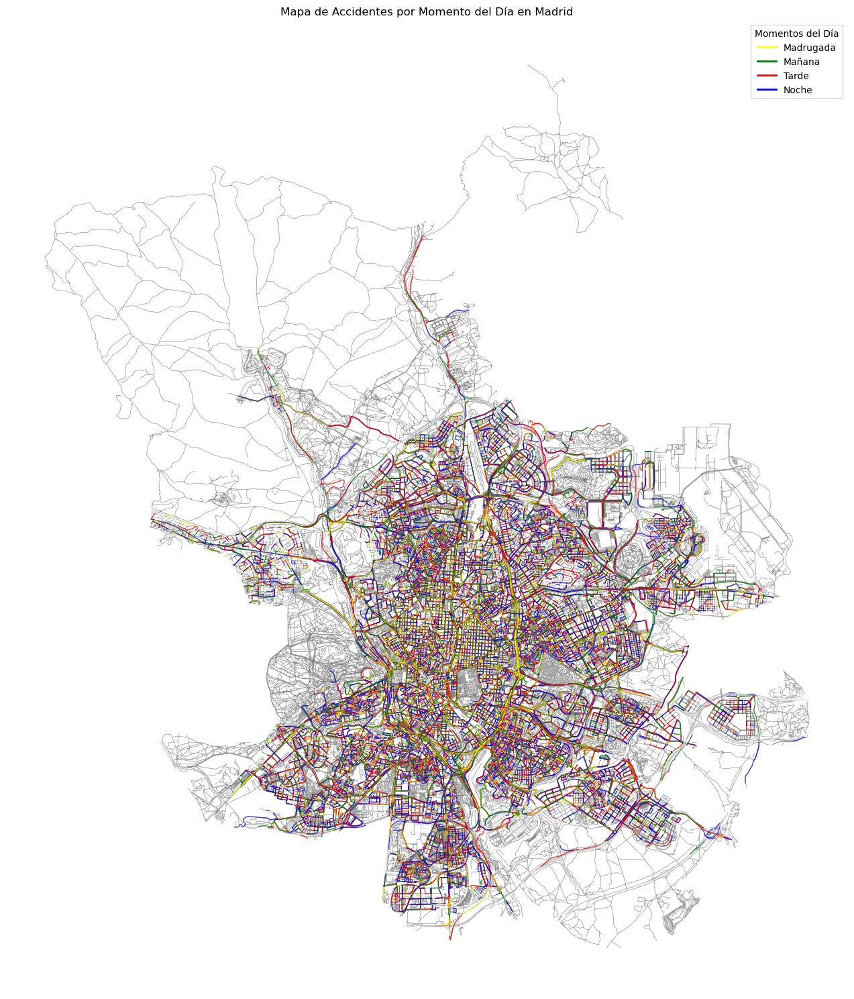

In [ ]:
import osmnx as ox
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt

# Cargar el DataFrame de accidentes
df_accidentes = pd.read_csv('df_precat_test.csv')

# Convertir la columna 'hora' a datetime sin modificar el DataFrame original
hora_temporal = pd.to_datetime(df_accidentes['hora'], format='%H:%M:%S')

# Clasificar cada accidente en un momento del día según la hora
def clasificar_momento_del_dia(hora):
    if 0 <= hora < 6:
        return 'Madrugada'
    elif 6 <= hora < 12:
        return 'Mañana'
    elif 12 <= hora < 18:
        return 'Tarde'
    else:
        return 'Noche'

# Aplicar la clasificación a la columna 'hora'
df_accidentes['momento_dia'] = hora_temporal.dt.hour.apply(clasificar_momento_del_dia)

# Convertir el DataFrame a GeoDataFrame usando la columna 'geometry'
# La columna 'geometry' ya debería estar en WKT (Well-Known Text) compatible con GeoPandas
accidentes_gdf = gpd.GeoDataFrame(df_accidentes, geometry=gpd.GeoSeries.from_wkt(df_accidentes['geometry']), crs="EPSG:4326")

# Agrupar por la columna 'u_v_k' y 'momento_dia' para contar los accidentes por carretera y momento del día
accidentes_por_carretera = df_accidentes.groupby(['u_v_k', 'momento_dia']).size().reset_index(name='accidente_count')

# Unir los datos de accidentes al GeoDataFrame original
accidentes_gdf = accidentes_gdf.merge(accidentes_por_carretera, on=['u_v_k', 'momento_dia'], how='left')

# Definir los colores para cada momento del día
colores_momento = {
    'Madrugada': 'yellow',
    'Mañana': 'green',
    'Tarde': 'red',
    'Noche': 'blue'
}

# Crear el mapa estático usando matplotlib
fig, ax = plt.subplots(figsize=(15, 15))

# Descargar los datos de la red viaria de Madrid para usarlos como fondo
madrid_graph = ox.graph_from_place('Madrid, Spain', network_type='all')
madrid_gdf = ox.graph_to_gdfs(madrid_graph, nodes=False)
madrid_gdf.plot(ax=ax, linewidth=0.5, color='gray', alpha=0.5)

# Añadir las carreteras al mapa, coloreándolas según el momento del día y ajustando la intensidad
for _, row in accidentes_gdf.drop_duplicates(subset=['u_v_k', 'momento_dia']).iterrows():
    color = colores_momento[row['momento_dia']]
    linewidth = 2 if row['accidente_count'] > 50 else 1.5 if row['accidente_count'] > 20 else 1
    ax.plot(*row['geometry'].xy, color=color, linewidth=linewidth, alpha=0.7)

# Añadir la leyenda
plt.legend(handles=[plt.Line2D([0], [0], color=color, lw=2, label=momento) for momento, color in colores_momento.items()], title="Momentos del Día")
plt.title('Mapa de Accidentes por Momento del Día en Madrid')
plt.xlabel('Longitud')
plt.ylabel('Latitud')
plt.axis('off')

# Mostrar el mapa
plt.tight_layout()
plt.show()


C:\Users\JUAMARIO\AppData\Local\Temp\ipykernel_24300\3735996588.py:7: DtypeWarning: Columns (37,38) have mixed types. Specify dtype option on import or set low_memory=False.
  df_accidentes = pd.read_csv('df_precat_test.csv')


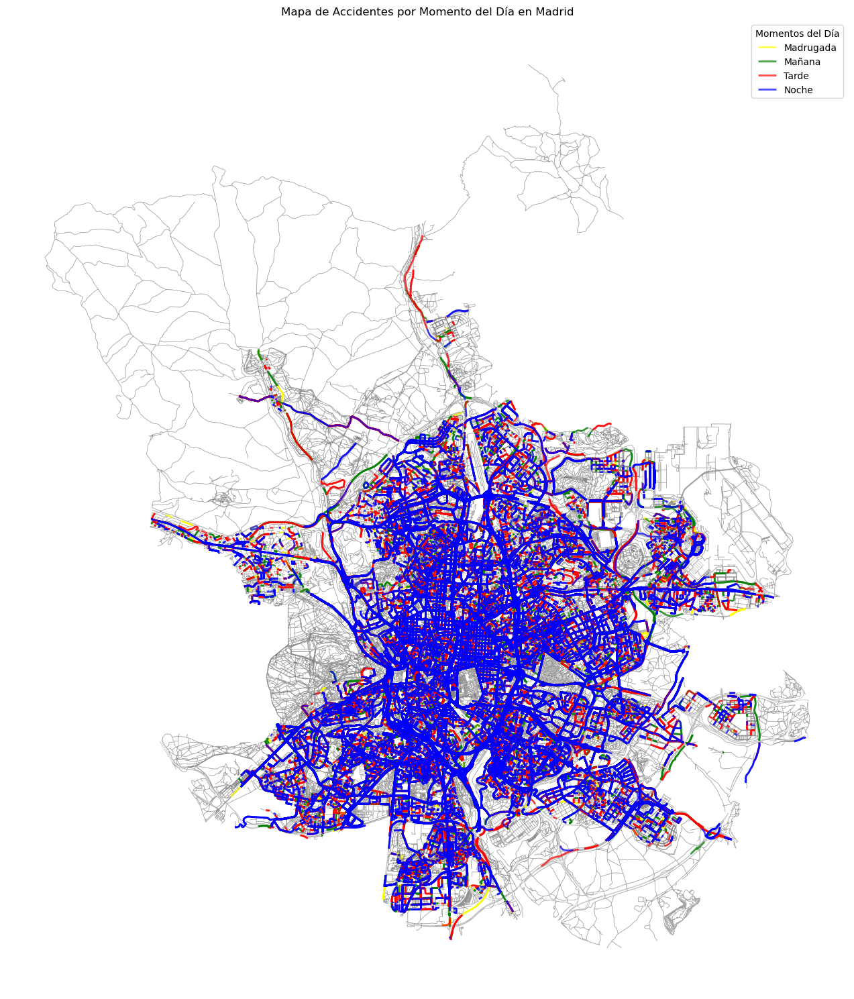

In [ ]:
import osmnx as ox
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt

# Cargar el DataFrame de accidentes
df_accidentes = pd.read_csv('df_precat_test.csv')

# Convertir la columna 'hora' a datetime sin modificar el DataFrame original
hora_temporal = pd.to_datetime(df_accidentes['hora'], format='%H:%M:%S')

# Clasificar cada accidente en un momento del día según la hora
def clasificar_momento_del_dia(hora):
    if 0 <= hora < 6:
        return 'Madrugada'
    elif 6 <= hora < 12:
        return 'Mañana'
    elif 12 <= hora < 18:
        return 'Tarde'
    else:
        return 'Noche'

# Aplicar la clasificación a la columna 'hora'
df_accidentes['momento_dia'] = hora_temporal.dt.hour.apply(clasificar_momento_del_dia)

# Convertir el DataFrame a GeoDataFrame usando la columna 'geometry'
# La columna 'geometry' ya debería estar en WKT (Well-Known Text) compatible con GeoPandas
accidentes_gdf = gpd.GeoDataFrame(df_accidentes, geometry=gpd.GeoSeries.from_wkt(df_accidentes['geometry']), crs="EPSG:4326")

# Agrupar por 'u_v_k' y 'momento_dia' para contar los accidentes por carretera y momento del día
accidentes_por_carretera = df_accidentes.groupby(['u_v_k', 'momento_dia']).size().reset_index(name='accidente_count')

# Encontrar el momento del día con más accidentes para cada carretera
max_accidentes_por_carretera = accidentes_por_carretera.loc[
    accidentes_por_carretera.groupby('u_v_k')['accidente_count'].idxmax()
]

# Unir los datos del momento del día con más accidentes al GeoDataFrame original
accidentes_gdf = accidentes_gdf.merge(
    max_accidentes_por_carretera[['u_v_k', 'momento_dia']],
    on='u_v_k',
    how='left'
)

# Filtrar solo las filas donde la columna 'momento_dia' no sea nula
accidentes_gdf = accidentes_gdf[pd.notna(accidentes_gdf['momento_dia_x'])]

# Definir los colores para cada momento del día
colores_momento = {
    'Madrugada': 'yellow',
    'Mañana': 'green',
    'Tarde': 'red',
    'Noche': 'blue'
}

# Crear el mapa estático usando matplotlib
fig, ax = plt.subplots(figsize=(15, 15))

# Descargar los datos de la red viaria de Madrid para usarlos como fondo
madrid_graph = ox.graph_from_place('Madrid, Spain', network_type='all')
madrid_gdf = ox.graph_to_gdfs(madrid_graph, nodes=False)
madrid_gdf.plot(ax=ax, linewidth=0.5, color='gray', alpha=0.5)

# Añadir las carreteras al mapa, coloreándolas según el momento del día con más accidentes
for momento, color in colores_momento.items():
    accidentes_gdf[accidentes_gdf['momento_dia_x'] == momento].plot(
        ax=ax, color=color, linewidth=2, label=momento, alpha=0.7
    )

# Añadir la leyenda
plt.legend(title="Momentos del Día")
plt.title('Mapa de Accidentes por Momento del Día en Madrid')
plt.xlabel('Longitud')
plt.ylabel('Latitud')
plt.axis('off')

# Mostrar el mapa
plt.tight_layout()
plt.show()


# Análisis lesividad

## Análisis tipo de vehículo

In [33]:
df_unido.vehiculo_mas_4_ruedas.value_counts()

vehiculo_mas_4_ruedas
1    200144
0     39791
Name: count, dtype: int64

In [38]:
df_unido.columns

Index(['Unnamed: 0', 'index', 'num_expediente', 'fecha', 'hora',
       'localizacion', 'numero', 'cod_distrito', 'distrito', 'tipo_accidente',
       'estado_meteorológico', 'tipo_vehiculo', 'tipo_persona', 'rango_edad',
       'sexo', 'cod_lesividad', 'lesividad', 'coordenada_x_utm',
       'coordenada_y_utm', 'positiva_alcohol', 'positiva_droga', 'longitud',
       'latitud', 'osmid', 'oneway', 'lanes', 'name', 'highway', 'maxspeed',
       'reversed', 'length', 'geometry', 'junction', 'ref', 'tunnel', 'access',
       'bridge', 'width', 'est_width', 'u_v_k', 'edgedistance', 'nodedistance',
       'dia', 'mes', 'año', 'temperatura_media', 'precipitaciones(mm)',
       'velocidad_media_aire', 'ubi', 'mapped_highway', 'speed_limit',
       'speed_bin', 'lanes_filled', 'fecha_hora', 'vehiculo_mas_4_ruedas'],
      dtype='object')

C:\Users\JUAMARIO\AppData\Local\Temp\ipykernel_20996\714007568.py:23: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  if not pd.api.types.is_categorical_dtype(df_unido['lesividad']):
2024-11-10 01:00:13,577 - INFO - Valores únicos en 'lesividad': ['Asistencia sanitaria ambulatoria con posterioridad', 'Asistencia sanitaria inmediata en centro de salud o mutua', 'Asistencia sanitaria sólo en el lugar del accidente', 'Atención en urgencias sin posterior ingreso', 'Fallecido 24 horas', 'Ingreso inferior o igual a 24 horas', 'Ingreso superior a 24 horas', 'Se desconoce', 'Sin asistencia sanitaria']
C:\Users\JUAMARIO\AppData\Local\Temp\ipykernel_20996\714007568.py:84: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/sta

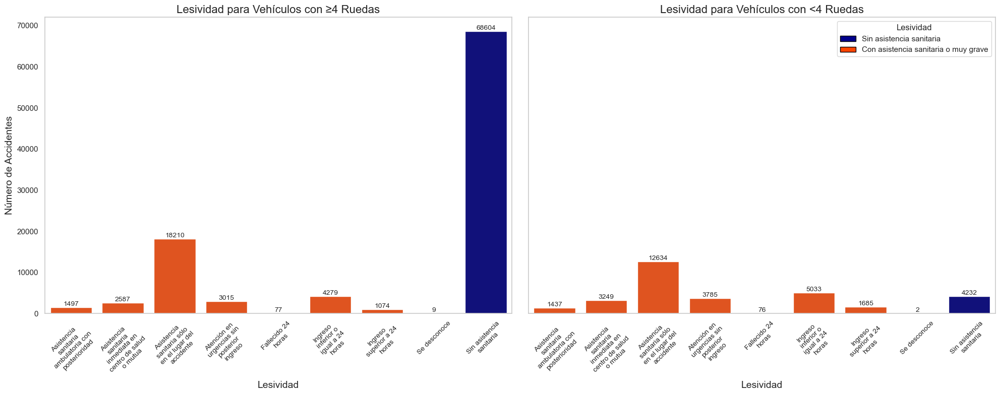

In [59]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import logging
import textwrap
from matplotlib.patches import Patch  # Importar para crear la leyenda personalizada

# Configurar el logging (puedes ajustar el nivel según tus necesidades)
logging.basicConfig(level=logging.INFO, format='%(asctime)s - %(levelname)s - %(message)s')

# Parámetros para la visualización
label_fontsize = 10  # Tamaño de la fuente para las etiquetas y anotaciones
label_wrap_width = 15  # Ancho máximo de caracteres por línea en las etiquetas

# Supongamos que tu DataFrame se llama df_unido
# Asegúrate de que las columnas necesarias existen
required_columns = ['vehiculo_mas_4_ruedas', 'lesividad']
for col in required_columns:
    if col not in df_unido.columns:
        raise ValueError(f"La columna '{col}' no existe en el DataFrame.")

# Convertir 'lesividad' a tipo categórico si aún no lo está
if not pd.api.types.is_categorical_dtype(df_unido['lesividad']):
    df_unido['lesividad'] = df_unido['lesividad'].astype('category')

# Verificar los valores únicos en 'lesividad'
lesividad_categories = df_unido['lesividad'].cat.categories.tolist()
logging.info(f"Valores únicos en 'lesividad': {lesividad_categories}")

# Función para ajustar las etiquetas con saltos de línea
def wrap_labels(labels, width=15):
    """
    Ajusta las etiquetas largas insertando saltos de línea.

    Args:
        labels (List[str]): Lista de etiquetas originales.
        width (int): Número máximo de caracteres por línea.

    Returns:
        List[str]: Lista de etiquetas ajustadas con saltos de línea.
    """
    wrapped_labels = []
    for label in labels:
        wrapped = '\n'.join(textwrap.wrap(label, width=width))
        wrapped_labels.append(wrapped)
    return wrapped_labels

# Crear una figura con dos subplots (1 fila x 2 columnas)
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(20, 8), sharey=True)

# Definir los colores específicos
color_sin_asistencia = 'darkblue'    # Azul oscuro
color_otros = 'orangered'            # Naranja no chillón
color_desconocido = 'black'          # Negro

# Crear paletas de colores personalizadas para cada gráfico
def crear_palette(df):
    palette = {}
    for categoria in df['lesividad'].cat.categories:
        if categoria == 'Sin asistencia sanitaria':
            palette[categoria] = color_sin_asistencia
        elif categoria == 'Se desconoce':
            palette[categoria] = color_desconocido
        else:
            palette[categoria] = color_otros
    return palette

# Filtrar el DataFrame para vehiculo_mas_4_ruedas == 1
df_4_ruedas = df_unido[df_unido['vehiculo_mas_4_ruedas'] == 1]

# Filtrar el DataFrame para vehiculo_mas_4_ruedas == 0
df_menos_4_ruedas = df_unido[df_unido['vehiculo_mas_4_ruedas'] == 0]

# Crear paletas para cada subplot
palette_4_ruedas = crear_palette(df_4_ruedas)
palette_menos_4_ruedas = crear_palette(df_menos_4_ruedas)

# Ordenar las categorías para que 'Sin asistencia sanitaria' esté al final
def ordenar_categorias(df):
    categorias = df['lesividad'].cat.categories.tolist()
    if 'Sin asistencia sanitaria' in categorias:
        categorias.remove('Sin asistencia sanitaria')
        categorias.append('Sin asistencia sanitaria')
    df['lesividad'] = df['lesividad'].cat.reorder_categories(categorias)
    return categorias

# Ordenar categorías en ambos DataFrames
ordenar_categorias(df_4_ruedas)
ordenar_categorias(df_menos_4_ruedas)

# Crear el primer gráfico de barras para vehiculo_mas_4_ruedas == 1
sns.countplot(
    data=df_4_ruedas,
    x='lesividad',
    ax=axes[0],
    palette=palette_4_ruedas
)
axes[0].set_title('Lesividad para Vehículos con ≥4 Ruedas', fontsize=16)
axes[0].set_xlabel('Lesividad', fontsize=14)
axes[0].set_ylabel('Número de Accidentes', fontsize=14)
axes[0].tick_params(axis='x', rotation=45)

# Desactivar la cuadrícula en el primer subplot
axes[0].grid(False)

# Ajustar las etiquetas del eje x para el primer subplot
original_labels_1 = [label.get_text() for label in axes[0].get_xticklabels()]
wrapped_labels_1 = wrap_labels(original_labels_1, width=label_wrap_width)
axes[0].set_xticklabels(wrapped_labels_1, fontsize=label_fontsize)

# Añadir anotaciones de conteo en cada barra (opcional)
for p in axes[0].patches:
    try:
        height = int(p.get_height())  # Convertir a entero
        axes[0].annotate(format(height, 'd'),
                         (p.get_x() + p.get_width() / 2., height),
                         ha='center', va='bottom', fontsize=label_fontsize)
    except ValueError as ve:
        logging.error(f"Error al formatear el valor: {ve}")
        axes[0].annotate(str(p.get_height()),
                         (p.get_x() + p.get_width() / 2., p.get_height()),
                         ha='center', va='bottom', fontsize=label_fontsize)

# Crear el segundo gráfico de barras para vehiculo_mas_4_ruedas == 0
sns.countplot(
    data=df_menos_4_ruedas,
    x='lesividad',
    ax=axes[1],
    palette=palette_menos_4_ruedas
)
axes[1].set_title('Lesividad para Vehículos con <4 Ruedas', fontsize=16)
axes[1].set_xlabel('Lesividad', fontsize=14)
axes[1].set_ylabel('')  # Ya está etiquetado en el primer subplot
axes[1].tick_params(axis='x', rotation=45)

# Desactivar la cuadrícula en el segundo subplot
axes[1].grid(False)

# Ajustar las etiquetas del eje x para el segundo subplot
original_labels_0 = [label.get_text() for label in axes[1].get_xticklabels()]
wrapped_labels_0 = wrap_labels(original_labels_0, width=label_wrap_width)
axes[1].set_xticklabels(wrapped_labels_0, fontsize=label_fontsize)

# Añadir anotaciones de conteo en cada barra (opcional)
for p in axes[1].patches:
    try:
        height = int(p.get_height())  # Convertir a entero
        axes[1].annotate(format(height, 'd'),
                         (p.get_x() + p.get_width() / 2., height),
                         ha='center', va='bottom', fontsize=label_fontsize)
    except ValueError as ve:
        logging.error(f"Error al formatear el valor: {ve}")
        axes[1].annotate(str(p.get_height()),
                         (p.get_x() + p.get_width() / 2., p.get_height()),
                         ha='center', va='bottom', fontsize=label_fontsize)

# Añadir leyenda personalizada (opcional)
legend_elements = [
    Patch(facecolor=color_sin_asistencia, edgecolor='black', label='Sin asistencia sanitaria'),
    Patch(facecolor=color_otros, edgecolor='black', label='Con asistencia sanitaria o muy grave'),

]
axes[1].legend(handles=legend_elements, title='Lesividad', loc='upper right')

# Ajustar el layout para evitar superposiciones
plt.tight_layout()

# Mostrar el gráfico
plt.show()


In [64]:
df.groupby('vehiculo_mas_4_ruedas')['lesividad_binaria'].value_counts().unstack()

lesividad_binaria,0.0,1.0
vehiculo_mas_4_ruedas,,
0,4232,27901
1,68604,30748


In [4]:
import pandas as pd

# Supongamos que tu DataFrame se llama df_unido

# Crear una copia del DataFrame para evitar modificar el original
df = df_unido.copy()

# Mapear 'lesividad' a 0 y 1
df_unido['lesividad_binaria'] = df_unido['lesividad'].apply(lambda x: 0 if x == 'Sin asistencia sanitaria' else (1 if pd.notna(x) else None))

# Inicializar un diccionario para almacenar los resultados
resultados = {}

# Iterar sobre las clases de 'vehiculo_mas_4_ruedas' (0 y 1)
for vehiculo_clase in df['vehiculo_mas_4_ruedas'].unique():
    # Filtrar el DataFrame para la clase actual de 'vehiculo_mas_4_ruedas'
    df_filtrado = df[df['vehiculo_mas_4_ruedas'] == vehiculo_clase]
    
    # Contar las ocurrencias de cada valor de 'lesividad_binaria'
    counts = df_filtrado['lesividad_binaria'].value_counts()
    
    # Obtener los conteos individuales, manejando casos donde una clase pueda no existir
    count_lesividad_0 = counts.get(0, 0)
    count_lesividad_1 = counts.get(1, 0)
    
    # Calcular el total
    total = count_lesividad_0 + count_lesividad_1
    
    # Calcular los porcentajes
    porcentaje_0 = (count_lesividad_0 / total) * 100 if total > 0 else 0
    porcentaje_1 = (count_lesividad_1 / total) * 100 if total > 0 else 0
    
    # Almacenar los resultados en el diccionario
    resultados[vehiculo_clase] = {
        'Total': total,
        'Sin asistencia sanitaria (0)': count_lesividad_0,
        'Con asistencia o grave (1)': count_lesividad_1,
        'Porcentaje Sin asistencia sanitaria (%)': porcentaje_0,
        'Porcentaje Con asistencia o grave (%)': porcentaje_1
    }

# Convertir el diccionario de resultados en un DataFrame para mejor visualización
resultados_df = pd.DataFrame.from_dict(resultados, orient='index')

# Mostrar los resultados
print(resultados_df)


   Total  Sin asistencia sanitaria (0)  Con asistencia o grave (1)  \
0  32133                          4232                       27901   
1  99352                         68604                       30748   

   Porcentaje Sin asistencia sanitaria (%)  \
0                                13.170261   
1                                69.051453   

   Porcentaje Con asistencia o grave (%)  
0                              86.829739  
1                              30.948547  


## Lesividad en función de la hora: 

In [41]:
df_unido.hora.head(5)

Series([], Name: hora, dtype: Int64)

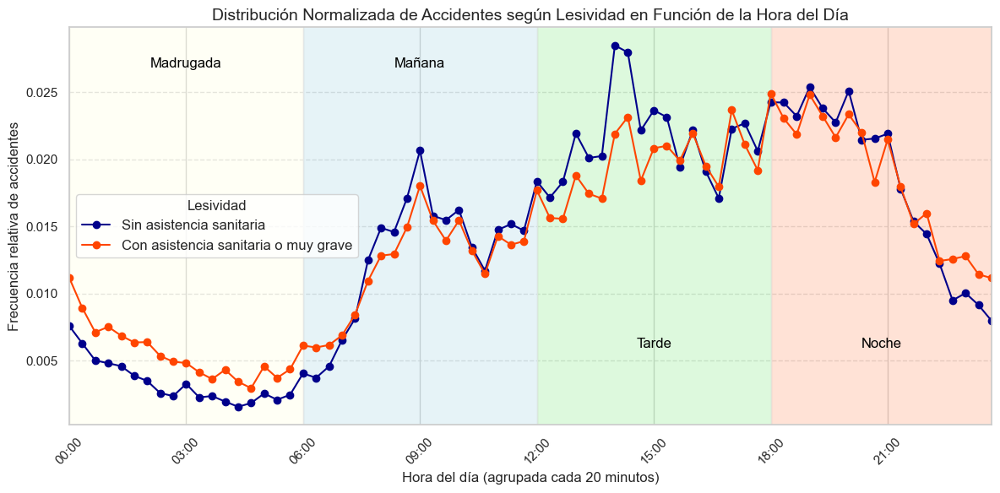

In [53]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import logging
import numpy as np

# Configurar el logging para obtener información durante el proceso
logging.basicConfig(level=logging.INFO, format='%(asctime)s - %(levelname)s - %(message)s')

# Supongamos que tu DataFrame original se llama df_unido
# Crear una copia para evitar modificar el DataFrame original
df_copy = df_unido.copy()

# Verificar que las columnas necesarias existen
required_columns = ['hora', 'lesividad']
for col in required_columns:
    if col not in df_copy.columns:
        raise ValueError(f"La columna '{col}' no existe en el DataFrame.")

# Convertir la columna 'hora' a datetime sin modificar el DataFrame original
hora_temporal = pd.to_datetime(df_copy['hora'], format='%H:%M:%S', errors='coerce')

# Manejar posibles valores NaT
df_copy = df_copy[hora_temporal.notna()].copy()
hora_temporal = hora_temporal.dropna()

# Agrupar los minutos en intervalos de 20 minutos
hora_temporal_agrupada = hora_temporal.dt.floor('20min')
df_copy['hora_agrupada'] = hora_temporal_agrupada.dt.strftime('%H:%M')

# Crear una nueva columna para categorizar 'lesividad'
def categorizar_lesividad(x):
    if pd.notnull(x) and x.strip().lower() == 'sin asistencia sanitaria':
        return 'Sin asistencia sanitaria'
    else:
        return 'Con asistencia sanitaria o muy grave'

df_copy['lesividad_categoria'] = df_copy['lesividad'].apply(categorizar_lesividad)

# Definir los colores específicos
palette_colors = {
    'Sin asistencia sanitaria': 'darkblue',    # azul oscuro
    'Con asistencia sanitaria o muy grave': 'orangered'  # naranja no chillón
}

# Generar una lista de intervalos de tiempo cada 20 minutos desde '00:00' hasta '23:40'
time_intervals = pd.date_range(start='00:00', end='23:40', freq='20min').strftime('%H:%M').tolist()

# Inicializar la figura
plt.figure(figsize=(12, 6))

# Para cada categoría de lesividad, calcular las frecuencias relativas por intervalo de 20 minutos
for categoria, color in palette_colors.items():
    df_categoria = df_copy[df_copy['lesividad_categoria'] == categoria]
    if df_categoria.empty:
        logging.warning(f"No hay datos para la categoría '{categoria}'.")
        continue
    # Contar la cantidad de accidentes por intervalo
    accidents_per_time = df_categoria['hora_agrupada'].value_counts().sort_index()
    # Reindexar para asegurar que todos los intervalos están incluidos, rellenar con ceros
    accidents_per_time = accidents_per_time.reindex(time_intervals, fill_value=0)
    # Calcular las frecuencias relativas
    total_accidents = accidents_per_time.sum()
    accidents_per_time_normalized = accidents_per_time / total_accidents
    # Posiciones numéricas para el eje x
    x_positions = np.arange(len(time_intervals))
    # Graficar las frecuencias relativas por intervalo
    plt.plot(x_positions, accidents_per_time_normalized.values, marker='o', linestyle='-', color=color, label=categoria)

# Configurar etiquetas y título
plt.xlabel('Hora del día (agrupada cada 20 minutos)', fontsize=12)
plt.ylabel('Frecuencia relativa de accidentes', fontsize=12)
plt.title('Distribución Normalizada de Accidentes según Lesividad en Función de la Hora del Día', fontsize=14)

# Definir las posiciones para las divisiones del día
madrugada_start = 0  # '00:00'
madrugada_end = time_intervals.index('06:00')
mañana_start = time_intervals.index('06:00')
mañana_end = time_intervals.index('12:00')
tarde_start = time_intervals.index('12:00')
tarde_end = time_intervals.index('18:00')
noche_start = time_intervals.index('18:00')
noche_end = len(time_intervals) - 1  # '23:40'

# Añadir los colores de fondo para cada parte del día
plt.axvspan(madrugada_start, madrugada_end, facecolor='lightyellow', alpha=0.3)
plt.axvspan(mañana_start, mañana_end, facecolor='lightblue', alpha=0.3)
plt.axvspan(tarde_start, tarde_end, facecolor='lightgreen', alpha=0.3)
plt.axvspan(noche_start, noche_end, facecolor='lightsalmon', alpha=0.3)

# Añadir texto para cada parte del día
plt.text((madrugada_start + madrugada_end)/2, plt.ylim()[1]*0.9, 'Madrugada', fontsize=12, color='black', ha='center')
plt.text((mañana_start + mañana_end)/2, plt.ylim()[1]*0.9, 'Mañana', fontsize=12, color='black', ha='center')
plt.text((tarde_start + tarde_end)/2, plt.ylim()[1]*0.2, 'Tarde', fontsize=12, color='black', ha='center')
plt.text((noche_start + noche_end)/2, plt.ylim()[1]*0.2, 'Noche', fontsize=12, color='black', ha='center')

# Ajustar las etiquetas y límites del eje x
plt.xticks(ticks=range(0, len(time_intervals), 9),
           labels=[time_intervals[i] for i in range(0, len(time_intervals), 9)],
           rotation=45)
plt.xlim(0, len(time_intervals) - 1)

# Añadir cuadrícula, leyenda y mostrar la gráfica
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.legend(title='Lesividad', fontsize=12, loc='center left')
plt.tight_layout()
plt.show()



2024-11-09 18:44:23,517 - INFO - Valores únicos en 'etapa_tiempo': ['Mañana' 'Madrugada' 'Tarde' 'Noche']
C:\Users\JUAMARIO\AppData\Local\Temp\ipykernel_20996\996216985.py:87: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  if not pd.api.types.is_categorical_dtype(df_original['lesividad']):
2024-11-09 18:44:23,638 - INFO - Creando gráfico para la etapa 'Madrugada' con 21287 registros.
C:\Users\JUAMARIO\AppData\Local\Temp\ipykernel_20996\996216985.py:115: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(
C:\Users\JUAMARIO\AppData\Local\Temp\ipykernel_20996\996216985.py:131: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(wrapped_labels, font

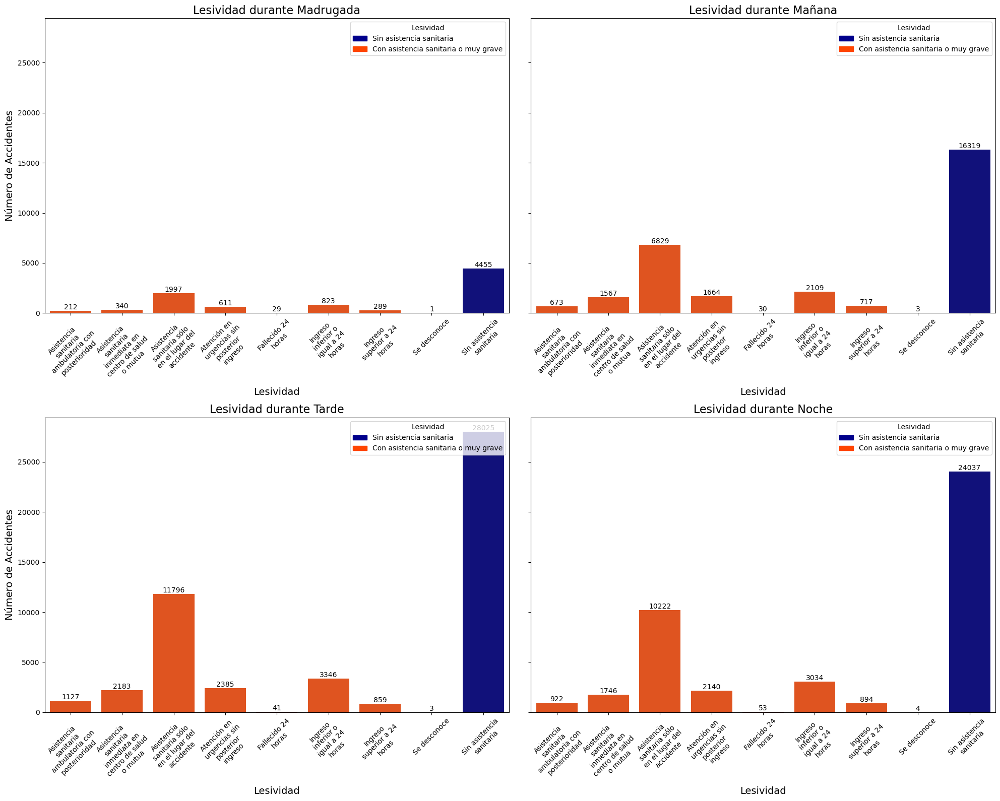

In [24]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import logging
import textwrap
from matplotlib.patches import Patch  # Importar para crear la leyenda personalizada

# Configurar el logging (puedes ajustar el nivel según tus necesidades)
logging.basicConfig(level=logging.INFO, format='%(asctime)s - %(levelname)s - %(message)s')

# Parámetros para la visualización
LABEL_FONT_SIZE = 10       # Tamaño de la fuente para las etiquetas y anotaciones
LABEL_WRAP_WIDTH = 15      # Ancho máximo de caracteres por línea en las etiquetas

# Función para ajustar las etiquetas con saltos de línea
def wrap_labels(labels, width=15):
    """
    Ajusta las etiquetas largas insertando saltos de línea.

    Args:
        labels (List[str]): Lista de etiquetas originales.
        width (int): Número máximo de caracteres por línea.

    Returns:
        List[str]: Lista de etiquetas ajustadas con saltos de línea.
    """
    wrapped_labels = []
    for label in labels:
        wrapped = '\n'.join(textwrap.wrap(label, width=width))
        wrapped_labels.append(wrapped)
    return wrapped_labels

# Supongamos que tu DataFrame original se llama df_unido
# Para evitar modificarlo, creamos una copia
df_original = df_unido.copy()

# Verificar que las columnas necesarias existen
required_columns = ['vehiculo_mas_4_ruedas', 'lesividad', 'hora']
for col in required_columns:
    if col not in df_original.columns:
        raise ValueError(f"La columna '{col}' no existe en el DataFrame.")

# Asegurarse de que la columna 'hora' está en formato datetime
# Suponiendo que 'hora' está en formato "HH:MM:SS"
try:
    df_original['hora_datetime'] = pd.to_datetime(df_original['hora'], format='%H:%M:%S', errors='coerce')
except Exception as e:
    logging.error(f"Error al convertir la columna 'hora' a datetime: {e}")
    raise

# Verificar si hay valores NaT después de la conversión
if df_original['hora_datetime'].isnull().any():
    logging.warning("Algunos valores en la columna 'hora' no pudieron ser convertidos a datetime y se establecerán como NaT.")

# Extraer la hora como entero
df_original['hora_int'] = df_original['hora_datetime'].dt.hour

# Definir las etapas del día
def asignar_etapa_tiempo(hora):
    """
    Asigna una etapa del día basada en la hora proporcionada.

    Args:
        hora (int): Hora del día en formato 24 horas (0-23).

    Returns:
        str: Etapa del día ('Madrugada', 'Mañana', 'Tarde', 'Noche').
    """
    if 0 <= hora <= 5:
        return 'Madrugada'
    elif 6 <= hora <= 11:
        return 'Mañana'
    elif 12 <= hora <= 17:
        return 'Tarde'
    elif 18 <= hora <= 23:
        return 'Noche'
    else:
        return 'Desconocido'

# Aplicar la función para crear una nueva columna 'etapa_tiempo'
df_original['etapa_tiempo'] = df_original['hora_int'].apply(asignar_etapa_tiempo)

# Verificar los valores únicos en 'etapa_tiempo'
logging.info(f"Valores únicos en 'etapa_tiempo': {df_original['etapa_tiempo'].unique()}")

# Convertir 'lesividad' a tipo categórico si aún no lo está
if not pd.api.types.is_categorical_dtype(df_original['lesividad']):
    df_original['lesividad'] = df_original['lesividad'].astype('category')

# Función para crear gráficos de barras con etiquetas ajustadas y anotaciones
def crear_grafico_barras(df, etapa, ax):
    """
    Crea un gráfico de barras para una etapa del día específica.

    Args:
        df (DataFrame): DataFrame filtrado por la etapa del día.
        etapa (str): Nombre de la etapa del día.
        ax (matplotlib.axes.Axes): Eje donde se dibujará el gráfico.
    """

    # Definir los colores específicos para las categorías
    palette_colors = {
        'Sin asistencia sanitaria': 'darkblue',  # azul oscuro
    }

    # Obtener todas las categorías posibles de 'lesividad'
    categorias_lesividad = df_original['lesividad'].cat.categories.tolist()

    # Asignar un color naranja no chillón al resto de las categorías
    for categoria in categorias_lesividad:
        if categoria != 'Sin asistencia sanitaria':
            palette_colors[categoria] = 'orangered'  # naranja no chillón

    # Crear el gráfico de barras con la paleta personalizada
    sns.countplot(
        data=df,
        x='lesividad',
        ax=ax,
        palette=palette_colors,  # Usar la paleta personalizada como diccionario
        order=categorias_lesividad  # Asegurar el orden de las categorías
    )

    ax.set_title(f'Lesividad durante {etapa}', fontsize=16)
    ax.set_xlabel('Lesividad', fontsize=14)
    ax.set_ylabel('Número de Accidentes', fontsize=14)
    ax.tick_params(axis='x', rotation=45)

    # Ajustar las etiquetas del eje x para el subplot
    original_labels = [label.get_text() for label in ax.get_xticklabels()]
    wrapped_labels = wrap_labels(original_labels, width=LABEL_WRAP_WIDTH)
    ax.set_xticklabels(wrapped_labels, fontsize=LABEL_FONT_SIZE)

    # Añadir anotaciones de conteo en cada barra
    for p in ax.patches:
        try:
            height = int(p.get_height())  # Convertir a entero
            ax.annotate(format(height, 'd'),
                        (p.get_x() + p.get_width() / 2., height),
                        ha='center', va='bottom', fontsize=LABEL_FONT_SIZE)
        except ValueError as ve:
            logging.error(f"Error al formatear el valor: {ve}")
            ax.annotate(str(p.get_height()),
                        (p.get_x() + p.get_width() / 2., p.get_height()),
                        ha='center', va='bottom', fontsize=LABEL_FONT_SIZE)

    # Añadir la leyenda personalizada
    legend_elements = [
        Patch(facecolor='darkblue', edgecolor='darkblue', label='Sin asistencia sanitaria'),
        Patch(facecolor='orangered', edgecolor='orangered', label='Con asistencia sanitaria o muy grave'),
    ]

    ax.legend(handles=legend_elements, title='Lesividad', loc='upper right')

# Crear una figura con cuatro subplots (2 filas x 2 columnas)
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(20, 16), sharey=True)

# Definir las etapas del día
etapas = ['Madrugada', 'Mañana', 'Tarde', 'Noche']

# Iterar sobre cada etapa y su subplot correspondiente
for etapa, ax in zip(etapas, axes.flatten()):
    # Filtrar el DataFrame para la etapa actual
    df_etapa = df_original[df_original['etapa_tiempo'] == etapa]

    if df_etapa.empty:
        logging.warning(f"No hay datos para la etapa '{etapa}'.")
        ax.set_title(f'No hay datos para {etapa}', fontsize=16)
        ax.axis('off')  # Ocultar el eje si no hay datos
        continue

    logging.info(f"Creando gráfico para la etapa '{etapa}' con {len(df_etapa)} registros.")

    # Crear el gráfico de barras
    crear_grafico_barras(df_etapa, etapa, ax)

# Ajustar el espacio entre subplots
plt.tight_layout()

# Mostrar el gráfico
plt.show()



In [5]:
import pandas as pd
import logging

# Configurar el logging (opcional, para obtener información sobre el proceso)
logging.basicConfig(level=logging.INFO, format='%(asctime)s - %(levelname)s - %(message)s')

# Supongamos que tu DataFrame original se llama df_unido
# Crear una copia para evitar modificar el DataFrame original
df_copy = df_unido.copy()

# Verificar que las columnas necesarias existen
required_columns = ['vehiculo_mas_4_ruedas', 'lesividad', 'hora']
for col in required_columns:
    if col not in df_copy.columns:
        raise ValueError(f"La columna '{col}' no existe en el DataFrame.")

# Función para clasificar las horas en etapas del día
def asignar_etapa_tiempo(hora_str):
    """
    Asigna una etapa del día basada en la hora proporcionada.
    
    Args:
        hora_str (str): Hora del día en formato "HH:MM:SS".
        
    Returns:
        str: Etapa del día ('Madrugada', 'Mañana', 'Tarde', 'Noche').
    """
    try:
        # Convertir la cadena a objeto datetime
        hora_datetime = pd.to_datetime(hora_str, format='%H:%M:%S', errors='coerce')
        hora = hora_datetime.hour
    except Exception as e:
        logging.error(f"Error al convertir la hora '{hora_str}': {e}")
        return 'Desconocido'
    
    if 0 <= hora <= 5:
        return 'Madrugada'
    elif 6 <= hora <= 11:
        return 'Mañana'
    elif 12 <= hora <= 17:
        return 'Tarde'
    elif 18 <= hora <= 23:
        return 'Noche'
    else:
        return 'Desconocido'

# Aplicar la clasificación de etapas del día
df_copy['etapa_tiempo'] = df_copy['hora'].apply(asignar_etapa_tiempo)

# Añadir la columna 'asistencia_sanitaria'
df_copy['asistencia_sanitaria'] = df_copy['lesividad'].apply(
    lambda x: 0 if pd.notnull(x) and x.strip().lower() == 'sin asistencia sanitaria' else 1
)

# Verificar los valores únicos en 'etapa_tiempo' y 'asistencia_sanitaria'
logging.info(f"Conteo por 'etapa_tiempo':\n{df_copy['etapa_tiempo'].value_counts()}")
logging.info(f"Conteo por 'asistencia_sanitaria':\n{df_copy['asistencia_sanitaria'].value_counts()}")

# Calcular los conteos por 'etapa_tiempo' y 'asistencia_sanitaria'
conteos = df_copy.groupby(['etapa_tiempo', 'asistencia_sanitaria']).size().reset_index(name='conteo')

# Pivotear el DataFrame para tener 'asistencia_sanitaria' como columnas
pivot_conteos = conteos.pivot(index='etapa_tiempo', columns='asistencia_sanitaria', values='conteo').fillna(0).astype(int)

# Renombrar las columnas para mayor claridad
pivot_conteos = pivot_conteos.rename(columns={0: 'Sin Asistencia Sanitaria', 1: 'Con Asistencia Sanitaria'})

# Calcular los porcentajes
pivot_conteos['Total'] = pivot_conteos['Sin Asistencia Sanitaria'] + pivot_conteos['Con Asistencia Sanitaria']
pivot_conteos['Porcentaje_Sin_Asistencia_Sanitaria'] = (pivot_conteos['Sin Asistencia Sanitaria'] / pivot_conteos['Total']) * 100
pivot_conteos['Porcentaje_Con_Asistencia_Sanitaria'] = (pivot_conteos['Con Asistencia Sanitaria'] / pivot_conteos['Total']) * 100

# Redondear los porcentajes a dos decimales
pivot_conteos['Porcentaje_Sin_Asistencia_Sanitaria'] = pivot_conteos['Porcentaje_Sin_Asistencia_Sanitaria'].round(2)
pivot_conteos['Porcentaje_Con_Asistencia_Sanitaria'] = pivot_conteos['Porcentaje_Con_Asistencia_Sanitaria'].round(2)

# Ordenar las etapas del día de forma lógica
etapas_ordenadas = ['Madrugada', 'Mañana', 'Tarde', 'Noche']
pivot_conteos = pivot_conteos.reindex(etapas_ordenadas)

# Eliminar la columna 'Total' si no es necesaria
pivot_conteos = pivot_conteos.drop(columns=['Total'])

# Mostrar el DataFrame resultante
print("Porcentaje de Asistencia Sanitaria por Etapa del Día:\n")
print(pivot_conteos[['Porcentaje_Sin_Asistencia_Sanitaria', 'Porcentaje_Con_Asistencia_Sanitaria']])


2024-11-11 03:21:56,068 - INFO - Conteo por 'etapa_tiempo':
etapa_tiempo
Tarde        86621
Noche        79847
Mañana       52180
Madrugada    21287
Name: count, dtype: int64
2024-11-11 03:21:56,071 - INFO - Conteo por 'asistencia_sanitaria':
asistencia_sanitaria
1    167099
0     72836
Name: count, dtype: int64


Porcentaje de Asistencia Sanitaria por Etapa del Día:

asistencia_sanitaria  Porcentaje_Sin_Asistencia_Sanitaria  \
etapa_tiempo                                                
Madrugada                                           20.93   
Mañana                                              31.27   
Tarde                                               32.35   
Noche                                               30.10   

asistencia_sanitaria  Porcentaje_Con_Asistencia_Sanitaria  
etapa_tiempo                                               
Madrugada                                           79.07  
Mañana                                              68.73  
Tarde                                               67.65  
Noche                                               69.90  


## Lesividad en función de la etapa del año

2024-11-09 19:23:20,223 - INFO - Valores únicos en 'estacion': ['Invierno' 'Primavera' 'Verano' 'Otoño']
C:\Users\JUAMARIO\AppData\Local\Temp\ipykernel_20996\2224108310.py:83: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  if not pd.api.types.is_categorical_dtype(df_copy['lesividad']):
2024-11-09 19:23:20,335 - INFO - Creando gráfico para la estación 'Primavera' con 63352 registros.
C:\Users\JUAMARIO\AppData\Local\Temp\ipykernel_20996\2224108310.py:119: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(
C:\Users\JUAMARIO\AppData\Local\Temp\ipykernel_20996\2224108310.py:136: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(wrapped_labels, fon

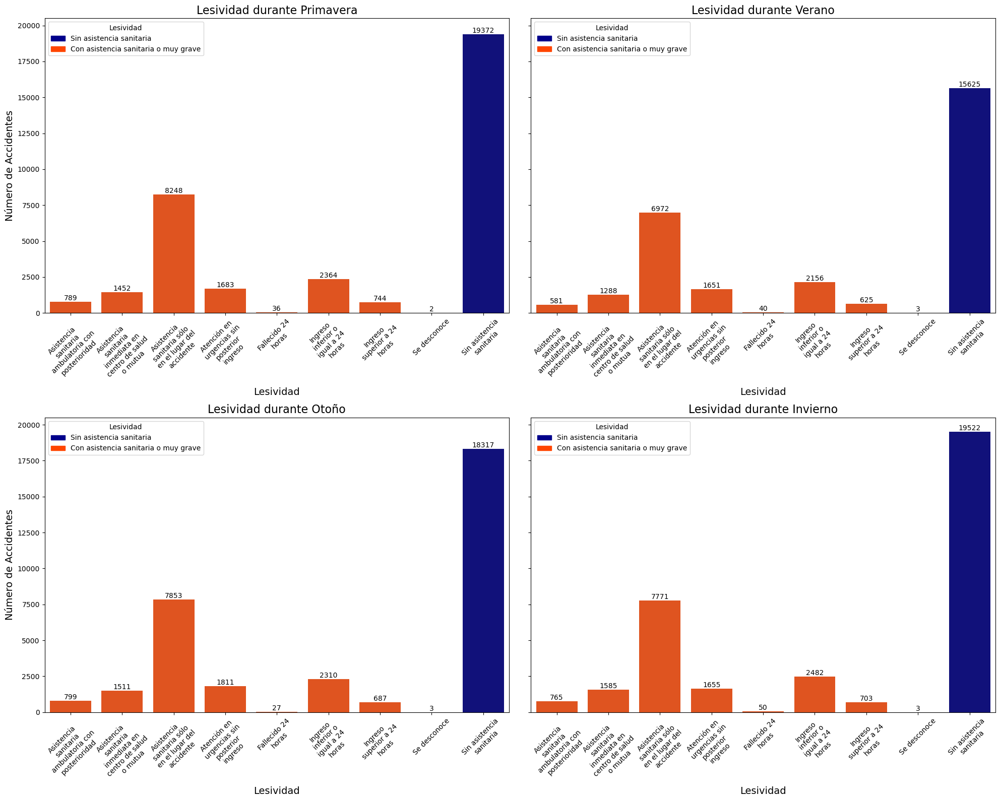

In [26]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import logging
import textwrap
from matplotlib.patches import Patch  # Importar para crear la leyenda personalizada

# Configurar el logging para obtener información durante el proceso
logging.basicConfig(level=logging.INFO, format='%(asctime)s - %(levelname)s - %(message)s')

# Parámetros para la visualización
LABEL_FONT_SIZE = 10       # Tamaño de la fuente para las etiquetas y anotaciones
LABEL_WRAP_WIDTH = 15      # Ancho máximo de caracteres por línea en las etiquetas

# Función para ajustar las etiquetas largas insertando saltos de línea
def wrap_labels(labels, width=15):
    """
    Ajusta las etiquetas largas insertando saltos de línea.

    Args:
        labels (List[str]): Lista de etiquetas originales.
        width (int): Número máximo de caracteres por línea.

    Returns:
        List[str]: Lista de etiquetas ajustadas con saltos de línea.
    """
    wrapped_labels = []
    for label in labels:
        wrapped = '\n'.join(textwrap.wrap(label, width=width))
        wrapped_labels.append(wrapped)
    return wrapped_labels

# Crear una copia del DataFrame original para evitar modificaciones
df_copy = df_unido.copy()

# Verificar que las columnas necesarias existen
required_columns = ['lesividad', 'fecha']
for col in required_columns:
    if col not in df_copy.columns:
        raise ValueError(f"La columna '{col}' no existe en el DataFrame.")

# Convertir la columna 'fecha' a tipo datetime
# Asumiendo que el formato es 'YYYY-MM-DD'
try:
    df_copy['fecha_datetime'] = pd.to_datetime(df_copy['fecha'], format='%Y-%m-%d', errors='coerce')
except Exception as e:
    logging.error(f"Error al convertir la columna 'fecha' a datetime: {e}")
    raise

# Verificar si hay valores NaT después de la conversión
if df_copy['fecha_datetime'].isnull().any():
    logging.warning("Algunos valores en la columna 'fecha' no pudieron ser convertidos a datetime y se establecerán como NaT.")

# Función para asignar estaciones del año basado en el mes
def asignar_estacion(month):
    """
    Asigna una estación del año basada en el mes.

    Args:
        month (int): Mes del año (1-12).

    Returns:
        str: Estación del año ('Primavera', 'Verano', 'Otoño', 'Invierno').
    """
    if month in [3, 4, 5]:
        return 'Primavera'
    elif month in [6, 7, 8]:
        return 'Verano'
    elif month in [9, 10, 11]:
        return 'Otoño'
    elif month in [12, 1, 2]:
        return 'Invierno'
    else:
        return 'Desconocido'

# Crear una nueva columna 'estacion' basada en el mes de 'fecha_datetime'
df_copy['estacion'] = df_copy['fecha_datetime'].dt.month.apply(asignar_estacion)

# Verificar los valores únicos en 'estacion'
logging.info(f"Valores únicos en 'estacion': {df_copy['estacion'].unique()}")

# Convertir 'lesividad' a tipo categórico si aún no lo está
if not pd.api.types.is_categorical_dtype(df_copy['lesividad']):
    df_copy['lesividad'] = df_copy['lesividad'].astype('category')

# Crear una figura con cuatro subplots (2 filas x 2 columnas)
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(20, 16), sharey=True)

# Definir las estaciones del año en orden
estaciones = ['Primavera', 'Verano', 'Otoño', 'Invierno']

# Iterar sobre cada estación y su subplot correspondiente
for estacion, ax in zip(estaciones, axes.flatten()):
    # Filtrar el DataFrame para la estación actual
    df_estacion = df_copy[df_copy['estacion'] == estacion]
    
    if df_estacion.empty:
        logging.warning(f"No hay datos para la estación '{estacion}'.")
        ax.set_title(f'No hay datos para {estacion}', fontsize=16)
        ax.axis('off')  # Ocultar el eje si no hay datos
        continue

    logging.info(f"Creando gráfico para la estación '{estacion}' con {len(df_estacion)} registros.")

    # Definir los colores específicos para las categorías
    palette_colors = {
        'Sin asistencia sanitaria': 'darkblue',  # azul oscuro
    }

    # Obtener todas las categorías posibles de 'lesividad'
    categorias_lesividad = df_copy['lesividad'].cat.categories.tolist()

    # Asignar un color naranja no chillón al resto de las categorías
    for categoria in categorias_lesividad:
        if categoria != 'Sin asistencia sanitaria':
            palette_colors[categoria] = 'orangered'  # naranja no chillón

    # Crear el histograma de 'lesividad' para la estación actual con la paleta personalizada
    sns.countplot(
        data=df_estacion,
        x='lesividad',
        ax=ax,
        palette=palette_colors,
        order=categorias_lesividad  # Asegurar el orden de las categorías
    )
    
    # Configurar el título y etiquetas
    ax.set_title(f'Lesividad durante {estacion}', fontsize=16)
    ax.set_xlabel('Lesividad', fontsize=14)
    ax.set_ylabel('Número de Accidentes', fontsize=14)
    ax.tick_params(axis='x', rotation=45)

    # Ajustar las etiquetas del eje x para el subplot
    original_labels = [label.get_text() for label in ax.get_xticklabels()]
    wrapped_labels = wrap_labels(original_labels, width=LABEL_WRAP_WIDTH)
    ax.set_xticklabels(wrapped_labels, fontsize=LABEL_FONT_SIZE)

    # Añadir anotaciones de conteo en cada barra
    for p in ax.patches:
        try:
            height = int(p.get_height())  # Convertir a entero
            ax.annotate(format(height, 'd'),
                        (p.get_x() + p.get_width() / 2., height),
                        ha='center', va='bottom', fontsize=LABEL_FONT_SIZE)
        except ValueError as ve:
            logging.error(f"Error al formatear el valor: {ve}")
            ax.annotate(str(p.get_height()),
                        (p.get_x() + p.get_width() / 2., p.get_height()),
                        ha='center', va='bottom', fontsize=LABEL_FONT_SIZE)

    # Añadir la leyenda personalizada en la parte superior izquierda
    legend_elements = [
        Patch(facecolor='darkblue', edgecolor='darkblue', label='Sin asistencia sanitaria'),
        Patch(facecolor='orangered', edgecolor='orangered', label='Con asistencia sanitaria o muy grave'),
    ]

    ax.legend(handles=legend_elements, title='Lesividad', loc='upper left')

# Ajustar el espacio entre subplots para evitar superposiciones
plt.tight_layout()

# Mostrar los gráficos
plt.show()


In [6]:
import pandas as pd
import logging

# Configurar el logging para obtener información durante el proceso
logging.basicConfig(level=logging.INFO, format='%(asctime)s - %(levelname)s - %(message)s')

# Supongamos que tu DataFrame original se llama df_unido
# Crear una copia para evitar modificar el DataFrame original
df_copy = df_unido.copy()

# Verificar que las columnas necesarias existen
required_columns = ['lesividad', 'fecha']
for col in required_columns:
    if col not in df_copy.columns:
        raise ValueError(f"La columna '{col}' no existe en el DataFrame.")

# Convertir la columna 'fecha' a tipo datetime
# Asumiendo que el formato es 'YYYY-MM-DD'
try:
    df_copy['fecha_datetime'] = pd.to_datetime(df_copy['fecha'], format='%Y-%m-%d', errors='coerce')
except Exception as e:
    logging.error(f"Error al convertir la columna 'fecha' a datetime: {e}")
    raise

# Verificar si hay valores NaT después de la conversión
if df_copy['fecha_datetime'].isnull().any():
    logging.warning("Algunos valores en la columna 'fecha' no pudieron ser convertidos a datetime y se establecerán como NaT.")

# Función para asignar estaciones del año basado en el mes
def asignar_estacion(month):
    """
    Asigna una estación del año basada en el mes.
    
    Args:
        month (int): Mes del año (1-12).
    
    Returns:
        str: Estación del año ('Primavera', 'Verano', 'Otoño', 'Invierno').
    """
    if month in [3, 4, 5]:
        return 'Primavera'
    elif month in [6, 7, 8]:
        return 'Verano'
    elif month in [9, 10, 11]:
        return 'Otoño'
    elif month in [12, 1, 2]:
        return 'Invierno'
    else:
        return 'Desconocido'

# Crear una nueva columna 'estacion' basada en el mes de 'fecha_datetime'
df_copy['estacion'] = df_copy['fecha_datetime'].dt.month.apply(asignar_estacion)

# Verificar los valores únicos en 'estacion'
logging.info(f"Valores únicos en 'estacion': {df_copy['estacion'].unique()}")

# Convertir 'lesividad' a tipo categórico si aún no lo está
if not pd.api.types.is_categorical_dtype(df_copy['lesividad']):
    df_copy['lesividad'] = df_copy['lesividad'].astype('category')

# Añadir la columna 'asistencia_sanitaria'
df_copy['asistencia_sanitaria'] = df_copy['lesividad'].apply(
    lambda x: 0 if x == 'Sin asistencia sanitaria' else (1 if pd.notna(x) else None)
)

# Verificar los valores únicos en 'asistencia_sanitaria'
logging.info(f"Valores únicos en 'asistencia_sanitaria': {df_copy['asistencia_sanitaria'].unique()}")

# Calcular los conteos por 'estacion' y 'asistencia_sanitaria'
conteos = df_copy.groupby(['estacion', 'asistencia_sanitaria']).size().reset_index(name='conteo')

# Pivotear el DataFrame para tener 'asistencia_sanitaria' como columnas
pivot_conteos = conteos.pivot(index='estacion', columns='asistencia_sanitaria', values='conteo').fillna(0).astype(int)

# Renombrar las columnas para mayor claridad
pivot_conteos = pivot_conteos.rename(columns={0: 'Sin Asistencia Sanitaria', 1: 'Con Asistencia Sanitaria'})

# Calcular los porcentajes
pivot_conteos['Total'] = pivot_conteos['Sin Asistencia Sanitaria'] + pivot_conteos['Con Asistencia Sanitaria']
pivot_conteos['Porcentaje_Sin_Asistencia_Sanitaria'] = (pivot_conteos['Sin Asistencia Sanitaria'] / pivot_conteos['Total']) * 100
pivot_conteos['Porcentaje_Con_Asistencia_Sanitaria'] = (pivot_conteos['Con Asistencia Sanitaria'] / pivot_conteos['Total']) * 100

# Redondear los porcentajes a dos decimales
pivot_conteos['Porcentaje_Sin_Asistencia_Sanitaria'] = pivot_conteos['Porcentaje_Sin_Asistencia_Sanitaria'].round(2)
pivot_conteos['Porcentaje_Con_Asistencia_Sanitaria'] = pivot_conteos['Porcentaje_Con_Asistencia_Sanitaria'].round(2)

# Ordenar las estaciones del año de forma lógica
estaciones_ordenadas = ['Primavera', 'Verano', 'Otoño', 'Invierno', 'Desconocido']
pivot_conteos = pivot_conteos.reindex(estaciones_ordenadas)

# Eliminar la columna 'Total' si no es necesaria
pivot_conteos = pivot_conteos.drop(columns=['Total'])

# Mostrar el DataFrame resultante
print("Porcentaje de Asistencia Sanitaria por Estación del Año:\n")
print(pivot_conteos[['Porcentaje_Sin_Asistencia_Sanitaria', 'Porcentaje_Con_Asistencia_Sanitaria']])


2024-11-11 03:24:58,572 - INFO - Valores únicos en 'estacion': ['Invierno' 'Primavera' 'Verano' 'Otoño']
C:\Users\JUAMARIO\AppData\Local\Temp\ipykernel_7852\3887899946.py:58: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  if not pd.api.types.is_categorical_dtype(df_copy['lesividad']):
2024-11-11 03:24:58,598 - INFO - Valores únicos en 'asistencia_sanitaria': [ 1. nan  0.]


Porcentaje de Asistencia Sanitaria por Estación del Año:

asistencia_sanitaria  Porcentaje_Sin_Asistencia_Sanitaria  \
estacion                                                    
Primavera                                           55.84   
Verano                                              53.99   
Otoño                                               54.98   
Invierno                                            56.53   
Desconocido                                           NaN   

asistencia_sanitaria  Porcentaje_Con_Asistencia_Sanitaria  
estacion                                                   
Primavera                                           44.16  
Verano                                              46.01  
Otoño                                               45.02  
Invierno                                            43.47  
Desconocido                                           NaN  


## Lesividad en función del tipo de vía

In [68]:
df_unido.tipo_accidente.value_counts()

tipo_accidente
Colisión fronto-lateral         60715
Alcance                         56970
Colisión lateral                35489
Choque contra obstáculo fijo    28596
Colisión múltiple               16388
Atropello a persona             15624
Caída                           14063
Colisión frontal                 5795
Otro                             3950
Solo salida de la vía             954
Vuelco                            928
Atropello a animal                444
Despeñamiento                      16
Name: count, dtype: int64

2024-11-11 03:25:32,968 - INFO - Registros eliminados: 0
2024-11-11 03:25:33,374 - INFO - Valores únicos en 'tipo_via': ['Avenidas Principales' 'Calles Pequeñas' 'Calles Grandes'
 'Carreteras/Autopistas']
2024-11-11 03:25:33,379 - INFO - Valores únicos en 'asistencia_sanitaria': [ 1. nan  0.]
2024-11-11 03:25:33,568 - INFO - Creando gráfico para el tipo de vía 'Calles Pequeñas' con 95197 registros.


Porcentaje de Asistencia Sanitaria por Tipo de Vía:

asistencia_sanitaria   Porcentaje_Sin_Asistencia_Sanitaria  \
tipo_via                                                     
Calles Pequeñas                                      55.09   
Calles Grandes                                       54.05   
Avenidas Principales                                 55.27   
Carreteras/Autopistas                                59.26   

asistencia_sanitaria   Porcentaje_Con_Asistencia_Sanitaria  
tipo_via                                                    
Calles Pequeñas                                      44.91  
Calles Grandes                                       45.95  
Avenidas Principales                                 44.73  
Carreteras/Autopistas                                40.74  


C:\Users\JUAMARIO\AppData\Local\Temp\ipykernel_7852\969336827.py:156: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(
C:\Users\JUAMARIO\AppData\Local\Temp\ipykernel_7852\969336827.py:172: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(wrapped_labels, fontsize=LABEL_FONT_SIZE)
2024-11-11 03:25:33,960 - INFO - Creando gráfico para el tipo de vía 'Calles Grandes' con 64465 registros.
C:\Users\JUAMARIO\AppData\Local\Temp\ipykernel_7852\969336827.py:156: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(
C:\Users\JUAMARIO\AppData\Local\Temp\ipykernel_7852\969336827.py:172: UserWarning: set_tickl

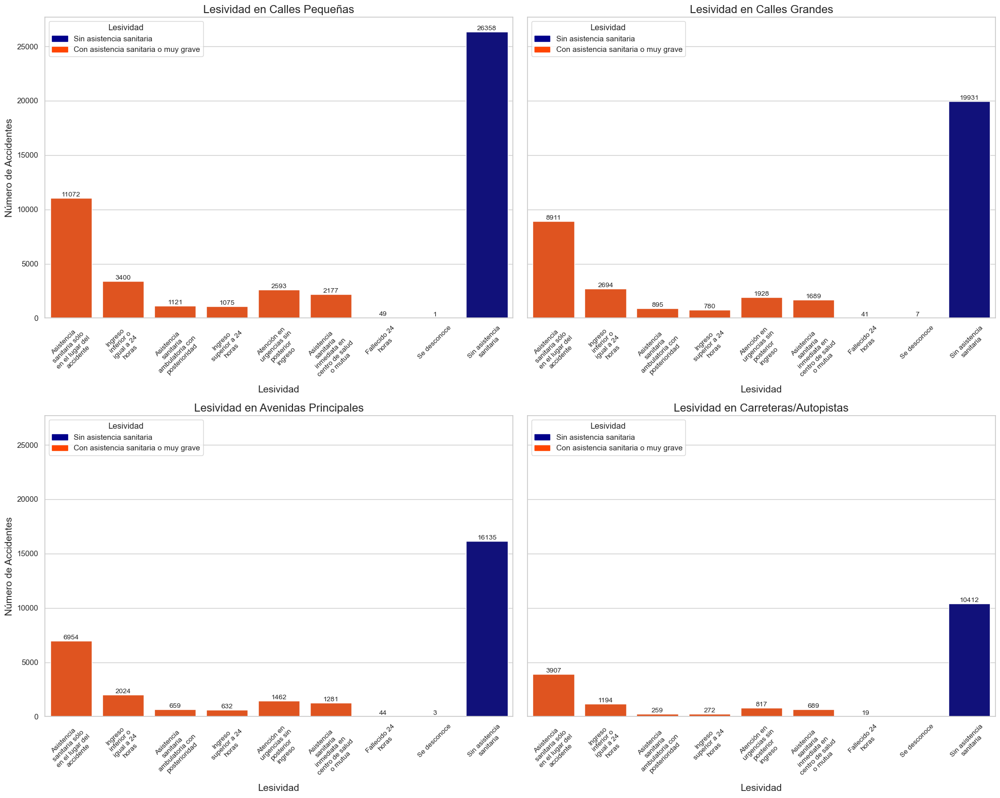

In [7]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import logging
import textwrap
from matplotlib.patches import Patch  # Importar para crear la leyenda personalizada

# Configurar el logging para obtener información durante el proceso
logging.basicConfig(level=logging.INFO, format='%(asctime)s - %(levelname)s - %(message)s')

# Supongamos que tu DataFrame original se llama df_unido
# Crear una copia para evitar modificar el DataFrame original
df_copy = df_unido.copy()

# Verificar que las columnas necesarias existen
required_columns = ['vehiculo_mas_4_ruedas', 'lesividad', 'hora', 'mapped_highway']
for col in required_columns:
    if col not in df_copy.columns:
        raise ValueError(f"La columna '{col}' no existe en el DataFrame.")

# 1. Mapear los valores de 'mapped_highway' a 'tipo_via'
def mapear_tipo_via(mapped_highway):
    """
    Mapea los valores de 'mapped_highway' a categorías de tipos de vía.
    
    Args:
        mapped_highway (str): Valor original de 'mapped_highway'.
        
    Returns:
        str: Categoría de tipo de vía.
    """
    calles_pequeñas = ['residential', 'living_street']
    calles_grandes = ['tertiary', 'secondary', 'busway', 'tertiary_link', 'secondary_link']
    avenidas_principales = ['primary', 'primary_link']
    carreteras_autopistas = ['motorway', 'motorway_link', 'trunk', 'trunk_link']
    
    if mapped_highway in calles_pequeñas:
        return 'Calles Pequeñas'
    elif mapped_highway in calles_grandes:
        return 'Calles Grandes'
    elif mapped_highway in avenidas_principales:
        return 'Avenidas Principales'
    elif mapped_highway in carreteras_autopistas:
        return 'Carreteras/Autopistas'
    else:
        return 'Unclassified'

# Aplicar la función para crear la nueva columna 'tipo_via'
df_copy['tipo_via'] = df_copy['mapped_highway'].apply(mapear_tipo_via)

# 2. Eliminar los registros clasificados como 'Unclassified'
initial_count = len(df_copy)
df_copy = df_copy[df_copy['tipo_via'] != 'Unclassified'].copy()
final_count = len(df_copy)
logging.info(f"Registros eliminados: {initial_count - final_count}")

# 3. Añadir la columna 'asistencia_sanitaria' manejando valores nulos
df_copy['asistencia_sanitaria'] = df_copy['lesividad'].apply(
    lambda x: 0 if pd.notnull(x) and x.strip().lower() == 'sin asistencia sanitaria' else (1 if pd.notna(x) else None)
)

# Verificar los valores únicos en 'tipo_via' y 'asistencia_sanitaria'
logging.info(f"Valores únicos en 'tipo_via': {df_copy['tipo_via'].unique()}")
logging.info(f"Valores únicos en 'asistencia_sanitaria': {df_copy['asistencia_sanitaria'].unique()}")

# 4. Calcular los porcentajes de asistencia sanitaria por tipo de vía
conteos = df_copy.groupby(['tipo_via', 'asistencia_sanitaria']).size().reset_index(name='conteo')

# Pivotear el DataFrame para tener 'asistencia_sanitaria' como columnas
pivot_conteos = conteos.pivot(index='tipo_via', columns='asistencia_sanitaria', values='conteo').fillna(0).astype(int)

# Renombrar las columnas para mayor claridad
pivot_conteos = pivot_conteos.rename(columns={0: 'Sin Asistencia Sanitaria', 1: 'Con Asistencia Sanitaria'})

# Calcular los porcentajes
pivot_conteos['Total'] = pivot_conteos['Sin Asistencia Sanitaria'] + pivot_conteos['Con Asistencia Sanitaria']
pivot_conteos['Porcentaje_Sin_Asistencia_Sanitaria'] = (pivot_conteos['Sin Asistencia Sanitaria'] / pivot_conteos['Total']) * 100
pivot_conteos['Porcentaje_Con_Asistencia_Sanitaria'] = (pivot_conteos['Con Asistencia Sanitaria'] / pivot_conteos['Total']) * 100

# Redondear los porcentajes a dos decimales
pivot_conteos['Porcentaje_Sin_Asistencia_Sanitaria'] = pivot_conteos['Porcentaje_Sin_Asistencia_Sanitaria'].round(2)
pivot_conteos['Porcentaje_Con_Asistencia_Sanitaria'] = pivot_conteos['Porcentaje_Con_Asistencia_Sanitaria'].round(2)

# Ordenar las categorías de 'tipo_via' de forma lógica
tipo_via_ordenado = ['Calles Pequeñas', 'Calles Grandes', 'Avenidas Principales', 'Carreteras/Autopistas']
pivot_conteos = pivot_conteos.reindex(tipo_via_ordenado)

# Eliminar la columna 'Total' si no es necesaria
pivot_conteos = pivot_conteos.drop(columns=['Total'])

# Mostrar el DataFrame resultante
print("Porcentaje de Asistencia Sanitaria por Tipo de Vía:\n")
print(pivot_conteos[['Porcentaje_Sin_Asistencia_Sanitaria', 'Porcentaje_Con_Asistencia_Sanitaria']])

# 5. Crear cuatro histogramas (count plots) para la distribución de 'lesividad' por 'tipo_via'
# Opcional: Ajustar el estilo de seaborn
sns.set(style="whitegrid")

# Configurar parámetros para la visualización
LABEL_FONT_SIZE = 10       # Tamaño de la fuente para las etiquetas y anotaciones
LABEL_WRAP_WIDTH = 15      # Ancho máximo de caracteres por línea en las etiquetas

# Función para ajustar etiquetas largas
def wrap_labels(labels, width=15):
    """
    Ajusta las etiquetas largas insertando saltos de línea.
    
    Args:
        labels (List[str]): Lista de etiquetas originales.
        width (int): Número máximo de caracteres por línea.
    
    Returns:
        List[str]: Lista de etiquetas ajustadas con saltos de línea.
    """
    wrapped_labels = []
    for label in labels:
        wrapped = '\n'.join(textwrap.wrap(label, width=width))
        wrapped_labels.append(wrapped)
    return wrapped_labels

# Crear una figura con cuatro subplots (2 filas x 2 columnas)
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(20, 16), sharey=True)

# Definir las categorías de 'tipo_via' en orden
tipo_via_categories = ['Calles Pequeñas', 'Calles Grandes', 'Avenidas Principales', 'Carreteras/Autopistas']

# Función para crear gráficos de barras con colores personalizados y leyenda
def crear_grafico_barras(df, tipo_via, ax):
    """
    Crea un gráfico de barras para un tipo de vía específico.
    
    Args:
        df (DataFrame): DataFrame filtrado por el tipo de vía.
        tipo_via (str): Nombre del tipo de vía.
        ax (matplotlib.axes.Axes): Eje donde se dibujará el gráfico.
    """
    # Definir los colores específicos para las categorías
    palette_colors = {
        'Sin asistencia sanitaria': 'darkblue',  # azul oscuro
    }
    
    # Obtener todas las categorías posibles de 'lesividad', excluyendo nulos
    categorias_lesividad = df_copy['lesividad'].dropna().unique().tolist()
    
    # Mover 'Sin asistencia sanitaria' al final de la lista de categorías
    if 'Sin asistencia sanitaria' in categorias_lesividad:
        categorias_lesividad.remove('Sin asistencia sanitaria')
        categorias_lesividad.append('Sin asistencia sanitaria')
    
    # Asignar un color naranja no chillón al resto de las categorías
    for categoria in categorias_lesividad:
        if categoria != 'Sin asistencia sanitaria':
            palette_colors[categoria] = 'orangered'  # naranja no chillón
    
    # Crear el gráfico de barras con la paleta personalizada y orden de categorías
    sns.countplot(
        data=df,
        x='lesividad',
        ax=ax,
        palette=palette_colors,
        order=categorias_lesividad  # Orden personalizado de las categorías
    )
    
    ax.set_title(f'Lesividad en {tipo_via}', fontsize=16)
    ax.set_xlabel('Lesividad', fontsize=14)
    ax.set_ylabel('Número de Accidentes', fontsize=14)
    ax.tick_params(axis='x', rotation=45)
    
    # Ajustar las etiquetas del eje x para el subplot
    original_labels = [label.get_text() for label in ax.get_xticklabels()]
    wrapped_labels = wrap_labels(original_labels, width=LABEL_WRAP_WIDTH)
    ax.set_xticklabels(wrapped_labels, fontsize=LABEL_FONT_SIZE)
    
    # Añadir anotaciones de conteo en cada barra
    for p in ax.patches:
        count = int(p.get_height())
        ax.annotate(f'{count}',
                    (p.get_x() + p.get_width() / 2., count),
                    ha='center', va='bottom', fontsize=LABEL_FONT_SIZE)
    
    # Añadir la leyenda personalizada en la parte superior izquierda
    legend_elements = [
        Patch(facecolor='darkblue', edgecolor='darkblue', label='Sin asistencia sanitaria'),
        Patch(facecolor='orangered', edgecolor='orangered', label='Con asistencia sanitaria o muy grave'),
    ]
    
    ax.legend(handles=legend_elements, title='Lesividad', loc='upper left')

# Iterar sobre cada tipo de vía y su subplot correspondiente
for tipo_via, ax in zip(tipo_via_categories, axes.flatten()):
    # Filtrar el DataFrame para el tipo de vía actual
    df_tipo_via = df_copy[df_copy['tipo_via'] == tipo_via]
    
    if df_tipo_via.empty:
        logging.warning(f"No hay datos para el tipo de vía '{tipo_via}'.")
        ax.set_title(f'No hay datos para {tipo_via}', fontsize=16)
        ax.axis('off')  # Ocultar el eje si no hay datos
        continue

    logging.info(f"Creando gráfico para el tipo de vía '{tipo_via}' con {len(df_tipo_via)} registros.")

    # Crear el gráfico de barras
    crear_grafico_barras(df_tipo_via, tipo_via, ax)

# Ajustar el espacio entre subplots para evitar superposiciones
plt.tight_layout()

# Mostrar los gráficos
plt.show()



In [ ]:
df_copy

<class 'pandas.core.series.Series'>
RangeIndex: 239935 entries, 0 to 239934
Series name: lesividad
Non-Null Count   Dtype 
--------------   ----- 
131485 non-null  object
dtypes: object(1)
memory usage: 1.8+ MB


## Lesividad en función de la velocidad máxima

In [8]:
import pandas as pd
import logging

# (Opcional) Para visualizaciones futuras
import matplotlib.pyplot as plt
import seaborn as sns
import textwrap

# Configurar el logging para obtener información durante el proceso
logging.basicConfig(level=logging.INFO, format='%(asctime)s - %(levelname)s - %(message)s')

# Supongamos que tu DataFrame original se llama df_unido
# Crear una copia para evitar modificar el DataFrame original
df_copy = df_unido.copy()

# 1. Verificar que las columnas necesarias existen
required_columns = ['vehiculo_mas_4_ruedas', 'lesividad', 'hora', 'mapped_highway', 'speed_limit']
for col in required_columns:
    if col not in df_copy.columns:
        raise ValueError(f"La columna '{col}' no existe en el DataFrame.")

# 2. Verificar y convertir la columna 'speed_limit' a tipo numérico
# Asumiendo que 'speed_limit' está en km/h
df_copy['speed_limit'] = pd.to_numeric(df_copy['speed_limit'], errors='coerce')

# Verificar si hay valores NaN después de la conversión
if df_copy['speed_limit'].isnull().any():
    num_na = df_copy['speed_limit'].isnull().sum()
    logging.warning(f"Hay {num_na} valores NaN en la columna 'speed_limit' después de la conversión. Estos registros serán eliminados.")
    # Opcional: Eliminar registros con 'speed_limit' NaN
    df_copy = df_copy.dropna(subset=['speed_limit']).copy()

# 3. Definir los rangos de velocidad (bins) de 20 en 20 km/h
# Determinar el rango mínimo y máximo de 'speed_limit'
min_speed = df_copy['speed_limit'].min()
max_speed = df_copy['speed_limit'].max()


# Crear los límites de los bins
# Por ejemplo, si max_speed=130, los bins serán 0-20, 20-40, ..., 120-140
bin_width = 20
bins = list(range(0, int(max_speed) + bin_width, bin_width))
# Asegurarse de que el último bin incluya el valor máximo
if max_speed > bins[-1]:
    bins.append(bins[-1] + bin_width)

# Definir las etiquetas para los bins
bin_labels = [f"{bins[i]}-{bins[i+1]} km/h" for i in range(len(bins)-1)]

# Crear la columna 'speed_bin' usando pd.cut
df_copy['speed_bin'] = pd.cut(
    df_copy['speed_limit'],
    bins=bins,
    labels=bin_labels,
    right=False,  # Define si el intervalo es cerrado a la izquierda o derecha
    include_lowest=True  # Incluir el límite inferior en el primer bin
)

# Verificar la distribución de los bins
logging.info(f"Distribución de 'speed_bin':\n{df_copy['speed_bin'].value_counts().sort_index()}")

# 4. Añadir la columna 'asistencia_sanitaria'
# Suponiendo que 'lesividad' está correctamente etiquetada
df_copy['asistencia_sanitaria'] = df_copy['lesividad'].apply(
    lambda x: 0 if isinstance(x, str) and x.strip().lower() == 'sin asistencia sanitaria' else (1 if pd.notna(x) else None)
)

# Verificar los valores únicos en 'asistencia_sanitaria'
logging.info(f"Valores únicos en 'asistencia_sanitaria': {df_copy['asistencia_sanitaria'].unique()}")

# 5. Calcular los porcentajes por 'speed_bin'
# Agrupar por 'speed_bin' y 'asistencia_sanitaria' y contar los registros
conteos = df_copy.groupby(['speed_bin', 'asistencia_sanitaria']).size().reset_index(name='conteo')

# Pivotear el DataFrame para tener 'asistencia_sanitaria' como columnas
pivot_conteos = conteos.pivot(index='speed_bin', columns='asistencia_sanitaria', values='conteo').fillna(0).astype(int)

# Renombrar las columnas para mayor claridad
pivot_conteos = pivot_conteos.rename(columns={0: 'Sin Asistencia Sanitaria', 1: 'Con Asistencia Sanitaria'})

# Calcular los porcentajes
pivot_conteos['Total'] = pivot_conteos['Sin Asistencia Sanitaria'] + pivot_conteos['Con Asistencia Sanitaria']
pivot_conteos['Porcentaje_Sin_Asistencia_Sanitaria'] = (pivot_conteos['Sin Asistencia Sanitaria'] / pivot_conteos['Total']) * 100
pivot_conteos['Porcentaje_Con_Asistencia_Sanitaria'] = (pivot_conteos['Con Asistencia Sanitaria'] / pivot_conteos['Total']) * 100

# Redondear los porcentajes a dos decimales
pivot_conteos['Porcentaje_Sin_Asistencia_Sanitaria'] = pivot_conteos['Porcentaje_Sin_Asistencia_Sanitaria'].round(2)
pivot_conteos['Porcentaje_Con_Asistencia_Sanitaria'] = pivot_conteos['Porcentaje_Con_Asistencia_Sanitaria'].round(2)

# Ordenar los bins de velocidad de forma lógica
pivot_conteos = pivot_conteos.sort_index()

# Eliminar la columna 'Total' si no es necesaria
pivot_conteos = pivot_conteos.drop(columns=['Total'])

# Mostrar el DataFrame resultante
print("Porcentaje de Asistencia Sanitaria por Rango de Velocidad:\n")
print(pivot_conteos[['Porcentaje_Sin_Asistencia_Sanitaria', 'Porcentaje_Con_Asistencia_Sanitaria']])


2024-11-11 03:26:31,680 - INFO - Distribución de 'speed_bin':
speed_bin
0-20 km/h           61
20-40 km/h       82644
40-60 km/h      132792
60-80 km/h        7805
80-100 km/h      16144
100-120 km/h       462
Name: count, dtype: int64
2024-11-11 03:26:31,933 - INFO - Valores únicos en 'asistencia_sanitaria': [ 1. nan  0.]


Porcentaje de Asistencia Sanitaria por Rango de Velocidad:

asistencia_sanitaria  Porcentaje_Sin_Asistencia_Sanitaria  \
speed_bin                                                   
0-20 km/h                                           40.00   
20-40 km/h                                          55.27   
40-60 km/h                                          54.64   
60-80 km/h                                          58.19   
80-100 km/h                                         61.17   
100-120 km/h                                        57.84   

asistencia_sanitaria  Porcentaje_Con_Asistencia_Sanitaria  
speed_bin                                                  
0-20 km/h                                           60.00  
20-40 km/h                                          44.73  
40-60 km/h                                          45.36  
60-80 km/h                                          41.81  
80-100 km/h                                         38.83  
100-120 km/h                   

C:\Users\JUAMARIO\AppData\Local\Temp\ipykernel_7852\2611073477.py:73: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  conteos = df_copy.groupby(['speed_bin', 'asistencia_sanitaria']).size().reset_index(name='conteo')


## Lesividad en función de las columnas meteorológicas

Precipitaciones

In [12]:
df_categoria.info()

<class 'pandas.core.frame.DataFrame'>
Index: 14826 entries, 2013 to 239762
Data columns (total 56 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Unnamed: 0             14826 non-null  int64  
 1   index                  14826 non-null  int64  
 2   num_expediente         14826 non-null  object 
 3   fecha                  14826 non-null  object 
 4   hora                   14826 non-null  object 
 5   localizacion           14826 non-null  object 
 6   numero                 14826 non-null  object 
 7   cod_distrito           14826 non-null  float64
 8   distrito               14826 non-null  object 
 9   tipo_accidente         14825 non-null  object 
 10  estado_meteorológico   14824 non-null  object 
 11  tipo_vehiculo          14794 non-null  object 
 12  tipo_persona           14826 non-null  object 
 13  rango_edad             14826 non-null  object 
 14  sexo                   14826 non-null  object 
 15  cod

In [19]:
df_unido['precipitaciones(mm)'].info()

<class 'pandas.core.series.Series'>
RangeIndex: 239935 entries, 0 to 239934
Series name: precipitaciones(mm)
Non-Null Count   Dtype  
--------------   -----  
239935 non-null  float64
dtypes: float64(1)
memory usage: 1.8 MB


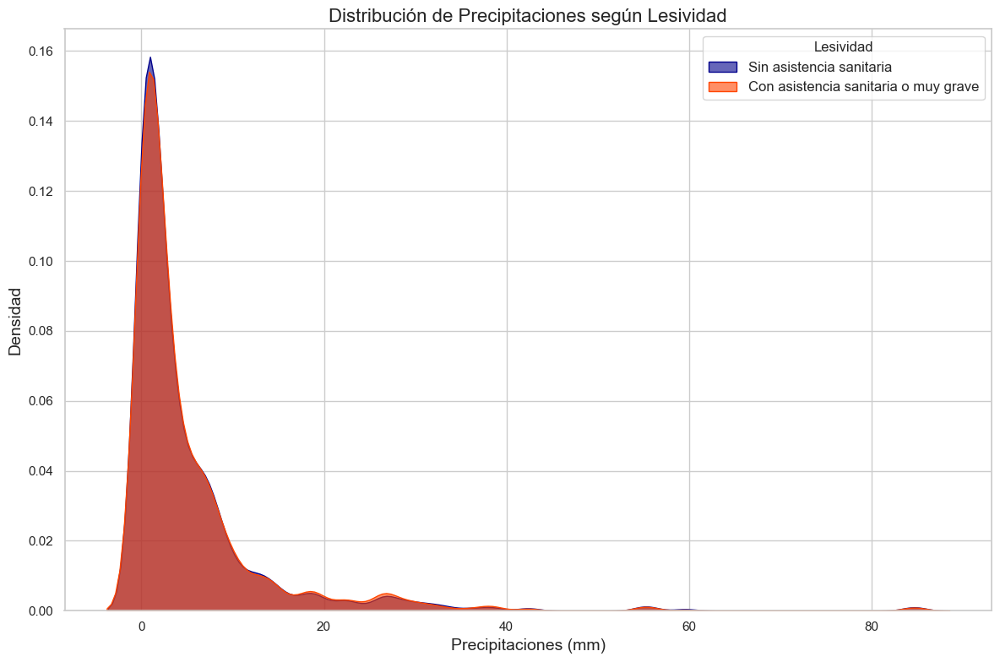

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import logging

# Configurar el logging para obtener información durante el proceso
logging.basicConfig(level=logging.INFO, format='%(asctime)s - %(levelname)s - %(message)s')

# Configurar el estilo de Seaborn
sns.set(style="whitegrid")

# Supongamos que tu DataFrame original se llama df_unido
# Crear una copia para evitar modificar el DataFrame original
df_copy = df_unido.copy()

# Verificar que las columnas necesarias existen
required_columns = ['lesividad', 'precipitaciones(mm)']
for col in required_columns:
    if col not in df_copy.columns:
        raise ValueError(f"La columna '{col}' no existe en el DataFrame.")

# Manejar valores nulos en 'lesividad' y 'precipitaciones(mm)'
df_copy = df_copy.dropna(subset=['lesividad', 'precipitaciones(mm)']).copy()

# Convertir 'precipitaciones(mm)' a numérico si no lo está
df_copy['precipitaciones(mm)'] = pd.to_numeric(df_copy['precipitaciones(mm)'], errors='coerce')

# Filtrar nuevamente por posibles NaNs después de la conversión
df_copy = df_copy.dropna(subset=['precipitaciones(mm)']).copy()

# **Agregar el filtro para precipitaciones > 0 mm**
df_copy = df_copy[df_copy['precipitaciones(mm)'] > 0].copy()

# Crear una nueva columna para categorizar 'lesividad'
def categorizar_lesividad(x):
    if pd.notnull(x) and x.strip().lower() == 'sin asistencia sanitaria':
        return 'Sin asistencia sanitaria'
    else:
        return 'Con asistencia sanitaria o muy grave'

df_copy['lesividad_categoria'] = df_copy['lesividad'].apply(categorizar_lesividad)

# Definir los colores específicos
palette_colors = {
    'Sin asistencia sanitaria': 'darkblue',    # azul oscuro
    'Con asistencia sanitaria o muy grave': 'orangered'  # naranja no chillón
}

# Crear el gráfico de densidad (KDE)
plt.figure(figsize=(12, 8))

# Graficar la distribución para cada categoría
for categoria, color in palette_colors.items():
    # Filtrar el DataFrame por la categoría actual
    df_categoria = df_copy[df_copy['lesividad_categoria'] == categoria]
    
    # Verificar que haya datos suficientes para graficar
    if len(df_categoria) == 0:
        logging.warning(f"No hay datos para la categoría '{categoria}'.")
        continue
    
    sns.kdeplot(
        data=df_categoria,
        x='precipitaciones(mm)',
        fill=True,
        common_norm=False,
        alpha=0.6,
        color=color,
        label=categoria,
        bw_adjust=1  # Puedes ajustar este parámetro para suavizar la curva
    )

# Configurar las etiquetas y el título
plt.xlabel('Precipitaciones (mm)', fontsize=14)
plt.ylabel('Densidad', fontsize=14)
plt.title('Distribución de Precipitaciones según Lesividad', fontsize=16)

# Añadir la leyenda
plt.legend(title='Lesividad', loc='upper right', fontsize=12)

# Mostrar el gráfico
plt.tight_layout()
plt.show()


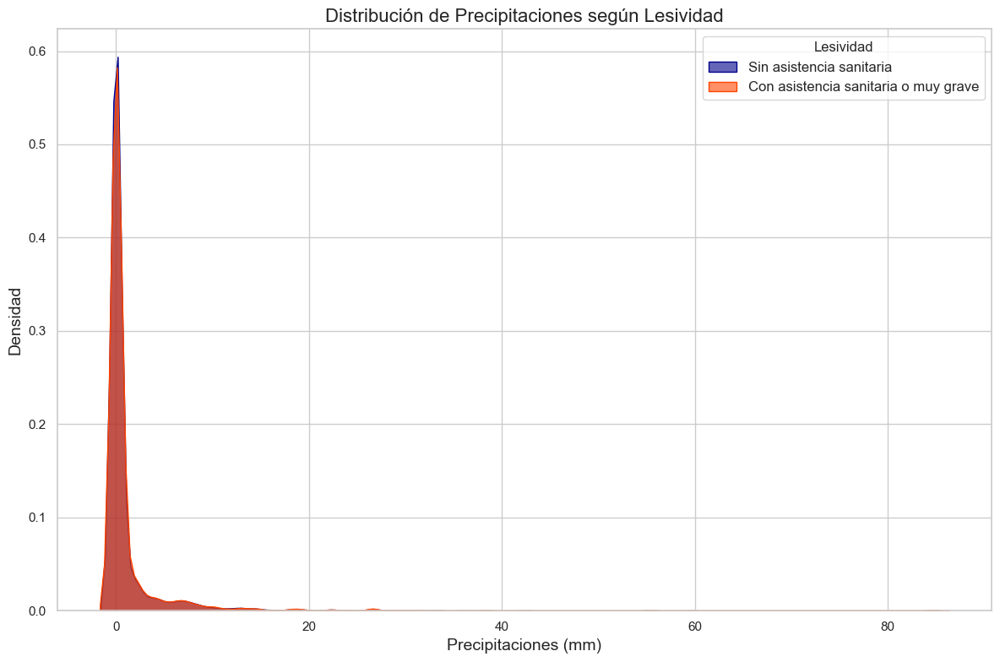

In [32]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import logging

# Configurar el logging para obtener información durante el proceso
logging.basicConfig(level=logging.INFO, format='%(asctime)s - %(levelname)s - %(message)s')

# Configurar el estilo de Seaborn
sns.set(style="whitegrid")

# Supongamos que tu DataFrame original se llama df_unido
# Crear una copia para evitar modificar el DataFrame original
df_copy = df_unido.copy()

# Verificar que las columnas necesarias existen
required_columns = ['lesividad', 'precipitaciones(mm)']
for col in required_columns:
    if col not in df_copy.columns:
        raise ValueError(f"La columna '{col}' no existe en el DataFrame.")

# Manejar valores nulos en 'lesividad' y 'precipitaciones(mm)'
df_copy = df_copy.dropna(subset=['lesividad', 'precipitaciones(mm)']).copy()

# Convertir 'precipitaciones(mm)' a numérico si no lo está
df_copy['precipitaciones(mm)'] = pd.to_numeric(df_copy['precipitaciones(mm)'], errors='coerce')

# Filtrar nuevamente por posibles NaNs después de la conversión
df_copy = df_copy.dropna(subset=['precipitaciones(mm)']).copy()

# Crear una nueva columna para categorizar 'lesividad'
def categorizar_lesividad(x):
    if pd.notnull(x) and x.strip().lower() == 'sin asistencia sanitaria':
        return 'Sin asistencia sanitaria'
    else:
        return 'Con asistencia sanitaria o muy grave'

df_copy['lesividad_categoria'] = df_copy['lesividad'].apply(categorizar_lesividad)

# Definir los colores específicos
palette_colors = {
    'Sin asistencia sanitaria': 'darkblue',    # azul oscuro
    'Con asistencia sanitaria o muy grave': 'orangered'  # naranja no chillón
}

# Crear el gráfico de densidad (KDE)
plt.figure(figsize=(12, 8))

# Graficar la distribución para cada categoría
for categoria, color in palette_colors.items():
    # Filtrar el DataFrame por la categoría actual
    df_categoria = df_copy[df_copy['lesividad_categoria'] == categoria]
    
    # Verificar que haya datos suficientes para graficar
    if len(df_categoria) == 0:
        logging.warning(f"No hay datos para la categoría '{categoria}'.")
        continue
    
    sns.kdeplot(
        data=df_categoria,
        x='precipitaciones(mm)',
        fill=True,
        common_norm=False,
        alpha=0.6,
        color=color,
        label=categoria,
        bw_adjust=1  # Puedes ajustar este parámetro para suavizar la curva
    )

# Configurar las etiquetas y el título
plt.xlabel('Precipitaciones (mm)', fontsize=14)
plt.ylabel('Densidad', fontsize=14)
plt.title('Distribución de Precipitaciones según Lesividad', fontsize=16)

# Añadir la leyenda
plt.legend(title='Lesividad', loc='upper right', fontsize=12)

# Mostrar el gráfico
plt.tight_layout()
plt.show()


In [44]:
df_unido.columns

Index(['Unnamed: 0', 'index', 'num_expediente', 'fecha', 'hora',
       'localizacion', 'numero', 'cod_distrito', 'distrito', 'tipo_accidente',
       'estado_meteorológico', 'tipo_vehiculo', 'tipo_persona', 'rango_edad',
       'sexo', 'cod_lesividad', 'lesividad', 'coordenada_x_utm',
       'coordenada_y_utm', 'positiva_alcohol', 'positiva_droga', 'longitud',
       'latitud', 'osmid', 'oneway', 'lanes', 'name', 'highway', 'maxspeed',
       'reversed', 'length', 'geometry', 'junction', 'ref', 'tunnel', 'access',
       'bridge', 'width', 'est_width', 'u_v_k', 'edgedistance', 'nodedistance',
       'dia', 'mes', 'año', 'temperatura_media', 'precipitaciones(mm)',
       'velocidad_media_aire', 'ubi', 'mapped_highway', 'speed_limit',
       'speed_bin', 'lanes_filled', 'vehiculo_mas_4_ruedas'],
      dtype='object')

In [42]:
df_unido[df_unido['precipitaciones(mm)'] > 5].info()

<class 'pandas.core.frame.DataFrame'>
Index: 18500 entries, 1965 to 239036
Data columns (total 54 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Unnamed: 0             18500 non-null  int64  
 1   index                  18500 non-null  int64  
 2   num_expediente         18500 non-null  object 
 3   fecha                  18500 non-null  object 
 4   hora                   18500 non-null  object 
 5   localizacion           18500 non-null  object 
 6   numero                 18500 non-null  object 
 7   cod_distrito           18500 non-null  float64
 8   distrito               18500 non-null  object 
 9   tipo_accidente         18500 non-null  object 
 10  estado_meteorológico   16584 non-null  object 
 11  tipo_vehiculo          18412 non-null  object 
 12  tipo_persona           18500 non-null  object 
 13  rango_edad             18500 non-null  object 
 14  sexo                   18500 non-null  object 
 15  cod

In [39]:
df_unido['precipitaciones(mm)'].value_counts()

precipitaciones(mm)
0.0     179189
0.1       6164
0.2       3318
0.4       2326
0.5       2063
         ...  
19.3        37
13.2        33
18.1        26
17.8        20
9.5          7
Name: count, Length: 141, dtype: int64

In [38]:
df_unido[df_unido['lesividad'] != 'Sin asistencia sanitaria']['precipitaciones(mm)'].describe()

count    167099.000000
mean          1.348003
std           5.052827
min           0.000000
25%           0.000000
50%           0.000000
75%           0.100000
max          84.700000
Name: precipitaciones(mm), dtype: float64

In [37]:
df_unido[df_unido['lesividad'] == 'Sin asistencia sanitaria']['precipitaciones(mm)'].describe()

count    72836.000000
mean         1.272151
std          4.924069
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max         84.700000
Name: precipitaciones(mm), dtype: float64

Velocidad media del aire:

In [46]:
df_unido.columns

Index(['Unnamed: 0', 'index', 'num_expediente', 'fecha', 'hora',
       'localizacion', 'numero', 'cod_distrito', 'distrito', 'tipo_accidente',
       'estado_meteorológico', 'tipo_vehiculo', 'tipo_persona', 'rango_edad',
       'sexo', 'cod_lesividad', 'lesividad', 'coordenada_x_utm',
       'coordenada_y_utm', 'positiva_alcohol', 'positiva_droga', 'longitud',
       'latitud', 'osmid', 'oneway', 'lanes', 'name', 'highway', 'maxspeed',
       'reversed', 'length', 'geometry', 'junction', 'ref', 'tunnel', 'access',
       'bridge', 'width', 'est_width', 'u_v_k', 'edgedistance', 'nodedistance',
       'dia', 'mes', 'año', 'temperatura_media', 'precipitaciones(mm)',
       'velocidad_media_aire', 'ubi', 'mapped_highway', 'speed_limit',
       'speed_bin', 'lanes_filled', 'vehiculo_mas_4_ruedas'],
      dtype='object')

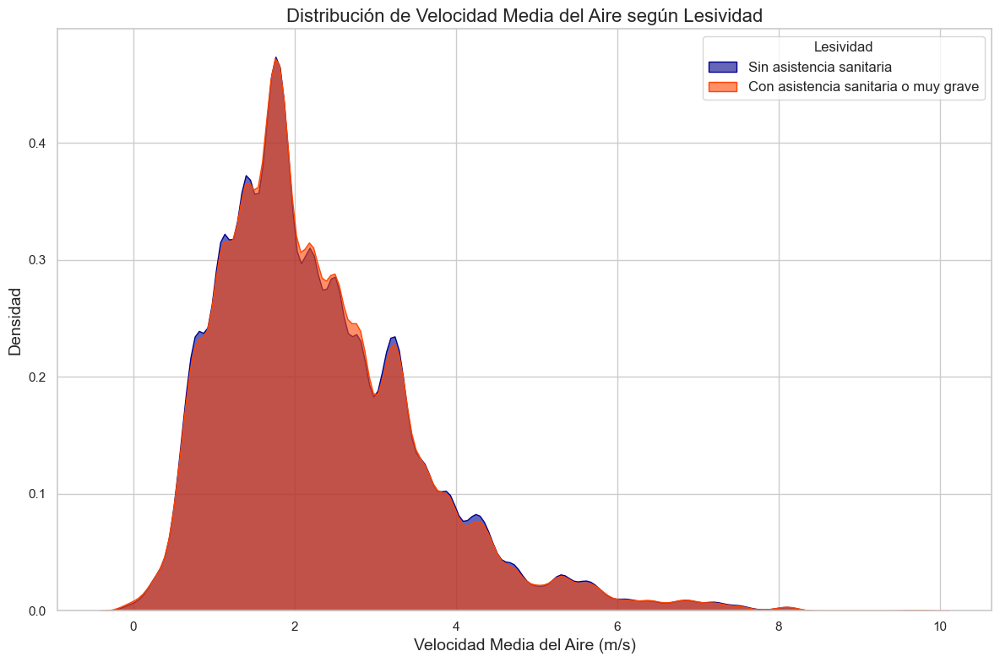

In [45]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import logging

# Configurar el logging para obtener información durante el proceso
logging.basicConfig(level=logging.INFO, format='%(asctime)s - %(levelname)s - %(message)s')

# Configurar el estilo de Seaborn
sns.set(style="whitegrid")

# Supongamos que tu DataFrame original se llama df_unido
# Crear una copia para evitar modificar el DataFrame original
df_copy = df_unido.copy()

# Verificar que las columnas necesarias existen
required_columns = ['lesividad', 'velocidad_media_aire']
for col in required_columns:
    if col not in df_copy.columns:
        raise ValueError(f"La columna '{col}' no existe en el DataFrame.")

# Manejar valores nulos en 'lesividad' y 'velocidad_media_aire'
df_copy = df_copy.dropna(subset=['lesividad', 'velocidad_media_aire']).copy()

# Convertir 'velocidad_media_aire' a numérico si no lo está
df_copy['velocidad_media_aire'] = pd.to_numeric(df_copy['velocidad_media_aire'], errors='coerce')

# Filtrar nuevamente por posibles NaNs después de la conversión
df_copy = df_copy.dropna(subset=['velocidad_media_aire']).copy()

# Crear una nueva columna para categorizar 'lesividad'
def categorizar_lesividad(x):
    if pd.notnull(x) and x.strip().lower() == 'sin asistencia sanitaria':
        return 'Sin asistencia sanitaria'
    else:
        return 'Con asistencia sanitaria o muy grave'

df_copy['lesividad_categoria'] = df_copy['lesividad'].apply(categorizar_lesividad)

# Definir los colores específicos
palette_colors = {
    'Sin asistencia sanitaria': 'darkblue',    # azul oscuro
    'Con asistencia sanitaria o muy grave': 'orangered'  # naranja no chillón
}

# Crear el gráfico de densidad (KDE)
plt.figure(figsize=(12, 8))

# Graficar la distribución para cada categoría
for categoria, color in palette_colors.items():
    # Filtrar el DataFrame por la categoría actual
    df_categoria = df_copy[df_copy['lesividad_categoria'] == categoria]
    
    # Verificar que haya datos suficientes para graficar
    if len(df_categoria) == 0:
        logging.warning(f"No hay datos para la categoría '{categoria}'.")
        continue
    
    sns.kdeplot(
        data=df_categoria,
        x='velocidad_media_aire',
        fill=True,
        common_norm=False,
        alpha=0.6,
        color=color,
        label=categoria,
        bw_adjust=1  # Puedes ajustar este parámetro para suavizar la curva
    )

# Configurar las etiquetas y el título
plt.xlabel('Velocidad Media del Aire (m/s)', fontsize=14)
plt.ylabel('Densidad', fontsize=14)
plt.title('Distribución de Velocidad Media del Aire según Lesividad', fontsize=16)

# Añadir la leyenda
plt.legend(title='Lesividad', loc='upper right', fontsize=12)

# Mostrar el gráfico
plt.tight_layout()
plt.show()


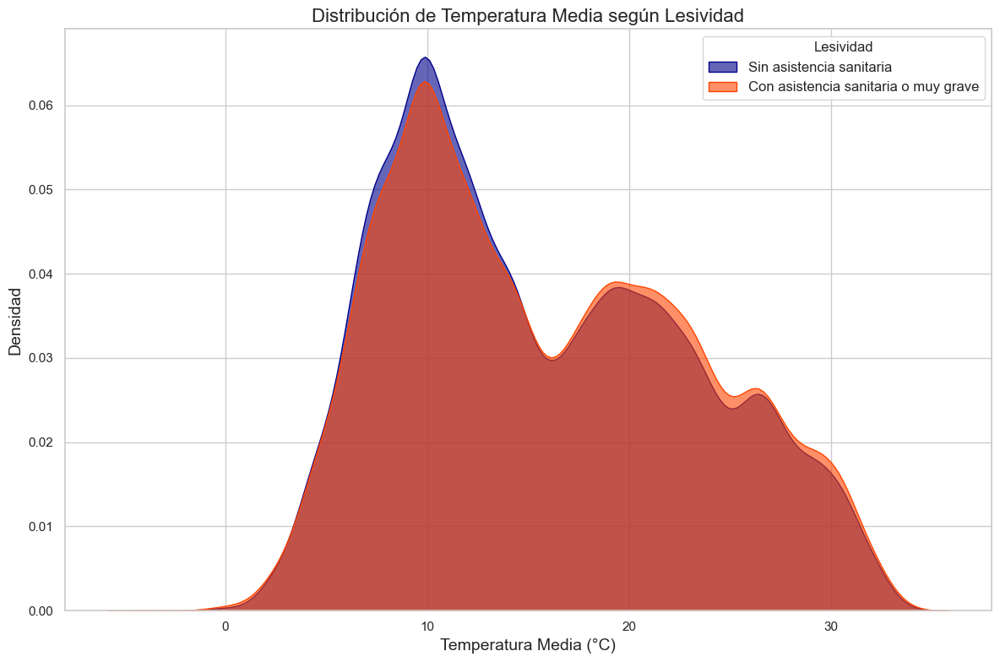

In [48]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import logging

# Configurar el logging para obtener información durante el proceso
logging.basicConfig(level=logging.INFO, format='%(asctime)s - %(levelname)s - %(message)s')

# Configurar el estilo de Seaborn
sns.set(style="whitegrid")

# Supongamos que tu DataFrame original se llama df_unido
# Crear una copia para evitar modificar el DataFrame original
df_copy = df_unido.copy()

# Verificar que las columnas necesarias existen
required_columns = ['lesividad', 'temperatura_media']
for col in required_columns:
    if col not in df_copy.columns:
        raise ValueError(f"La columna '{col}' no existe en el DataFrame.")

# Manejar valores nulos en 'lesividad' y 'temperatura_media'
df_copy = df_copy.dropna(subset=['lesividad', 'temperatura_media']).copy()

# Convertir 'temperatura_media' a numérico si no lo está
df_copy['temperatura_media'] = pd.to_numeric(df_copy['temperatura_media'], errors='coerce')

# Filtrar nuevamente por posibles NaNs después de la conversión
df_copy = df_copy.dropna(subset=['temperatura_media']).copy()

# Crear una nueva columna para categorizar 'lesividad'
def categorizar_lesividad(x):
    if pd.notnull(x) and x.strip().lower() == 'sin asistencia sanitaria':
        return 'Sin asistencia sanitaria'
    else:
        return 'Con asistencia sanitaria o muy grave'

df_copy['lesividad_categoria'] = df_copy['lesividad'].apply(categorizar_lesividad)

# Definir los colores específicos
palette_colors = {
    'Sin asistencia sanitaria': 'darkblue',    # azul oscuro
    'Con asistencia sanitaria o muy grave': 'orangered'  # naranja no chillón
}

# Crear el gráfico de densidad (KDE)
plt.figure(figsize=(12, 8))

# Graficar la distribución para cada categoría
for categoria, color in palette_colors.items():
    # Filtrar el DataFrame por la categoría actual
    df_categoria = df_copy[df_copy['lesividad_categoria'] == categoria]
    
    # Verificar que haya datos suficientes para graficar
    if len(df_categoria) == 0:
        logging.warning(f"No hay datos para la categoría '{categoria}'.")
        continue
    
    sns.kdeplot(
        data=df_categoria,
        x='temperatura_media',
        fill=True,
        common_norm=False,
        alpha=0.6,
        color=color,
        label=categoria,
        bw_adjust=1  # Puedes ajustar este parámetro para suavizar la curva
    )

# Configurar las etiquetas y el título
plt.xlabel('Temperatura Media (°C)', fontsize=14)
plt.ylabel('Densidad', fontsize=14)
plt.title('Distribución de Temperatura Media según Lesividad', fontsize=16)

# Añadir la leyenda
plt.legend(title='Lesividad', loc='upper right', fontsize=12)

# Mostrar el gráfico
plt.tight_layout()
plt.show()



## Lesividad en mapa de madrid


In [90]:
df_copy['lesividad_bin'].value_counts()

lesividad_bin
0.0    72836
1.0    58649
Name: count, dtype: int64

In [ ]:
import pandas as pd
import plotly.express as px
import logging

# Configurar el logging para obtener información durante el proceso
logging.basicConfig(level=logging.INFO, format='%(asctime)s - %(levelname)s - %(message)s')

# Supongamos que tu DataFrame original se llama df_unido
# Crear una copia para evitar modificar el DataFrame original
df_copy = df_unido.copy()

# 1. Verificar que las columnas necesarias existen
required_columns = ['latitud', 'longitud', 'lesividad']
for col in required_columns:
    if col not in df_copy.columns:
        raise ValueError(f"La columna '{col}' no existe en el DataFrame.")

# 2. Convertir 'latitud' y 'longitud' a tipo numérico
df_copy['latitud'] = pd.to_numeric(df_copy['latitud'], errors='coerce')
df_copy['longitud'] = pd.to_numeric(df_copy['longitud'], errors='coerce')

# 3. Eliminar registros con coordenadas faltantes
initial_count = len(df_copy)
df_copy = df_copy.dropna(subset=['latitud', 'longitud']).copy()
final_count = len(df_copy)
logging.info(f"Registros eliminados por coordenadas faltantes: {initial_count - final_count}")

# 4. (Opcional) Verificar que las coordenadas están dentro del rango válido para Madrid
# Madrid aproximadamente: latitud 40.3° a 40.8°, longitud -4.5° a -3.3°
df_copy = df_copy[
    (df_copy['latitud'] >= 40.3) & (df_copy['latitud'] <= 40.8) &
    (df_copy['longitud'] >= -4.5) & (df_copy['longitud'] <= -3.3)
].copy()
logging.info(f"Registros después de verificar rangos de coordenadas: {len(df_copy)}")

# 5. Transformar la columna 'lesividad' a 'lesividad_bin'
df_copy['lesividad_bin'] = df_copy['lesividad'].apply(
    lambda x: 'Sin Asistencia Sanitaria' if isinstance(x, str) and x.strip().lower() == 'sin asistencia sanitaria' else 'Con Asistencia Sanitaria'
)

# Verificar los valores únicos en 'lesividad_bin'
categorias_lesividad_bin = df_copy['lesividad_bin'].unique()
logging.info(f"Categorías únicas en 'lesividad_bin': {categorias_lesividad_bin}")

# 6. Definir el mapeo de colores
color_mapping = {
    'Sin Asistencia Sanitaria': 'blue',
    'Con Asistencia Sanitaria': 'red'
}

# 7. Crear el mapa interactivo con Plotly Express
fig = px.scatter_mapbox(
    df_copy,
    lat='latitud',
    lon='longitud',
    color='lesividad_bin',
    title='Mapa Interactivo de Accidentes de Tráfico en Madrid por Asistencia Sanitaria',
    labels={
        'latitud': 'Latitud',
        'longitud': 'Longitud',
        'lesividad_bin': 'Asistencia Sanitaria'
    },
    color_discrete_map=color_mapping,
    opacity=0.6,
    zoom=13,  # Aumentamos el nivel de zoom para una vista más centrada y ampliada
    height=700
)

# Configurar el estilo de mapa
fig.update_layout(
    mapbox_style="open-street-map",  # Puedes cambiar a 'satellite-streets', 'carto-positron', etc.
    legend_title_text='Asistencia Sanitaria',
    width=1200,  # Aumentamos el ancho para una mejor visualización
)

# 8. Ajustar el tamaño y la transparencia de los marcadores
fig.update_traces(
    marker=dict(
        size=5,      # Tamaño más pequeño para los marcadores
        opacity=0.3  # Mayor transparencia para los marcadores
    )
)

# 9. Visualizar el mapa interactivo
fig.show()

# 10. Guardar el mapa interactivo como HTML
fig.write_html('mapa_accidentes_madrid.html')
logging.info("Mapa interactivo guardado como 'mapa_accidentes_madrid.html'.")

# 11. Guardar el mapa estático como imagen PNG
# Asegúrate de tener 'kaleido' instalado: pip install kaleido
fig.write_image('mapa_accidentes_madrid_estatico.png', scale=2)  # scale=2 para mayor resolución
logging.info("Mapa estático guardado como 'mapa_accidentes_madrid_estatico.png'.")
